In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 6
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['specific_humidity'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 6
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

6
179
(84, 2154)
(11, 2154)


[I 2025-05-27 12:38:20,235] A new study created in memory with name: no-name-2939efce-bf6b-4499-8fde-0b1cf003df89
[I 2025-05-27 12:42:48,537] Trial 0 finished with value: 0.5708987891674042 and parameters: {'lr': 0.1789128886046851, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.1379674613041341}. Best is trial 0 with value: 0.5708987891674042.


Cross Validation Accuracies:
[0.35872262716293335, 0.5234607458114624, 1.0349360704421997, 0.4494427442550659, 0.4879317581653595]
Mean Cross Validation Accuracy:
0.5708987891674042
Standard Deviation of Cross Validation Accuracy:
0.23842600075173578


[I 2025-05-27 12:48:46,767] Trial 1 finished with value: 0.07246187999844551 and parameters: {'lr': 0.015476400452974763, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.1927102849052471}. Best is trial 1 with value: 0.07246187999844551.


Cross Validation Accuracies:
[0.054121267050504684, 0.07214369624853134, 0.09582981467247009, 0.06720265001058578, 0.07301197201013565]
Mean Cross Validation Accuracy:
0.07246187999844551
Standard Deviation of Cross Validation Accuracy:
0.01349445661314966


[I 2025-05-27 12:58:31,196] Trial 2 finished with value: 0.07259421348571778 and parameters: {'lr': 0.10161285913617596, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.43136916141849213}. Best is trial 1 with value: 0.07246187999844551.


Cross Validation Accuracies:
[0.05655677616596222, 0.07000365108251572, 0.07908579707145691, 0.0745387077331543, 0.08278613537549973]
Mean Cross Validation Accuracy:
0.07259421348571778
Standard Deviation of Cross Validation Accuracy:
0.009096234347094848


[I 2025-05-27 13:06:31,297] Trial 3 finished with value: 18.277927017211915 and parameters: {'lr': 0.18694026088987184, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.11640058324094334}. Best is trial 1 with value: 0.07246187999844551.


Cross Validation Accuracies:
[21.44573974609375, 13.099832534790039, 20.66639518737793, 20.985822677612305, 15.191844940185547]
Mean Cross Validation Accuracy:
18.277927017211915
Standard Deviation of Cross Validation Accuracy:
3.4470010631796586


[I 2025-05-27 13:12:22,885] Trial 4 finished with value: 0.06293159872293472 and parameters: {'lr': 0.07342571354933257, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.1338174427538188}. Best is trial 4 with value: 0.06293159872293472.


Cross Validation Accuracies:
[0.0635467991232872, 0.04612800106406212, 0.08465602248907089, 0.06842555850744247, 0.05190161243081093]
Mean Cross Validation Accuracy:
0.06293159872293472
Standard Deviation of Cross Validation Accuracy:
0.013465022432233464


[I 2025-05-27 13:17:47,311] Trial 5 finished with value: 0.07489718049764633 and parameters: {'lr': 0.08705272713972631, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.3344676552152238}. Best is trial 4 with value: 0.06293159872293472.


Cross Validation Accuracies:
[0.06507298350334167, 0.08953797072172165, 0.07988187670707703, 0.06921374797821045, 0.07077932357788086]
Mean Cross Validation Accuracy:
0.07489718049764633
Standard Deviation of Cross Validation Accuracy:
0.00877465591443036


[I 2025-05-27 13:23:21,836] Trial 6 finished with value: 0.09863705188035965 and parameters: {'lr': 0.0013387337248762896, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.39856677782208083}. Best is trial 4 with value: 0.06293159872293472.


Cross Validation Accuracies:
[0.07124985009431839, 0.10763335973024368, 0.110194131731987, 0.10242820531129837, 0.1016797125339508]
Mean Cross Validation Accuracy:
0.09863705188035965
Standard Deviation of Cross Validation Accuracy:
0.01405837187931766


[I 2025-05-27 13:28:20,712] Trial 7 finished with value: 5.202222681045532 and parameters: {'lr': 0.37651760901535114, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.13035680008395714}. Best is trial 4 with value: 0.06293159872293472.


Cross Validation Accuracies:
[5.073043346405029, 1.9654972553253174, 5.052545547485352, 7.640259265899658, 6.279767990112305]
Mean Cross Validation Accuracy:
5.202222681045532
Standard Deviation of Cross Validation Accuracy:
1.8772644091065933


[I 2025-05-27 13:33:32,560] Trial 8 finished with value: 0.08449166268110275 and parameters: {'lr': 0.001356208416058894, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.20519560611815618}. Best is trial 4 with value: 0.06293159872293472.


Cross Validation Accuracies:
[0.08910875767469406, 0.09430593997240067, 0.08235631883144379, 0.079835906624794, 0.07685139030218124]
Mean Cross Validation Accuracy:
0.08449166268110275
Standard Deviation of Cross Validation Accuracy:
0.006359986238453267


[I 2025-05-27 13:38:18,230] Trial 9 finished with value: 0.0595512293279171 and parameters: {'lr': 0.2893034807764592, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4601595377273259}. Best is trial 9 with value: 0.0595512293279171.


Cross Validation Accuracies:
[0.0497199147939682, 0.055150460451841354, 0.07406020164489746, 0.060912489891052246, 0.05791307985782623]
Mean Cross Validation Accuracy:
0.0595512293279171
Standard Deviation of Cross Validation Accuracy:
0.008137178305384248


[I 2025-05-27 13:42:37,778] Trial 10 finished with value: 0.07317019477486611 and parameters: {'lr': 0.9383090269699135, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4948074586333657}. Best is trial 9 with value: 0.0595512293279171.


Cross Validation Accuracies:
[0.06174818053841591, 0.08166790753602982, 0.07839950919151306, 0.07616160064935684, 0.06787377595901489]
Mean Cross Validation Accuracy:
0.07317019477486611
Standard Deviation of Cross Validation Accuracy:
0.0073078016124674275


[I 2025-05-27 13:47:40,723] Trial 11 finished with value: 0.05511710345745087 and parameters: {'lr': 0.019515995240437917, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.28169615483059773}. Best is trial 11 with value: 0.05511710345745087.


Cross Validation Accuracies:
[0.04346524551510811, 0.05585827678442001, 0.06289244443178177, 0.06684350967407227, 0.04652604088187218]
Mean Cross Validation Accuracy:
0.05511710345745087
Standard Deviation of Cross Validation Accuracy:
0.009034224013283944


[I 2025-05-27 13:52:52,477] Trial 12 finished with value: 0.06808018907904625 and parameters: {'lr': 0.014723469745141353, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2867830728919626}. Best is trial 11 with value: 0.05511710345745087.


Cross Validation Accuracies:
[0.1018826887011528, 0.056997720152139664, 0.06436320394277573, 0.06554779410362244, 0.05160953849554062]
Mean Cross Validation Accuracy:
0.06808018907904625
Standard Deviation of Cross Validation Accuracy:
0.01764619750358193


[I 2025-05-27 13:59:40,617] Trial 13 finished with value: 0.07168430835008621 and parameters: {'lr': 0.007388137120906666, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3049600806868966}. Best is trial 11 with value: 0.05511710345745087.


Cross Validation Accuracies:
[0.08959460258483887, 0.057678841054439545, 0.06600382924079895, 0.06265182793140411, 0.08249244093894958]
Mean Cross Validation Accuracy:
0.07168430835008621
Standard Deviation of Cross Validation Accuracy:
0.012227845511194666


[I 2025-05-27 14:05:21,435] Trial 14 finished with value: 0.06297665163874626 and parameters: {'lr': 0.004540487592914763, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.24791140939598047}. Best is trial 11 with value: 0.05511710345745087.


Cross Validation Accuracies:
[0.048915911465883255, 0.05061250552535057, 0.09592337161302567, 0.06894513219594955, 0.05048633739352226]
Mean Cross Validation Accuracy:
0.06297665163874626
Standard Deviation of Cross Validation Accuracy:
0.018042691542516056


[I 2025-05-27 14:10:12,235] Trial 15 finished with value: 0.05856545269489288 and parameters: {'lr': 0.026891680901668054, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.37919425949873264}. Best is trial 11 with value: 0.05511710345745087.


Cross Validation Accuracies:
[0.04712099954485893, 0.0533088818192482, 0.07009393721818924, 0.06609185039997101, 0.05621159449219704]
Mean Cross Validation Accuracy:
0.05856545269489288
Standard Deviation of Cross Validation Accuracy:
0.008410711165309214


[I 2025-05-27 14:14:48,124] Trial 16 finished with value: 0.06034770831465721 and parameters: {'lr': 0.02833715862921598, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.36067558866114524}. Best is trial 11 with value: 0.05511710345745087.


Cross Validation Accuracies:
[0.04962572827935219, 0.05812882259488106, 0.06759756803512573, 0.06627713143825531, 0.06010929122567177]
Mean Cross Validation Accuracy:
0.06034770831465721
Standard Deviation of Cross Validation Accuracy:
0.006444527553953945


[I 2025-05-27 14:20:18,346] Trial 17 finished with value: 0.05421619862318039 and parameters: {'lr': 0.04130839944470666, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3781574272050163}. Best is trial 17 with value: 0.05421619862318039.


Cross Validation Accuracies:
[0.041531164199113846, 0.05359742417931557, 0.06436770409345627, 0.061131227761507034, 0.05045347288250923]
Mean Cross Validation Accuracy:
0.05421619862318039
Standard Deviation of Cross Validation Accuracy:
0.008078635731961064


[I 2025-05-27 14:27:18,229] Trial 18 finished with value: 0.06785982698202134 and parameters: {'lr': 0.00453797745017393, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.26496260320668685}. Best is trial 17 with value: 0.05421619862318039.


Cross Validation Accuracies:
[0.04305535554885864, 0.09191305190324783, 0.08452646434307098, 0.06167849525809288, 0.05812576785683632]
Mean Cross Validation Accuracy:
0.06785982698202134
Standard Deviation of Cross Validation Accuracy:
0.01791400012307845


[I 2025-05-27 14:33:19,124] Trial 19 finished with value: 0.4367708325386047 and parameters: {'lr': 0.045557208853362584, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.3255290023343348}. Best is trial 17 with value: 0.05421619862318039.


Cross Validation Accuracies:
[0.38524559140205383, 0.35144972801208496, 0.340503990650177, 0.6093015670776367, 0.49735328555107117]
Mean Cross Validation Accuracy:
0.4367708325386047
Standard Deviation of Cross Validation Accuracy:
0.10260500394480007


[I 2025-05-27 14:38:39,791] Trial 20 finished with value: 0.06202610731124878 and parameters: {'lr': 0.010830420892490235, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.21964103651814312}. Best is trial 17 with value: 0.05421619862318039.


Cross Validation Accuracies:
[0.04002036526799202, 0.06343189626932144, 0.07265829294919968, 0.0881759375333786, 0.04584404453635216]
Mean Cross Validation Accuracy:
0.06202610731124878
Standard Deviation of Cross Validation Accuracy:
0.01757808336085454


[I 2025-05-27 14:43:18,465] Trial 21 finished with value: 0.05415024235844612 and parameters: {'lr': 0.03344089112478844, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3724897245730654}. Best is trial 21 with value: 0.05415024235844612.


Cross Validation Accuracies:
[0.04363793879747391, 0.05177224054932594, 0.06256616115570068, 0.062312304973602295, 0.05046256631612778]
Mean Cross Validation Accuracy:
0.05415024235844612
Standard Deviation of Cross Validation Accuracy:
0.007310394362700405


[I 2025-05-27 14:47:24,614] Trial 22 finished with value: 0.054289639741182324 and parameters: {'lr': 0.04672200836478849, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.41559454120919254}. Best is trial 21 with value: 0.05415024235844612.


Cross Validation Accuracies:
[0.04626524820923805, 0.05207259953022003, 0.06310096383094788, 0.06182831525802612, 0.04818107187747955]
Mean Cross Validation Accuracy:
0.054289639741182324
Standard Deviation of Cross Validation Accuracy:
0.0069439439638229765


[I 2025-05-27 14:52:02,874] Trial 23 finished with value: 0.052751941978931426 and parameters: {'lr': 0.048217261872997526, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4164724193265853}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.03674154356122017, 0.05162258446216583, 0.06339064985513687, 0.06211261451244354, 0.04989231750369072]
Mean Cross Validation Accuracy:
0.052751941978931426
Standard Deviation of Cross Validation Accuracy:
0.009660124777546153


[I 2025-05-27 14:57:08,286] Trial 24 finished with value: 0.054911712557077406 and parameters: {'lr': 0.05285036280040051, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.44082734062831935}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04322928190231323, 0.05455244705080986, 0.06286265701055527, 0.06313827633857727, 0.05077590048313141]
Mean Cross Validation Accuracy:
0.054911712557077406
Standard Deviation of Cross Validation Accuracy:
0.00754462813625351


[I 2025-05-27 15:01:48,246] Trial 25 finished with value: 0.055838803946971896 and parameters: {'lr': 0.1309546186246232, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3621507627283196}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.052161481231451035, 0.0497920848429203, 0.06527459621429443, 0.06263918429613113, 0.04932667315006256]
Mean Cross Validation Accuracy:
0.055838803946971896
Standard Deviation of Cross Validation Accuracy:
0.006749410498684136


[I 2025-05-27 15:06:09,627] Trial 26 finished with value: 0.05457468032836914 and parameters: {'lr': 0.029941352784646914, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4685118847838166}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.043951619416475296, 0.05329100042581558, 0.06300985813140869, 0.06303199380636215, 0.04958892986178398]
Mean Cross Validation Accuracy:
0.05457468032836914
Standard Deviation of Cross Validation Accuracy:
0.007510437281264178


[I 2025-05-27 15:10:26,068] Trial 27 finished with value: 0.06753135770559311 and parameters: {'lr': 0.007961771347797058, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.39064880049151157}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.0741790309548378, 0.052976857870817184, 0.0697714164853096, 0.08851557970046997, 0.05221390351653099]
Mean Cross Validation Accuracy:
0.06753135770559311
Standard Deviation of Cross Validation Accuracy:
0.013682140651009924


[I 2025-05-27 15:17:43,024] Trial 28 finished with value: 0.21750107705593108 and parameters: {'lr': 0.05744172637709859, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.3355067835081351}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.2646901607513428, 0.20366525650024414, 0.18748337030410767, 0.25203266739845276, 0.17963393032550812]
Mean Cross Validation Accuracy:
0.21750107705593108
Standard Deviation of Cross Validation Accuracy:
0.03448377532169969


[I 2025-05-27 15:22:51,468] Trial 29 finished with value: 1.9327864050865173 and parameters: {'lr': 0.16847507010421678, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.3617240542377429}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[2.257037401199341, 2.7192330360412598, 1.9091849327087402, 0.7654528021812439, 2.013023853302002]
Mean Cross Validation Accuracy:
1.9327864050865173
Standard Deviation of Cross Validation Accuracy:
0.6470393851824727


[I 2025-05-27 15:28:04,851] Trial 30 finished with value: 1.506517267227173 and parameters: {'lr': 0.3885763844310902, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.41856877008045545}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[1.4702403545379639, 1.3815654516220093, 1.1319104433059692, 1.3761308193206787, 2.172739267349243]
Mean Cross Validation Accuracy:
1.506517267227173
Standard Deviation of Cross Validation Accuracy:
0.351599665070928


[I 2025-05-27 15:34:09,121] Trial 31 finished with value: 0.05548200905323029 and parameters: {'lr': 0.03879434591352393, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3998161728235955}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.0429212749004364, 0.05670590698719025, 0.06325496733188629, 0.06326654553413391, 0.05126135051250458]
Mean Cross Validation Accuracy:
0.05548200905323029
Standard Deviation of Cross Validation Accuracy:
0.007721422352799533


[I 2025-05-27 15:40:13,166] Trial 32 finished with value: 0.0551428884267807 and parameters: {'lr': 0.021099587597543296, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4547923782924909}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04474043846130371, 0.051127489656209946, 0.06478628516197205, 0.06269265711307526, 0.052367571741342545]
Mean Cross Validation Accuracy:
0.0551428884267807
Standard Deviation of Cross Validation Accuracy:
0.007510404557469295


[I 2025-05-27 15:46:45,604] Trial 33 finished with value: 0.05412410721182823 and parameters: {'lr': 0.07313611810012988, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.41896648987156937}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04390767961740494, 0.0519251711666584, 0.06439808011054993, 0.06081010401248932, 0.049579501152038574]
Mean Cross Validation Accuracy:
0.05412410721182823
Standard Deviation of Cross Validation Accuracy:
0.0074849345902771374


[I 2025-05-27 15:55:00,735] Trial 34 finished with value: 0.054049284756183626 and parameters: {'lr': 0.09353289150762699, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.48681723738039095}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.048226479440927505, 0.04833761230111122, 0.06375772505998611, 0.06168663129210472, 0.04823797568678856]
Mean Cross Validation Accuracy:
0.054049284756183626
Standard Deviation of Cross Validation Accuracy:
0.007111715015601843


[I 2025-05-27 16:02:17,017] Trial 35 finished with value: 1.2064239263534546 and parameters: {'lr': 0.12898266579240353, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4973393651038557}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.9724580645561218, 2.133589267730713, 0.8725489974021912, 1.0196568965911865, 1.0338664054870605]
Mean Cross Validation Accuracy:
1.2064239263534546
Standard Deviation of Cross Validation Accuracy:
0.4670130799739476


[I 2025-05-27 16:09:15,902] Trial 36 finished with value: 0.05428459122776985 and parameters: {'lr': 0.07715378534146636, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.47912987060478246}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04315018281340599, 0.05039292201399803, 0.06483015418052673, 0.06158609315752983, 0.05146360397338867]
Mean Cross Validation Accuracy:
0.05428459122776985
Standard Deviation of Cross Validation Accuracy:
0.007894288283531383


[I 2025-05-27 16:17:34,885] Trial 37 finished with value: 0.05582207217812538 and parameters: {'lr': 0.10001708306438861, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.43856889035811447}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04254096746444702, 0.05593031272292137, 0.06467364728450775, 0.06326096504926682, 0.05270446836948395]
Mean Cross Validation Accuracy:
0.05582207217812538
Standard Deviation of Cross Validation Accuracy:
0.00799757989583261


[I 2025-05-27 16:26:26,443] Trial 38 finished with value: 5.72814712524414 and parameters: {'lr': 0.0673388163922784, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.4204885337735655}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[6.569677829742432, 7.122426986694336, 5.900761127471924, 5.026756763458252, 4.02111291885376]
Mean Cross Validation Accuracy:
5.72814712524414
Standard Deviation of Cross Validation Accuracy:
1.1034400820902814


[I 2025-05-27 16:33:33,494] Trial 39 finished with value: 0.05953454077243805 and parameters: {'lr': 0.2552667792826727, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.44194693507467475}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.05110391229391098, 0.05552305281162262, 0.061943113803863525, 0.06537504494190216, 0.06372758001089096]
Mean Cross Validation Accuracy:
0.05953454077243805
Standard Deviation of Cross Validation Accuracy:
0.005378881356921016


[I 2025-05-27 16:41:26,244] Trial 40 finished with value: 7.603927040100098 and parameters: {'lr': 0.7021055844388226, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.48284654655982073}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[19.59874725341797, 2.617194175720215, 6.733531475067139, 2.50954532623291, 6.560616970062256]
Mean Cross Validation Accuracy:
7.603927040100098
Standard Deviation of Cross Validation Accuracy:
6.269641552735869


[I 2025-05-27 16:46:38,564] Trial 41 finished with value: 0.05412476360797882 and parameters: {'lr': 0.035034131279557894, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3818937768167287}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.043968211859464645, 0.052212659269571304, 0.06344892829656601, 0.06121548265218735, 0.0497785359621048]
Mean Cross Validation Accuracy:
0.05412476360797882
Standard Deviation of Cross Validation Accuracy:
0.007251478812969953


[I 2025-05-27 16:51:16,918] Trial 42 finished with value: 0.0559028685092926 and parameters: {'lr': 0.11613777573049316, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4063589556347199}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04331350326538086, 0.05360542610287666, 0.06300947815179825, 0.0690893903374672, 0.05049654468894005]
Mean Cross Validation Accuracy:
0.0559028685092926
Standard Deviation of Cross Validation Accuracy:
0.009136596244136017


[I 2025-05-27 16:56:00,038] Trial 43 finished with value: 0.054337480664253236 and parameters: {'lr': 0.0827996676187311, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3455159854972544}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04385658726096153, 0.0552874319255352, 0.06258869171142578, 0.06378811597824097, 0.04616657644510269]
Mean Cross Validation Accuracy:
0.054337480664253236
Standard Deviation of Cross Validation Accuracy:
0.008184280069395


[I 2025-05-27 17:03:03,652] Trial 44 finished with value: 0.057503561675548556 and parameters: {'lr': 0.01590860842989831, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3191295315878249}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04228610545396805, 0.057568322867155075, 0.06985752284526825, 0.06436032801866531, 0.05344552919268608]
Mean Cross Validation Accuracy:
0.057503561675548556
Standard Deviation of Cross Validation Accuracy:
0.00946232948873231


[I 2025-05-27 17:09:28,315] Trial 45 finished with value: 0.05627676770091057 and parameters: {'lr': 0.19546680446453218, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.45565245008913446}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04270947352051735, 0.05111220106482506, 0.06472073495388031, 0.06509695947170258, 0.05774446949362755]
Mean Cross Validation Accuracy:
0.05627676770091057
Standard Deviation of Cross Validation Accuracy:
0.008508757069173103


[I 2025-05-27 17:15:08,871] Trial 46 finished with value: 0.05846254602074623 and parameters: {'lr': 0.031751795686123824, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3848857281673195}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.047518178820610046, 0.05651753768324852, 0.06787419319152832, 0.07146027684211731, 0.04894254356622696]
Mean Cross Validation Accuracy:
0.05846254602074623
Standard Deviation of Cross Validation Accuracy:
0.009713009693709931


[I 2025-05-27 17:20:02,069] Trial 47 finished with value: 0.05361928418278694 and parameters: {'lr': 0.021188190935587357, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.41936527624649045}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.039265092462301254, 0.05160336568951607, 0.06391216814517975, 0.06158021464943886, 0.05173557996749878]
Mean Cross Validation Accuracy:
0.05361928418278694
Standard Deviation of Cross Validation Accuracy:
0.008751856523604756


[I 2025-05-27 17:24:46,631] Trial 48 finished with value: 0.07661145180463791 and parameters: {'lr': 0.02136106903337637, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.4327489061345586}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.06369615346193314, 0.08013400435447693, 0.07877201586961746, 0.07887976616621017, 0.08157531917095184]
Mean Cross Validation Accuracy:
0.07661145180463791
Standard Deviation of Cross Validation Accuracy:
0.0065370723431763


[I 2025-05-27 17:29:39,915] Trial 49 finished with value: 0.06194054260849953 and parameters: {'lr': 0.012948017556855313, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.10148886382640601}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04466536268591881, 0.06679613143205643, 0.0652034729719162, 0.060253337025642395, 0.0727844089269638]
Mean Cross Validation Accuracy:
0.06194054260849953
Standard Deviation of Cross Validation Accuracy:
0.009519363404650979


[I 2025-05-27 17:37:46,474] Trial 50 finished with value: 0.05433616563677788 and parameters: {'lr': 0.06787211802455421, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.47368776079369573}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.042497314512729645, 0.0553705133497715, 0.06333419680595398, 0.06085239350795746, 0.04962641000747681]
Mean Cross Validation Accuracy:
0.05433616563677788
Standard Deviation of Cross Validation Accuracy:
0.0075741119586006725


[I 2025-05-27 17:43:04,676] Trial 51 finished with value: 0.055150536447763444 and parameters: {'lr': 0.034627811576400845, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3724674111817072}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04541158303618431, 0.05235976353287697, 0.06283144652843475, 0.06305196136236191, 0.052097927778959274]
Mean Cross Validation Accuracy:
0.055150536447763444
Standard Deviation of Cross Validation Accuracy:
0.006832026669277963


[I 2025-05-27 17:48:11,522] Trial 52 finished with value: 0.05817612409591675 and parameters: {'lr': 0.02271886608476629, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.17634110147964724}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.05526796355843544, 0.05557600408792496, 0.06318307667970657, 0.06555669009685516, 0.051296886056661606]
Mean Cross Validation Accuracy:
0.05817612409591675
Standard Deviation of Cross Validation Accuracy:
0.005330746034824496


[I 2025-05-27 17:53:24,223] Trial 53 finished with value: 0.05363028645515442 and parameters: {'lr': 0.052824254977178874, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.34909380037314375}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04208973050117493, 0.05196162685751915, 0.06282366812229156, 0.06230942904949188, 0.04896697774529457]
Mean Cross Validation Accuracy:
0.05363028645515442
Standard Deviation of Cross Validation Accuracy:
0.007969455280678382


[I 2025-05-27 17:58:45,736] Trial 54 finished with value: 0.054360435158014295 and parameters: {'lr': 0.06118717133405928, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.34893506258837637}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04012623429298401, 0.05429808795452118, 0.06341378390789032, 0.06269784271717072, 0.051266226917505264]
Mean Cross Validation Accuracy:
0.054360435158014295
Standard Deviation of Cross Validation Accuracy:
0.008528375864955844


[I 2025-05-27 18:04:04,479] Trial 55 finished with value: 0.05790448859333992 and parameters: {'lr': 0.09538947483654647, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.40797851406973873}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04517320170998573, 0.051239028573036194, 0.06287544965744019, 0.06135612726211548, 0.06887863576412201]
Mean Cross Validation Accuracy:
0.05790448859333992
Standard Deviation of Cross Validation Accuracy:
0.008527252693747333


[I 2025-05-27 18:11:30,778] Trial 56 finished with value: 4.286415958404541 and parameters: {'lr': 0.04758554093530659, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.29832317623631044}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[3.595539093017578, 4.6924333572387695, 4.519840240478516, 4.297747611999512, 4.32651948928833]
Mean Cross Validation Accuracy:
4.286415958404541
Standard Deviation of Cross Validation Accuracy:
0.3737337464846659


[I 2025-05-27 18:17:54,284] Trial 57 finished with value: 0.05953553691506386 and parameters: {'lr': 0.1668666222336116, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.394564440753559}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.038780730217695236, 0.05566815286874771, 0.06962250173091888, 0.06646143645048141, 0.06714486330747604]
Mean Cross Validation Accuracy:
0.05953553691506386
Standard Deviation of Cross Validation Accuracy:
0.011430970668531113


[I 2025-05-27 18:23:05,617] Trial 58 finished with value: 0.05602729842066765 and parameters: {'lr': 0.015751940651947235, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.42817586134756347}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.0479554682970047, 0.05295015871524811, 0.0633152425289154, 0.06572078913450241, 0.05019483342766762]
Mean Cross Validation Accuracy:
0.05602729842066765
Standard Deviation of Cross Validation Accuracy:
0.007151486135771458


[I 2025-05-27 18:28:28,764] Trial 59 finished with value: 0.06446124911308289 and parameters: {'lr': 0.01021844062347894, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3498835138553083}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.06633509695529938, 0.048049960285425186, 0.06958917528390884, 0.06197443976998329, 0.07635757327079773]
Mean Cross Validation Accuracy:
0.06446124911308289
Standard Deviation of Cross Validation Accuracy:
0.009453508160554798


[I 2025-05-27 18:32:53,566] Trial 60 finished with value: 0.06581188589334488 and parameters: {'lr': 0.0040418191936754284, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.4516949824144505}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.05306803807616234, 0.06428543478250504, 0.08324239403009415, 0.07023303955793381, 0.05823052302002907]
Mean Cross Validation Accuracy:
0.06581188589334488
Standard Deviation of Cross Validation Accuracy:
0.01044587944434909


[I 2025-05-27 18:38:50,457] Trial 61 finished with value: 0.055993059277534486 and parameters: {'lr': 0.0261805682072843, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3729106858694847}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04634891822934151, 0.05400428920984268, 0.06346214562654495, 0.06562698632478714, 0.05052295699715614]
Mean Cross Validation Accuracy:
0.055993059277534486
Standard Deviation of Cross Validation Accuracy:
0.007422755325863148


[I 2025-05-27 18:45:29,255] Trial 62 finished with value: 0.053367464989423755 and parameters: {'lr': 0.038326443450566766, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3195372685961701}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.040589649230241776, 0.05245343595743179, 0.06289657950401306, 0.06084677204489708, 0.05005088821053505]
Mean Cross Validation Accuracy:
0.053367464989423755
Standard Deviation of Cross Validation Accuracy:
0.008023113655425766


[I 2025-05-27 18:50:04,257] Trial 63 finished with value: 0.05463720560073852 and parameters: {'lr': 0.04164077019058469, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3268255400268266}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04293552041053772, 0.051936861127614975, 0.06392179429531097, 0.062261901795864105, 0.05212995037436485]
Mean Cross Validation Accuracy:
0.05463720560073852
Standard Deviation of Cross Validation Accuracy:
0.0076791562639344285


[I 2025-05-27 18:54:58,945] Trial 64 finished with value: 0.05584798604249954 and parameters: {'lr': 0.053226274518965035, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3056658268843235}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.04352517053484917, 0.0528118871152401, 0.06299334019422531, 0.06628217548131943, 0.05362735688686371]
Mean Cross Validation Accuracy:
0.05584798604249954
Standard Deviation of Cross Validation Accuracy:
0.008073775669131754


[I 2025-05-27 18:59:25,102] Trial 65 finished with value: 0.055693396180868146 and parameters: {'lr': 0.07823029783069278, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2540183539987029}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.044055137783288956, 0.052037063986063004, 0.06509774923324585, 0.0676041841506958, 0.049672845751047134]
Mean Cross Validation Accuracy:
0.055693396180868146
Standard Deviation of Cross Validation Accuracy:
0.009114533202765418


[I 2025-05-27 19:03:50,081] Trial 66 finished with value: 0.08029673025012016 and parameters: {'lr': 0.03729701561799294, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.28523317717254076}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.11063358932733536, 0.0659988597035408, 0.07636933028697968, 0.08657413721084595, 0.06190773472189903]
Mean Cross Validation Accuracy:
0.08029673025012016
Standard Deviation of Cross Validation Accuracy:
0.017422626587260237


[I 2025-05-27 19:11:13,422] Trial 67 finished with value: 0.05463456809520721 and parameters: {'lr': 0.025074221588492963, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3122184868926369}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.042385201901197433, 0.05557925999164581, 0.06343848258256912, 0.06105789169669151, 0.05071200430393219]
Mean Cross Validation Accuracy:
0.05463456809520721
Standard Deviation of Cross Validation Accuracy:
0.007551078307380138


[I 2025-05-27 19:16:34,013] Trial 68 finished with value: 0.05681933388113976 and parameters: {'lr': 0.018174920523049427, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3881731798980962}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.06334733963012695, 0.04994073137640953, 0.06245202198624611, 0.06034718453884125, 0.048009391874074936]
Mean Cross Validation Accuracy:
0.05681933388113976
Standard Deviation of Cross Validation Accuracy:
0.006507196250263051


[I 2025-05-27 19:20:59,605] Trial 69 finished with value: 0.33237046003341675 and parameters: {'lr': 0.058929272367578334, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.42047527102115473}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.36155155301094055, 0.3784300982952118, 0.41915464401245117, 0.28020012378692627, 0.22251588106155396]
Mean Cross Validation Accuracy:
0.33237046003341675
Standard Deviation of Cross Validation Accuracy:
0.07112565438466534


[I 2025-05-27 19:27:43,950] Trial 70 finished with value: 0.055946297198534015 and parameters: {'lr': 0.11818363514356563, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.33656435516033734}. Best is trial 23 with value: 0.052751941978931426.


Cross Validation Accuracies:
[0.039275892078876495, 0.04983098804950714, 0.06428007781505585, 0.06819498538970947, 0.0581495426595211]
Mean Cross Validation Accuracy:
0.055946297198534015
Standard Deviation of Cross Validation Accuracy:
0.010388801328083926


[I 2025-05-27 19:33:06,863] Trial 71 finished with value: 0.05267380177974701 and parameters: {'lr': 0.029865625955005016, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3645710240362355}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.04130663350224495, 0.052399810403585434, 0.06308823078870773, 0.05987292900681496, 0.04670140519738197]
Mean Cross Validation Accuracy:
0.05267380177974701
Standard Deviation of Cross Validation Accuracy:
0.008065294430763198


[I 2025-05-27 19:38:31,876] Trial 72 finished with value: 0.054793483763933185 and parameters: {'lr': 0.031089479510094126, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.36379981033091346}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.04270251467823982, 0.053872790187597275, 0.06315065175294876, 0.0631665512919426, 0.051074910908937454]
Mean Cross Validation Accuracy:
0.054793483763933185
Standard Deviation of Cross Validation Accuracy:
0.007756513531166464


[I 2025-05-27 19:43:24,205] Trial 73 finished with value: 0.05425318256020546 and parameters: {'lr': 0.0443525409438342, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.40620937666816614}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.041126709431409836, 0.054560087621212006, 0.06283174455165863, 0.06319393962621689, 0.04955343157052994]
Mean Cross Validation Accuracy:
0.05425318256020546
Standard Deviation of Cross Validation Accuracy:
0.008342841358159214


[I 2025-05-27 19:47:32,855] Trial 74 finished with value: 0.05481746792793274 and parameters: {'lr': 0.05194643992795638, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3508352739230519}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.04341980069875717, 0.05279750004410744, 0.06349557638168335, 0.06318721175193787, 0.05118725076317787]
Mean Cross Validation Accuracy:
0.05481746792793274
Standard Deviation of Cross Validation Accuracy:
0.007648891987687092


[I 2025-05-27 19:51:42,296] Trial 75 finished with value: 0.058729492127895355 and parameters: {'lr': 0.0888346924896892, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.38065375487925257}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.06092363968491554, 0.05426575988531113, 0.0628851130604744, 0.06565278023481369, 0.04992016777396202]
Mean Cross Validation Accuracy:
0.058729492127895355
Standard Deviation of Cross Validation Accuracy:
0.00578868703861165


[I 2025-05-27 19:55:20,001] Trial 76 finished with value: 0.054643208533525466 and parameters: {'lr': 0.027649097902435103, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.44521718417463735}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.04334699362516403, 0.0517994724214077, 0.06356389075517654, 0.0619010366499424, 0.05260464921593666]
Mean Cross Validation Accuracy:
0.054643208533525466
Standard Deviation of Cross Validation Accuracy:
0.0073770139038734596


[I 2025-05-27 20:00:46,003] Trial 77 finished with value: 0.05563572570681572 and parameters: {'lr': 0.018829652483988966, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.40021858698145524}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.048906709998846054, 0.05519227683544159, 0.06626848131418228, 0.061370860785245895, 0.04644029960036278]
Mean Cross Validation Accuracy:
0.05563572570681572
Standard Deviation of Cross Validation Accuracy:
0.00742939333664179


[I 2025-05-27 20:07:33,373] Trial 78 finished with value: 0.06625345572829247 and parameters: {'lr': 0.0010505820979023054, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4884269101915668}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.08801836520433426, 0.05004028230905533, 0.08366433531045914, 0.06179632246494293, 0.04774797335267067]
Mean Cross Validation Accuracy:
0.06625345572829247
Standard Deviation of Cross Validation Accuracy:
0.01674536305685228


[I 2025-05-27 20:12:06,725] Trial 79 finished with value: 0.06343935281038285 and parameters: {'lr': 0.037281530359528914, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.46283872246241786}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.06156214326620102, 0.05333997309207916, 0.07517077773809433, 0.062122002243995667, 0.06500186771154404]
Mean Cross Validation Accuracy:
0.06343935281038285
Standard Deviation of Cross Validation Accuracy:
0.007033129922486757


[I 2025-05-27 20:16:12,691] Trial 80 finished with value: 0.07156827375292778 and parameters: {'lr': 0.011110567552635137, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2745921227600576}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.06620411574840546, 0.06060035154223442, 0.09633800387382507, 0.0781974345445633, 0.05650146305561066]
Mean Cross Validation Accuracy:
0.07156827375292778
Standard Deviation of Cross Validation Accuracy:
0.014377507408236906


[I 2025-05-27 20:20:19,495] Trial 81 finished with value: 0.05451934561133385 and parameters: {'lr': 0.06927711823279684, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.36785039774416556}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.04191114008426666, 0.05187248811125755, 0.06324311345815659, 0.06294101476669312, 0.05262897163629532]
Mean Cross Validation Accuracy:
0.05451934561133385
Standard Deviation of Cross Validation Accuracy:
0.007957070463576008


[I 2025-05-27 20:24:11,763] Trial 82 finished with value: 0.054310478270053864 and parameters: {'lr': 0.032511688792060706, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.33167182497904046}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.043482162058353424, 0.05540958419442177, 0.06360893696546555, 0.06077796593308449, 0.04827374219894409]
Mean Cross Validation Accuracy:
0.054310478270053864
Standard Deviation of Cross Validation Accuracy:
0.0075258538251486585


[I 2025-05-27 20:28:45,531] Trial 83 finished with value: 0.053653279691934584 and parameters: {'lr': 0.045966760331290164, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3429101927475139}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.040712833404541016, 0.051803890615701675, 0.06255737692117691, 0.06317751854658127, 0.05001477897167206]
Mean Cross Validation Accuracy:
0.053653279691934584
Standard Deviation of Cross Validation Accuracy:
0.008415558814383285


[I 2025-05-27 20:33:54,564] Trial 84 finished with value: 0.05414573550224304 and parameters: {'lr': 0.04843654299437135, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.35414873080010834}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.04117745906114578, 0.051640722900629044, 0.06272395700216293, 0.06377130001783371, 0.05141523852944374]
Mean Cross Validation Accuracy:
0.05414573550224304
Standard Deviation of Cross Validation Accuracy:
0.00834439059549486


[I 2025-05-27 20:38:31,127] Trial 85 finished with value: 0.0570828951895237 and parameters: {'lr': 0.13945001811772958, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3414388437222674}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.04313797876238823, 0.05628569424152374, 0.06658591330051422, 0.06915169209241867, 0.05025319755077362]
Mean Cross Validation Accuracy:
0.0570828951895237
Standard Deviation of Cross Validation Accuracy:
0.009774499529379234


[I 2025-05-27 20:44:37,551] Trial 86 finished with value: 0.7974365532398224 and parameters: {'lr': 0.10194450546466093, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.31689057576128327}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[1.0587466955184937, 0.7829301357269287, 0.44844767451286316, 0.7614961862564087, 0.9355620741844177]
Mean Cross Validation Accuracy:
0.7974365532398224
Standard Deviation of Cross Validation Accuracy:
0.20525936451084337


[I 2025-05-27 20:49:00,717] Trial 87 finished with value: 0.0547752358019352 and parameters: {'lr': 0.023614755546947707, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2979548303299616}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.043961841613054276, 0.0543973334133625, 0.06318457424640656, 0.06346859782934189, 0.04886383190751076]
Mean Cross Validation Accuracy:
0.0547752358019352
Standard Deviation of Cross Validation Accuracy:
0.0077240988667371365


[I 2025-05-27 20:53:03,041] Trial 88 finished with value: 0.05372125282883644 and parameters: {'lr': 0.06162266713973217, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.43307414758724533}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.04278832674026489, 0.049803268164396286, 0.06417255848646164, 0.06295750290155411, 0.04888460785150528]
Mean Cross Validation Accuracy:
0.05372125282883644
Standard Deviation of Cross Validation Accuracy:
0.008400127578561947


[I 2025-05-27 20:57:07,260] Trial 89 finished with value: 0.06759916841983796 and parameters: {'lr': 0.06428139455191946, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.429581679844114}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.05051182210445404, 0.057398438453674316, 0.07808206975460052, 0.060175612568855286, 0.09182789921760559]
Mean Cross Validation Accuracy:
0.06759916841983796
Standard Deviation of Cross Validation Accuracy:
0.015152980524518422


[I 2025-05-27 21:01:25,062] Trial 90 finished with value: 0.07155291587114335 and parameters: {'lr': 0.07594897815919927, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.43416944754666165}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.05838683992624283, 0.07240412384271622, 0.08300214260816574, 0.08672420680522919, 0.05724726617336273]
Mean Cross Validation Accuracy:
0.07155291587114335
Standard Deviation of Cross Validation Accuracy:
0.012165316153358214


[I 2025-05-27 21:05:17,752] Trial 91 finished with value: 0.054582943022251126 and parameters: {'lr': 0.04408624533894199, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.41119748026454245}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.04376452788710594, 0.0518990121781826, 0.06343252956867218, 0.06180843338370323, 0.05201021209359169]
Mean Cross Validation Accuracy:
0.054582943022251126
Standard Deviation of Cross Validation Accuracy:
0.007230261796773274


[I 2025-05-27 21:09:21,571] Trial 92 finished with value: 0.05406527295708656 and parameters: {'lr': 0.05747768561410295, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3934739009870676}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.04016801342368126, 0.052708014845848083, 0.06330330669879913, 0.06296133995056152, 0.051185689866542816]
Mean Cross Validation Accuracy:
0.05406527295708656
Standard Deviation of Cross Validation Accuracy:
0.008576120874382628


[I 2025-05-27 21:13:25,290] Trial 93 finished with value: 0.05416886657476425 and parameters: {'lr': 0.058514111201599724, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.39730836951388426}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.04303543269634247, 0.051452722400426865, 0.06370580941438675, 0.06220883131027222, 0.05044153705239296]
Mean Cross Validation Accuracy:
0.05416886657476425
Standard Deviation of Cross Validation Accuracy:
0.007756520948772793


[I 2025-05-27 21:19:18,235] Trial 94 finished with value: 0.05668094903230667 and parameters: {'lr': 0.1017041860673719, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4216229594933596}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.047604743391275406, 0.055290088057518005, 0.06550798565149307, 0.06520272046327591, 0.04979920759797096]
Mean Cross Validation Accuracy:
0.05668094903230667
Standard Deviation of Cross Validation Accuracy:
0.007512756245968213


[I 2025-05-27 21:28:15,939] Trial 95 finished with value: 0.05425741374492645 and parameters: {'lr': 0.08671272887062526, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.4677199603435376}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.04372026398777962, 0.053274597972631454, 0.06352212280035019, 0.06255265325307846, 0.04821743071079254]
Mean Cross Validation Accuracy:
0.05425741374492645
Standard Deviation of Cross Validation Accuracy:
0.0077862016321014116


[I 2025-05-27 21:35:49,014] Trial 96 finished with value: 0.05368892997503281 and parameters: {'lr': 0.15062776224180915, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.35900109727420426}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.03972838446497917, 0.05289207771420479, 0.06331118196249008, 0.06197737157344818, 0.05053563416004181]
Mean Cross Validation Accuracy:
0.05368892997503281
Standard Deviation of Cross Validation Accuracy:
0.008564590782999187


[I 2025-05-27 21:44:30,747] Trial 97 finished with value: 0.05531072840094566 and parameters: {'lr': 0.1778993603830685, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3394070731951448}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.039210159331560135, 0.05125952139496803, 0.06339842081069946, 0.06546808779239655, 0.05721745267510414]
Mean Cross Validation Accuracy:
0.05531072840094566
Standard Deviation of Cross Validation Accuracy:
0.009464237088565417


[I 2025-05-27 21:54:15,264] Trial 98 finished with value: 0.6935090124607086 and parameters: {'lr': 0.23012410387152163, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.35534403478722615}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.6353946924209595, 0.4956648647785187, 1.1868032217025757, 0.5781122446060181, 0.5715700387954712]
Mean Cross Validation Accuracy:
0.6935090124607086
Standard Deviation of Cross Validation Accuracy:
0.2506169528053417


[I 2025-05-27 22:02:32,610] Trial 99 finished with value: 0.058061334490776065 and parameters: {'lr': 0.38358934670372535, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3896584516038053}. Best is trial 71 with value: 0.05267380177974701.


Cross Validation Accuracies:
[0.03841780498623848, 0.06523212790489197, 0.06872345507144928, 0.062406025826931, 0.05552725866436958]
Mean Cross Validation Accuracy:
0.058061334490776065
Standard Deviation of Cross Validation Accuracy:
0.01073561575281846
Number of finished trials: 100
Best trial: {'lr': 0.029865625955005016, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3645710240362355}
Best hyperparameters:  {'lr': 0.029865625955005016, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.3645710240362355}
Epoch 1/100
84/84 [==============================] - 38s 237ms/step - loss: 0.5976 - val_loss: 0.0723
Epoch 2/100
84/84 [==============================] - 16s 195ms/step - loss: 0.0913 - val_loss: 0.0495
Epoch 3/100
84/84 [==============================] - 19s 224ms/step - loss: 0.0584 - val_loss: 0.0591
Epoch 4/100
84/84 [==============================] - 19s 224ms/step - loss: 0.0548 - val_loss: 0.0660

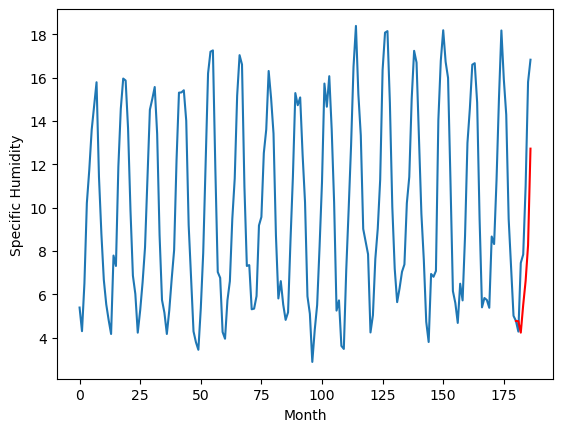

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.45		-0.45
5.61		3.92		-1.69
7.82		5.20		-2.62
8.04		6.31		-1.73
10.53		7.95		-2.58
15.28		12.42		-2.86
[180, 181, 182, 183, 184, 185, 186]
[7.05, 4.448057483136654, 3.922557185590267, 5.204974840581417, 6.31452412456274, 7.950190375745296, 12.415196727216244]


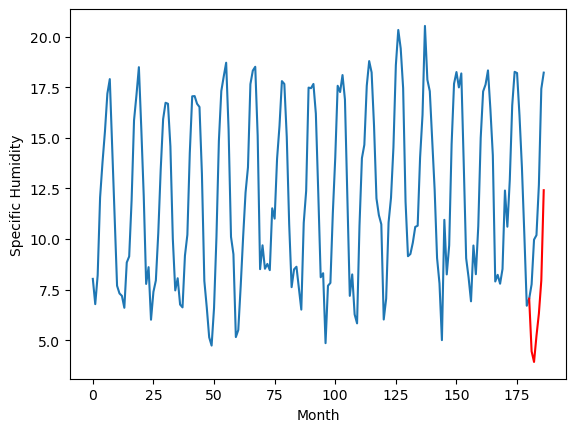

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		4.34		-0.48
4.97		3.81		-1.16
6.82		5.09		-1.73
7.06		6.20		-0.86
9.82		7.84		-1.98
14.44		12.31		-2.13
[180, 181, 182, 183, 184, 185, 186]
[5.06, 4.338057483136654, 3.8125571855902676, 5.0949748405814175, 6.204524124562741, 7.840190375745297, 12.305196727216245]


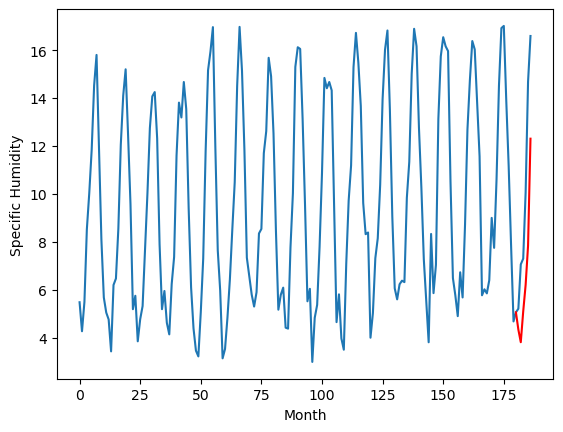

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		4.04		-0.17
4.12		3.51		-0.61
7.57		4.79		-2.78
8.14		5.90		-2.24
11.65		7.54		-4.11
15.55		12.01		-3.54
[180, 181, 182, 183, 184, 185, 186]
[7.05, 4.038057483136654, 3.512557185590267, 4.794974840581417, 5.90452412456274, 7.540190375745296, 12.005196727216244]


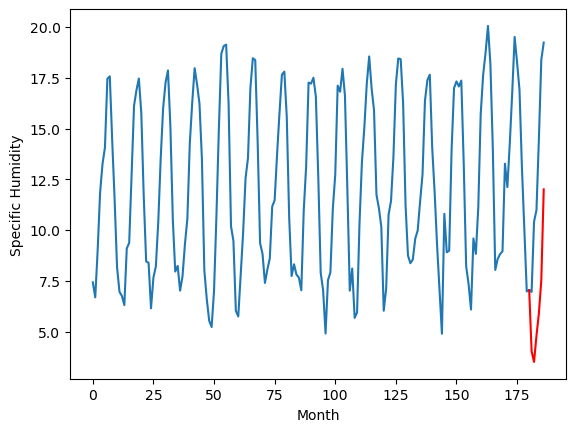

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		5.29		-0.03
4.92		4.76		-0.16
7.76		6.04		-1.72
9.16		7.15		-2.01
13.17		8.79		-4.38
16.86		13.26		-3.60
[180, 181, 182, 183, 184, 185, 186]
[5.2, 5.288057483136654, 4.762557185590267, 6.044974840581417, 7.15452412456274, 8.790190375745297, 13.255196727216244]


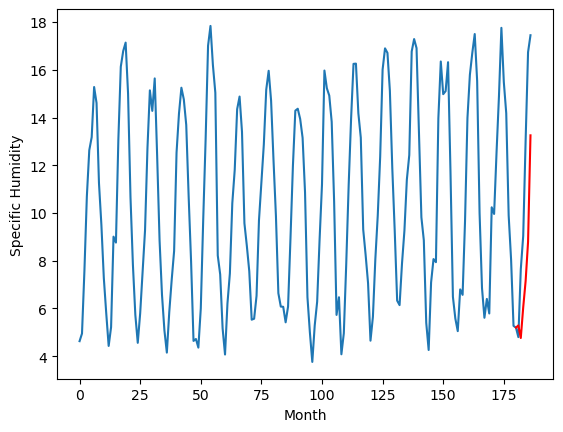

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		7.93		0.51
8.01		7.40		-0.61
9.58		8.68		-0.90
10.59		9.79		-0.80
13.09		11.43		-1.66
18.35		15.90		-2.45
[180, 181, 182, 183, 184, 185, 186]
[5.16, 7.928057483136653, 7.4025571855902665, 8.684974840581416, 9.79452412456274, 11.430190375745296, 15.895196727216243]


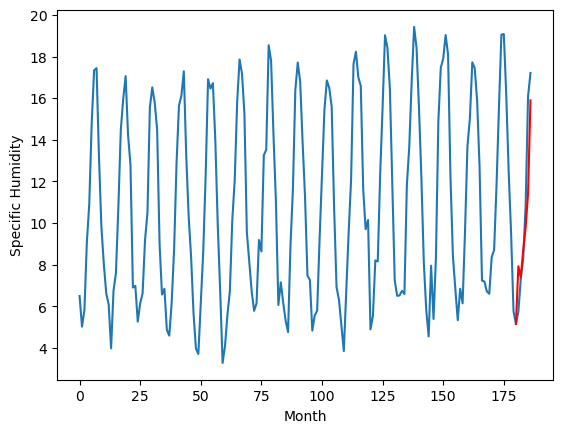

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		5.38		0.05
5.38		4.85		-0.53
6.97		6.13		-0.84
7.57		7.24		-0.33
10.57		8.88		-1.69
14.95		13.35		-1.60
[180, 181, 182, 183, 184, 185, 186]
[4.05, 5.378057483136654, 4.852557185590268, 6.1349748405814175, 7.244524124562741, 8.880190375745297, 13.345196727216244]


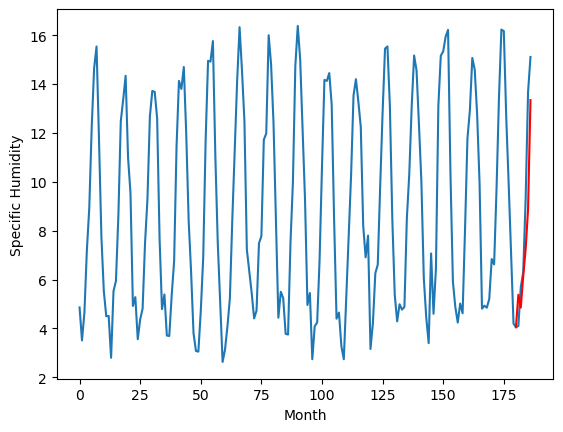

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		7.33		0.21
7.15		6.80		-0.35
8.77		8.08		-0.69
9.47		9.19		-0.28
12.49		10.83		-1.66
16.76		15.30		-1.46
[180, 181, 182, 183, 184, 185, 186]
[3.64, 7.328057483136654, 6.802557185590267, 8.084974840581417, 9.19452412456274, 10.830190375745296, 15.295196727216243]


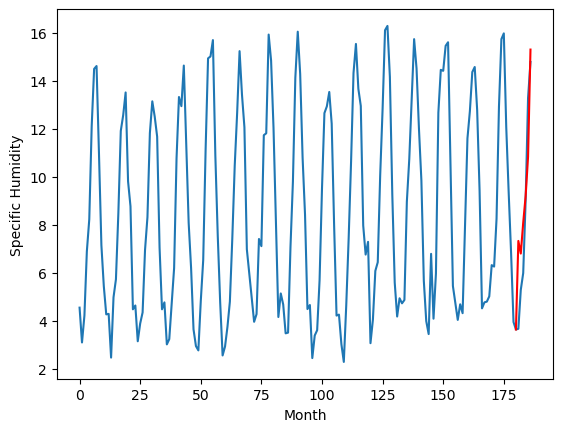

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		4.53		0.13
3.72		4.00		0.28
6.78		5.28		-1.50
7.51		6.39		-1.12
10.42		8.03		-2.39
15.40		12.50		-2.90
[180, 181, 182, 183, 184, 185, 186]
[3.46, 4.528057483136654, 4.002557185590267, 5.284974840581417, 6.39452412456274, 8.030190375745295, 12.495196727216243]


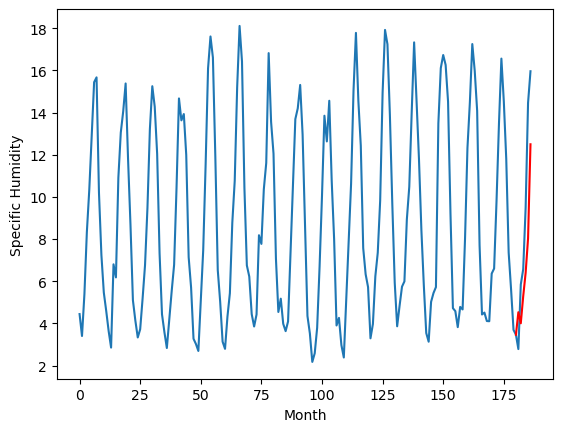

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		6.40		0.23
5.72		5.87		0.15
7.52		7.15		-0.37
8.84		8.26		-0.58
10.93		9.90		-1.03
15.70		14.37		-1.33
[180, 181, 182, 183, 184, 185, 186]
[2.93, 6.398057483136654, 5.872557185590267, 7.154974840581417, 8.26452412456274, 9.900190375745296, 14.365196727216244]


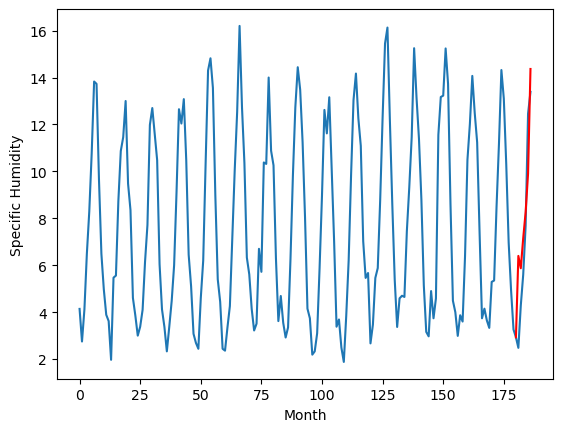

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.76		0.28
3.74		4.23		0.49
5.36		5.51		0.15
6.96		6.62		-0.34
8.48		8.26		-0.22
13.61		12.73		-0.88
[180, 181, 182, 183, 184, 185, 186]
[2.74, 4.758057483136654, 4.2325571855902675, 5.514974840581417, 6.624524124562741, 8.260190375745296, 12.725196727216243]


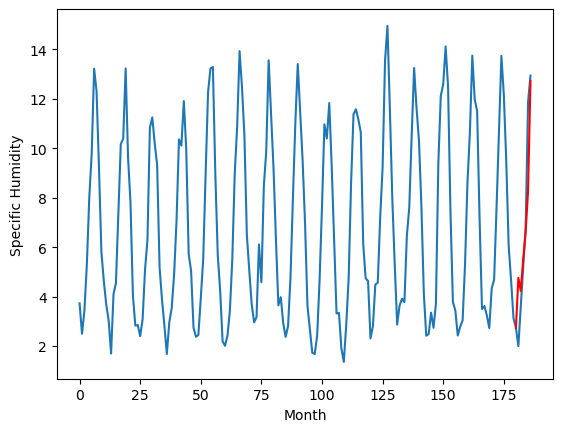

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[4.758057483136654, 4.448057483136654, 4.338057483136654, 4.038057483136654, 5.288057483136654, 7.928057483136653, 5.378057483136654, 7.328057483136654, 4.528057483136654, 6.398057483136654, 4.758057483136654]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   4.758057
1                 1    4.90   4.448057
2                 2    4.82   4.338057
3                 3    4.21   4.038057
4                 4    5.32   5.288057
5                 5    7.42   7.928057
6                 6    5.33   5.378057
7                 7    7.12   7.328057
8                 8    4.40   4.528057
9                 9    6.17   6.398057
10               10    4.48   4.758057


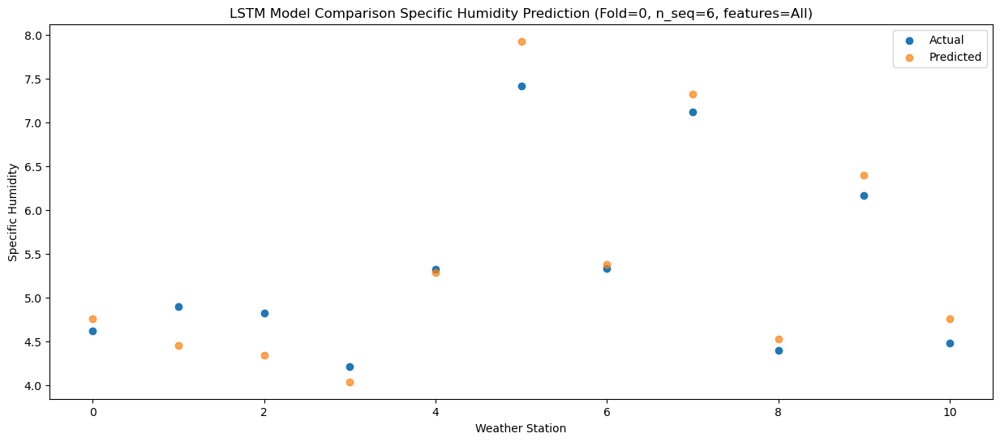

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   4.232557
1                 1    5.61   3.922557
2                 2    4.97   3.812557
3                 3    4.12   3.512557
4                 4    4.92   4.762557
5                 5    8.01   7.402557
6                 6    5.38   4.852557
7                 7    7.15   6.802557
8                 8    3.72   4.002557
9                 9    5.72   5.872557
10               10    3.74   4.232557


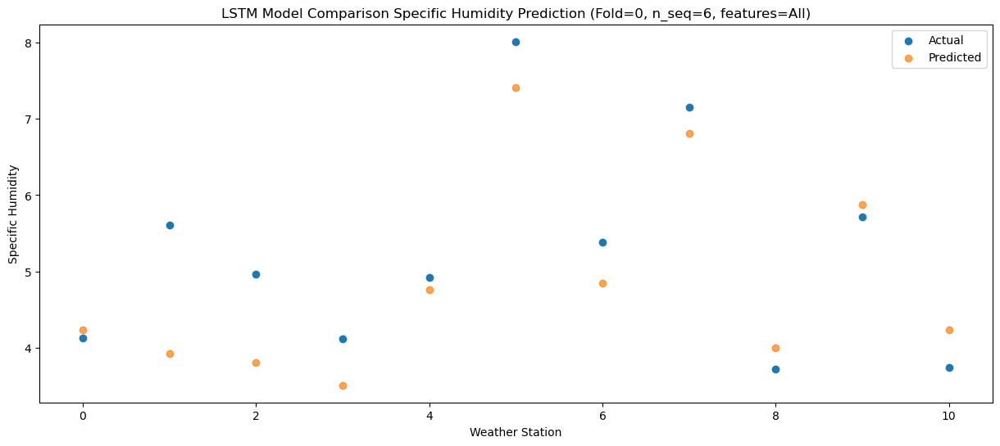

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   5.514975
1                 1    7.82   5.204975
2                 2    6.82   5.094975
3                 3    7.57   4.794975
4                 4    7.76   6.044975
5                 5    9.58   8.684975
6                 6    6.97   6.134975
7                 7    8.77   8.084975
8                 8    6.78   5.284975
9                 9    7.52   7.154975
10               10    5.36   5.514975


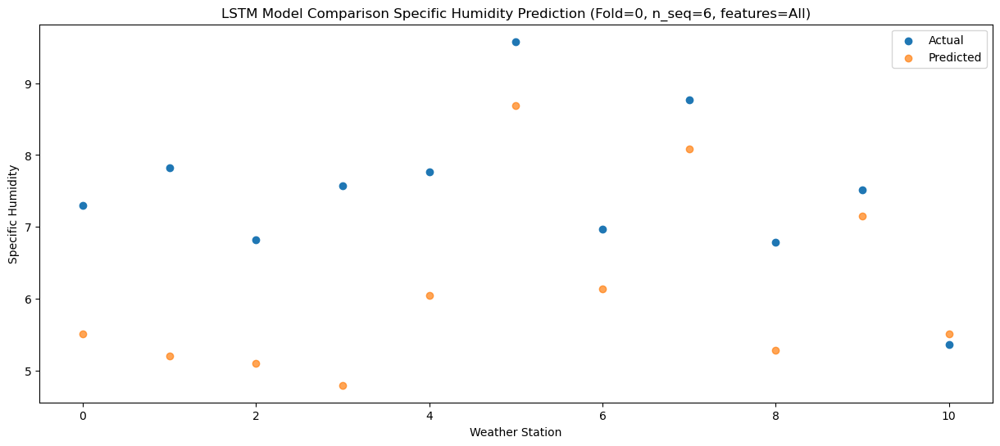

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.69   6.624524
1                 1    8.04   6.314524
2                 2    7.06   6.204524
3                 3    8.14   5.904524
4                 4    9.16   7.154524
5                 5   10.59   9.794524
6                 6    7.57   7.244524
7                 7    9.47   9.194524
8                 8    7.51   6.394524
9                 9    8.84   8.264524
10               10    6.96   6.624524


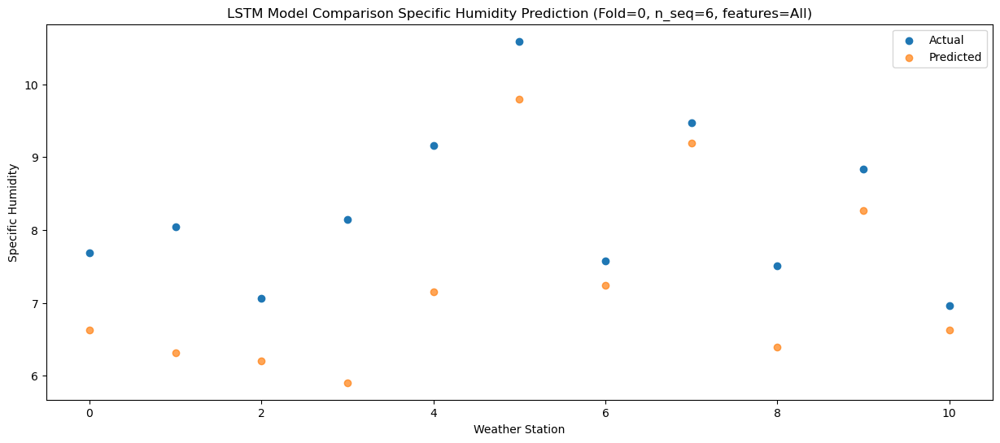

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.84    8.26019
1                 1   10.53    7.95019
2                 2    9.82    7.84019
3                 3   11.65    7.54019
4                 4   13.17    8.79019
5                 5   13.09   11.43019
6                 6   10.57    8.88019
7                 7   12.49   10.83019
8                 8   10.42    8.03019
9                 9   10.93    9.90019
10               10    8.48    8.26019


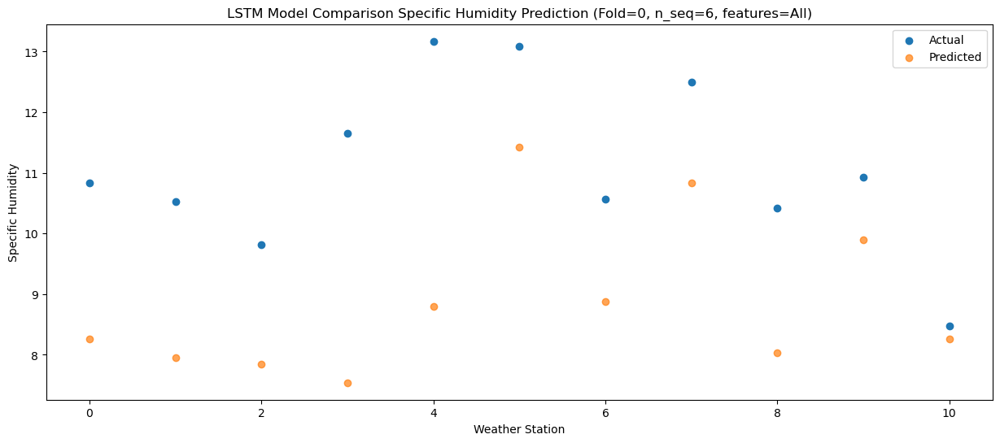

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.65  12.725197
1                 1   15.28  12.415197
2                 2   14.44  12.305197
3                 3   15.55  12.005197
4                 4   16.86  13.255197
5                 5   18.35  15.895197
6                 6   14.95  13.345197
7                 7   16.76  15.295197
8                 8   15.40  12.495197
9                 9   15.70  14.365197
10               10   13.61  12.725197


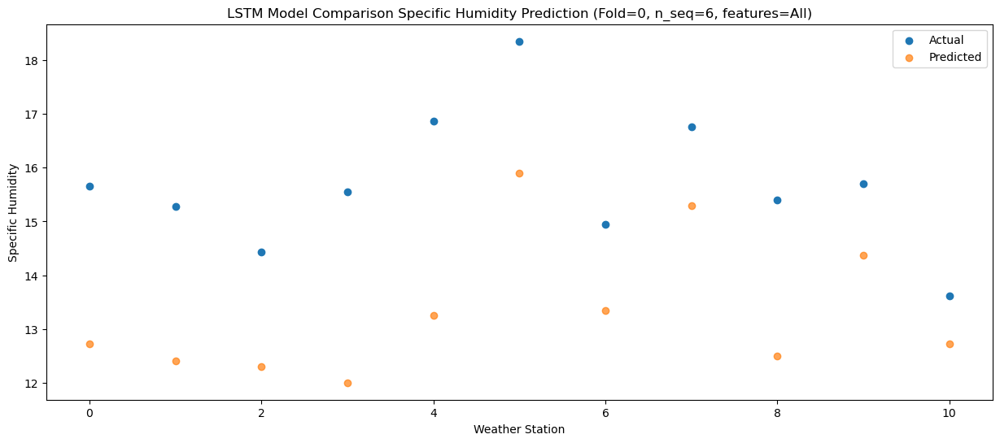

Model: "sequential_500"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1000 (LSTM)            (1, 1, 512)               5449728   
                                                                 
 dropout_1000 (Dropout)      (1, 1, 512)               0         
                                                                 
 lstm_1001 (LSTM)            (1, 512)                  2099200   
                                                                 
 dropout_1001 (Dropout)      (1, 512)                  0         
                                                                 
 dense_1500 (Dense)          (1, 256)                  131328    
                                                                 
 dense_1501 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1502 (Dense)          (1, 6)                 

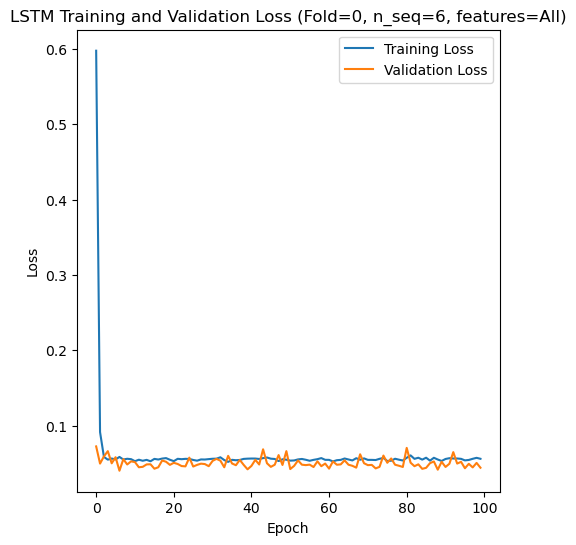

Epoch 1/100
84/84 [==============================] - 40s 278ms/step - loss: 0.5038 - val_loss: 0.0633
Epoch 2/100
84/84 [==============================] - 16s 195ms/step - loss: 0.0739 - val_loss: 0.0649
Epoch 3/100
84/84 [==============================] - 19s 221ms/step - loss: 0.0517 - val_loss: 0.0538
Epoch 4/100
84/84 [==============================] - 17s 206ms/step - loss: 0.0568 - val_loss: 0.0562
Epoch 5/100
84/84 [==============================] - 16s 190ms/step - loss: 0.0536 - val_loss: 0.0594
Epoch 6/100
84/84 [==============================] - 17s 208ms/step - loss: 0.0538 - val_loss: 0.0565
Epoch 7/100
84/84 [==============================] - 18s 217ms/step - loss: 0.0523 - val_loss: 0.0599
Epoch 8/100
84/84 [==============================] - 19s 224ms/step - loss: 0.0503 - val_loss: 0.0595
Epoch 9/100
84/84 [==============================] - 17s 208ms/step - loss: 0.0517 - val_loss: 0.0535
Epoch 10/100
84/84 [==============================] - 18s 212ms/step - loss: 0.051

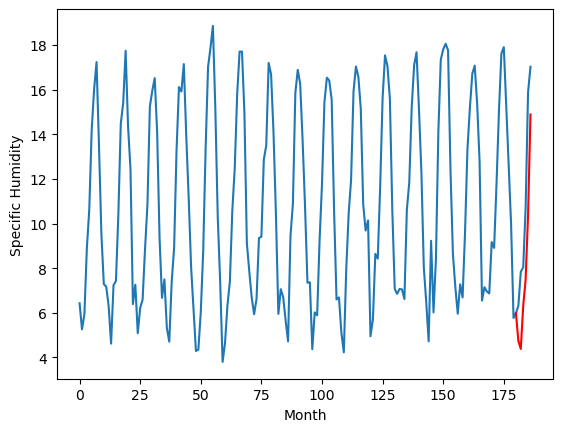

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.34		4.25		-0.09
4.53		3.89		-0.64
6.06		5.82		-0.24
6.42		7.01		0.59
9.34		9.88		0.54
13.32		14.40		1.08
[180, 181, 182, 183, 184, 185, 186]
[4.15, 4.250419728159905, 3.891290031075478, 5.8190247637033465, 7.007695041298867, 9.879506431221962, 14.402829490303994]


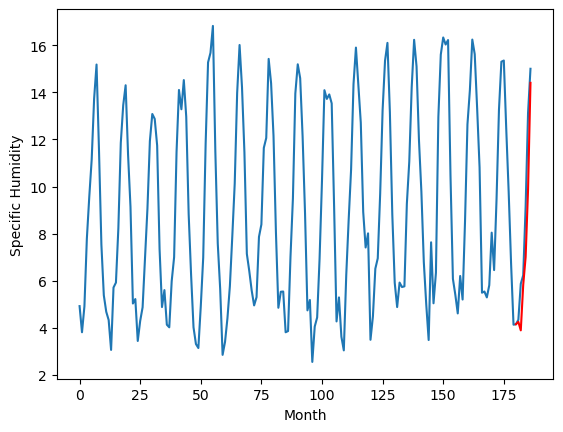

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.22		3.00		-0.22
3.22		2.64		-0.58
5.84		4.57		-1.27
5.55		5.76		0.21
8.39		8.63		0.24
12.91		13.15		0.24
[180, 181, 182, 183, 184, 185, 186]
[5.12, 3.0004197281599043, 2.6412900310754774, 4.5690247637033465, 5.757695041298867, 8.629506431221962, 13.152829490303994]


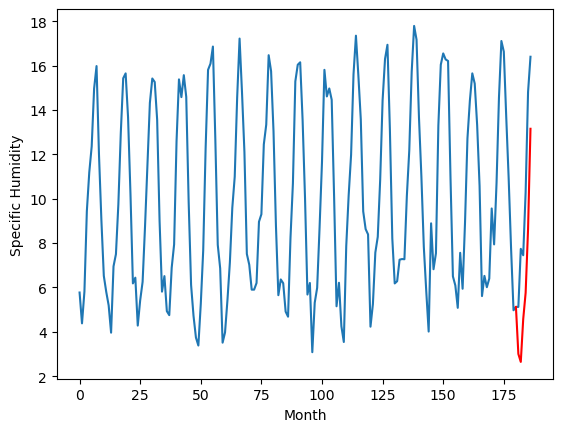

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.03		2.30		0.27
2.10		1.94		-0.16
4.74		3.87		-0.87
6.08		5.06		-1.02
9.97		7.93		-2.04
13.16		12.45		-0.71
[180, 181, 182, 183, 184, 185, 186]
[6.35, 2.3004197281599046, 1.9412900310754777, 3.8690247637033464, 5.057695041298866, 7.929506431221962, 12.452829490303994]


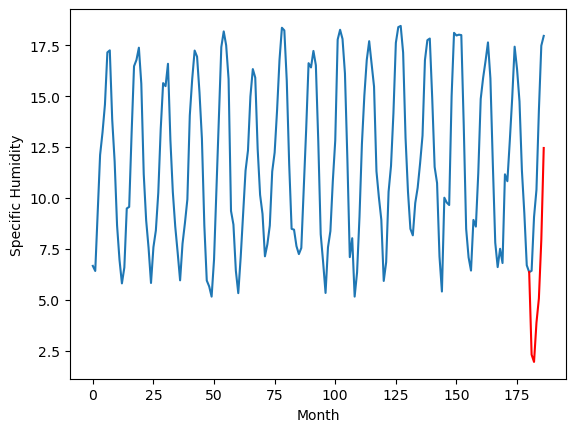

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.18		6.36		0.18
6.22		6.00		-0.22
8.94		7.93		-1.01
10.20		9.12		-1.08
14.23		11.99		-2.24
17.64		16.51		-1.13
[180, 181, 182, 183, 184, 185, 186]
[6.08, 6.360419728159904, 6.001290031075477, 7.929024763703346, 9.117695041298866, 11.989506431221962, 16.512829490303993]


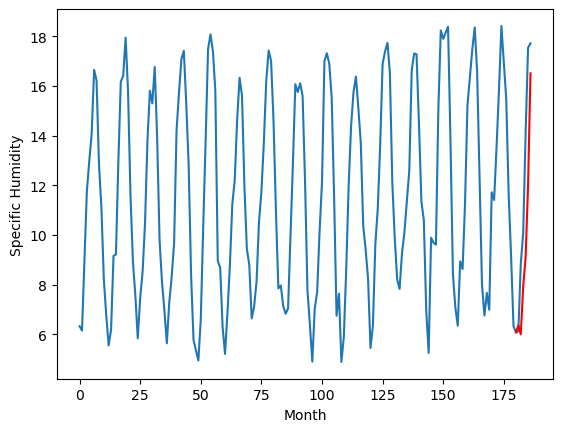

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.75		4.85		-0.90
5.12		4.49		-0.63
5.91		6.42		0.51
7.21		7.61		0.40
11.52		10.48		-1.04
13.69		15.00		1.31
[180, 181, 182, 183, 184, 185, 186]
[3.92, 4.850419728159904, 4.4912900310754775, 6.419024763703346, 7.607695041298866, 10.479506431221962, 15.002829490303993]


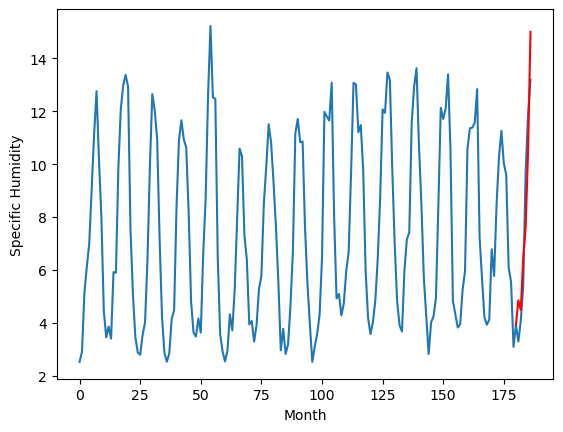

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.66		5.70		0.04
5.78		5.34		-0.44
7.34		7.27		-0.07
7.96		8.46		0.50
10.89		11.33		0.44
15.24		15.85		0.61
[180, 181, 182, 183, 184, 185, 186]
[4.16, 5.700419728159904, 5.341290031075477, 7.269024763703346, 8.457695041298866, 11.329506431221962, 15.852829490303993]


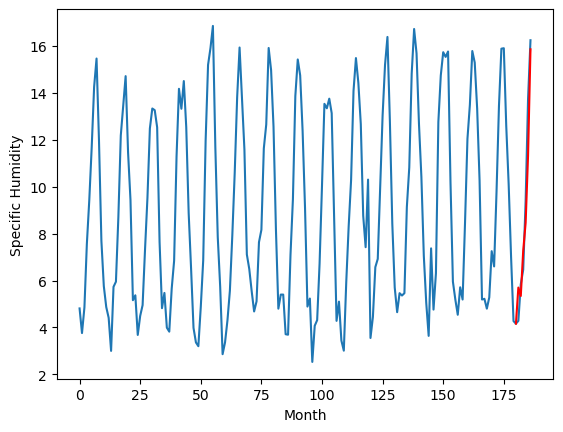

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.53		6.59		0.06
6.01		6.23		0.22
8.74		8.16		-0.58
9.97		9.35		-0.62
13.18		12.22		-0.96
17.94		16.74		-1.20
[180, 181, 182, 183, 184, 185, 186]
[3.84, 6.590419728159905, 6.231290031075478, 8.159024763703346, 9.347695041298866, 12.219506431221962, 16.742829490303993]


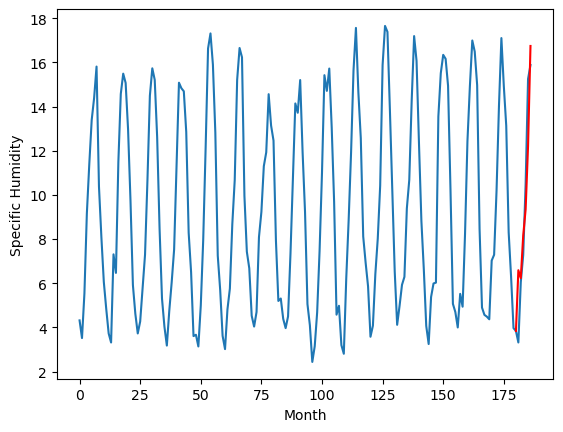

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.49		6.26		-0.23
5.68		5.90		0.22
8.29		7.83		-0.46
9.45		9.02		-0.43
13.67		11.89		-1.78
16.81		16.41		-0.40
[180, 181, 182, 183, 184, 185, 186]
[3.73, 6.2604197281599046, 5.901290031075478, 7.829024763703346, 9.017695041298866, 11.889506431221962, 16.41282949030399]


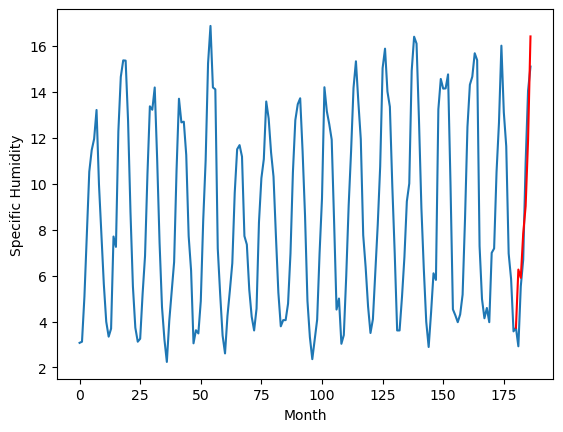

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.71		2.45		-0.26
1.97		2.09		0.12
3.79		4.02		0.23
3.96		5.21		1.25
9.11		8.08		-1.03
12.10		12.60		0.50
[180, 181, 182, 183, 184, 185, 186]
[2.83, 2.4504197281599045, 2.0912900310754776, 4.019024763703346, 5.207695041298866, 8.079506431221962, 12.602829490303993]


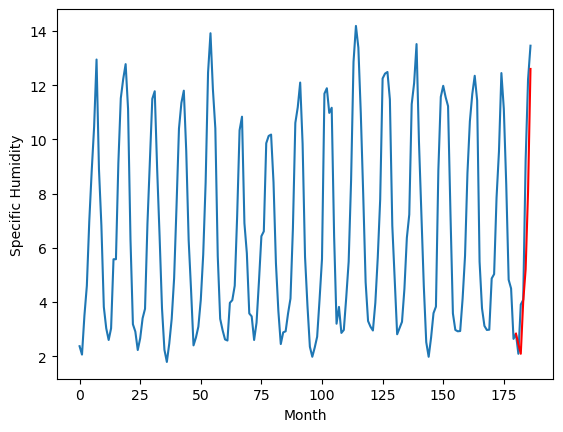

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.08		4.74		0.66
4.12		4.38		0.26
5.36		6.31		0.95
6.73		7.50		0.77
8.26		10.37		2.11
13.58		14.89		1.31
[180, 181, 182, 183, 184, 185, 186]
[2.69, 4.740419728159904, 4.381290031075477, 6.309024763703346, 7.497695041298866, 10.36950643122196, 14.892829490303992]


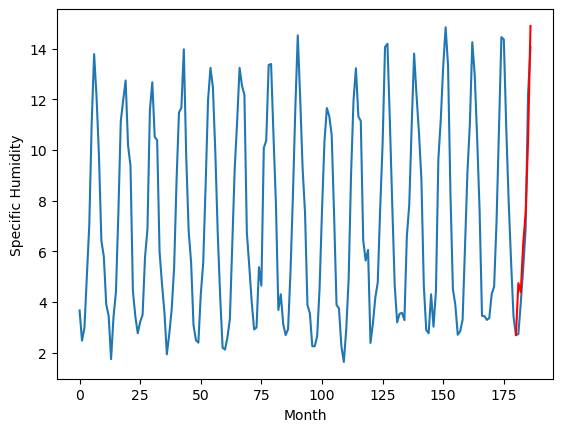

RangeIndex(start=1, stop=12, step=1)
[5.03, 4.340000000000002, 3.2199999999999998, 2.0299999999999994, 6.18, 5.75, 5.66, 6.529999999999999, 6.49, 2.7100000000000004, 4.079999999999999]
[4.740419728159904, 4.250419728159905, 3.0004197281599043, 2.3004197281599046, 6.360419728159904, 4.850419728159904, 5.700419728159904, 6.590419728159905, 6.2604197281599046, 2.4504197281599045, 4.740419728159904]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.03    4.74042
1                 1    4.34    4.25042
2                 2    3.22    3.00042
3                 3    2.03    2.30042
4                 4    6.18    6.36042
5                 5    5.75    4.85042
6                 6    5.66    5.70042
7                 7    6.53    6.59042
8                 8    6.49    6.26042
9                 9    2.71    2.45042
10               10    4.08    4.74042


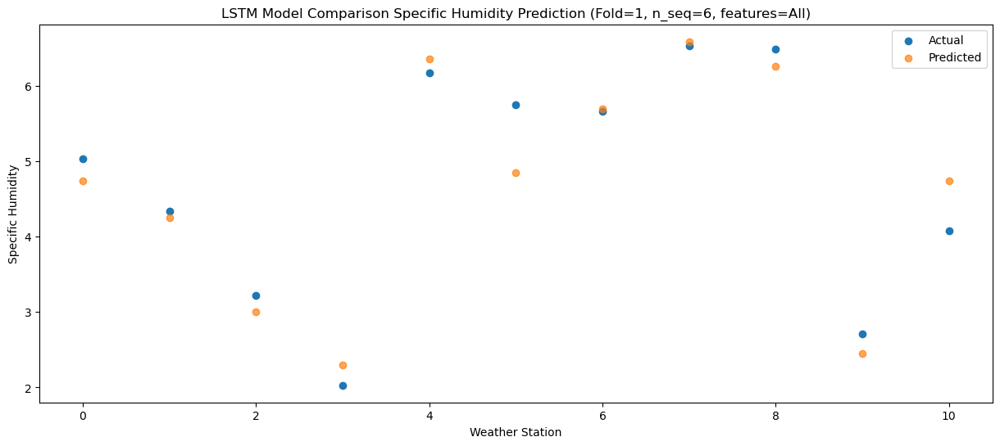

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    5.35    4.38129
1                 1    4.53    3.89129
2                 2    3.22    2.64129
3                 3    2.10    1.94129
4                 4    6.22    6.00129
5                 5    5.12    4.49129
6                 6    5.78    5.34129
7                 7    6.01    6.23129
8                 8    5.68    5.90129
9                 9    1.97    2.09129
10               10    4.12    4.38129


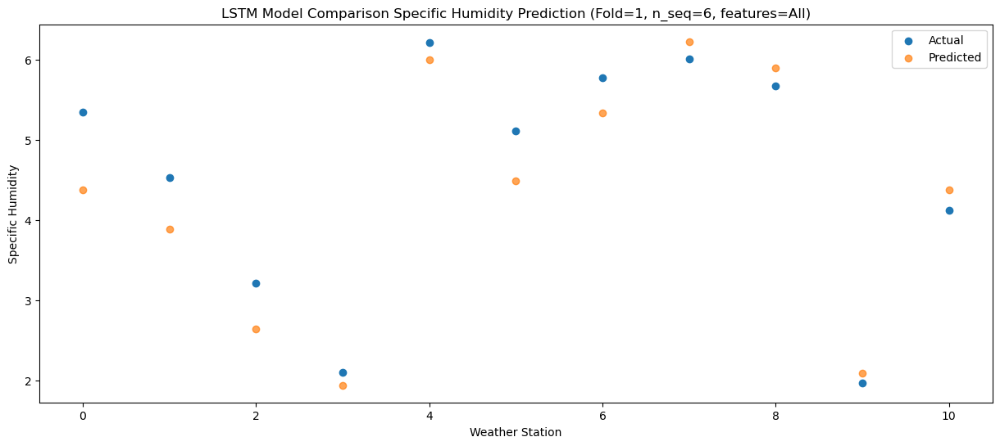

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.88   6.309025
1                 1    6.06   5.819025
2                 2    5.84   4.569025
3                 3    4.74   3.869025
4                 4    8.94   7.929025
5                 5    5.91   6.419025
6                 6    7.34   7.269025
7                 7    8.74   8.159025
8                 8    8.29   7.829025
9                 9    3.79   4.019025
10               10    5.36   6.309025


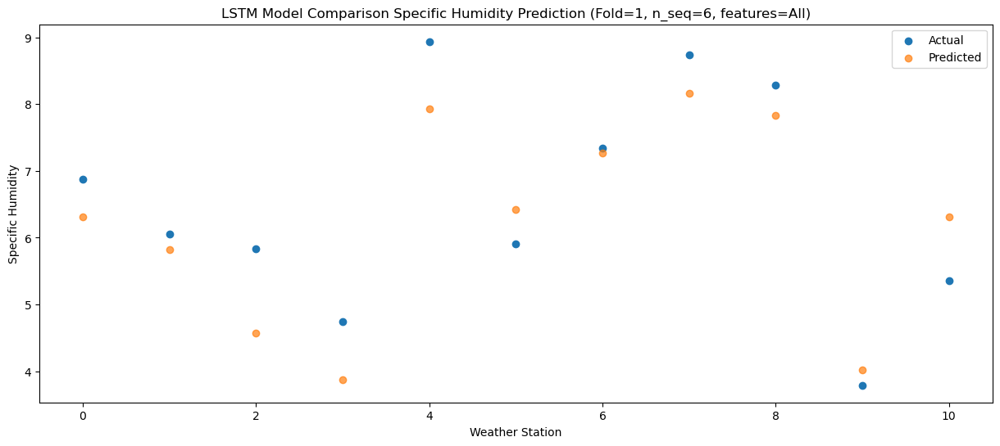

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.08   7.497695
1                 1    6.42   7.007695
2                 2    5.55   5.757695
3                 3    6.08   5.057695
4                 4   10.20   9.117695
5                 5    7.21   7.607695
6                 6    7.96   8.457695
7                 7    9.97   9.347695
8                 8    9.45   9.017695
9                 9    3.96   5.207695
10               10    6.73   7.497695


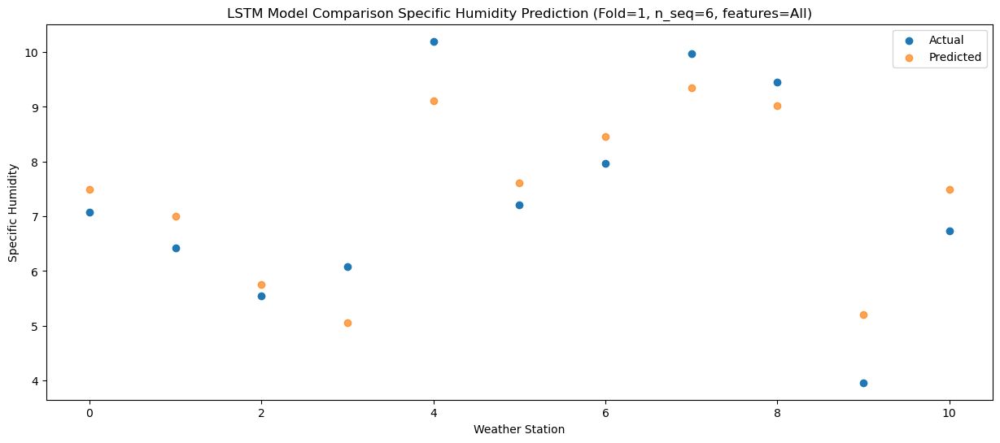

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    9.76  10.369506
1                 1    9.34   9.879506
2                 2    8.39   8.629506
3                 3    9.97   7.929506
4                 4   14.23  11.989506
5                 5   11.52  10.479506
6                 6   10.89  11.329506
7                 7   13.18  12.219506
8                 8   13.67  11.889506
9                 9    9.11   8.079506
10               10    8.26  10.369506


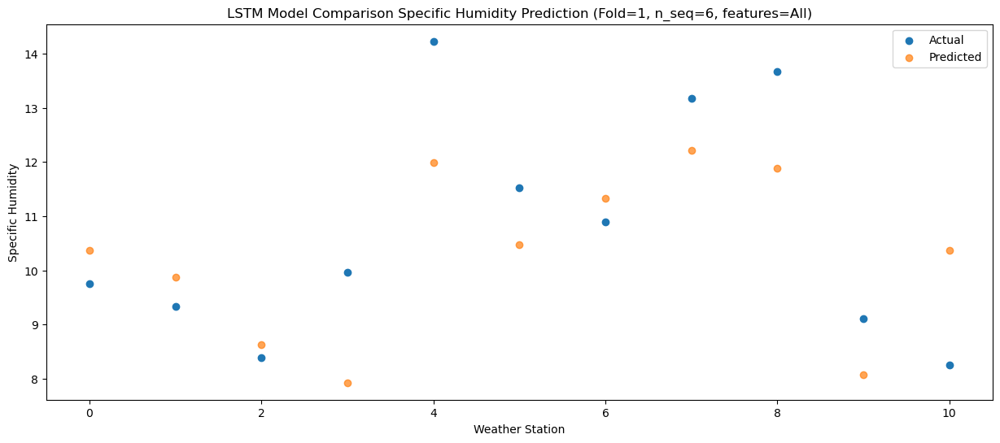

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.92  14.892829
1                 1   13.32  14.402829
2                 2   12.91  13.152829
3                 3   13.16  12.452829
4                 4   17.64  16.512829
5                 5   13.69  15.002829
6                 6   15.24  15.852829
7                 7   17.94  16.742829
8                 8   16.81  16.412829
9                 9   12.10  12.602829
10               10   13.58  14.892829


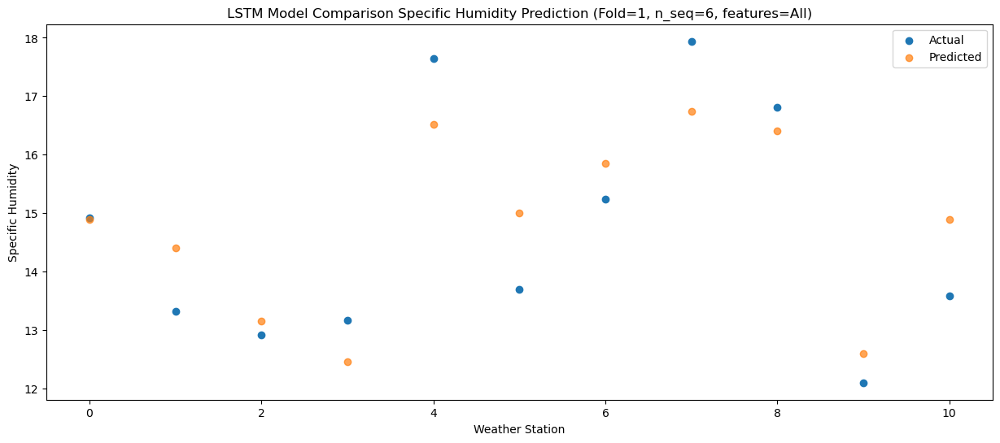

Model: "sequential_501"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1002 (LSTM)            (1, 1, 512)               5449728   
                                                                 
 dropout_1002 (Dropout)      (1, 1, 512)               0         
                                                                 
 lstm_1003 (LSTM)            (1, 512)                  2099200   
                                                                 
 dropout_1003 (Dropout)      (1, 512)                  0         
                                                                 
 dense_1503 (Dense)          (1, 256)                  131328    
                                                                 
 dense_1504 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1505 (Dense)          (1, 6)                 

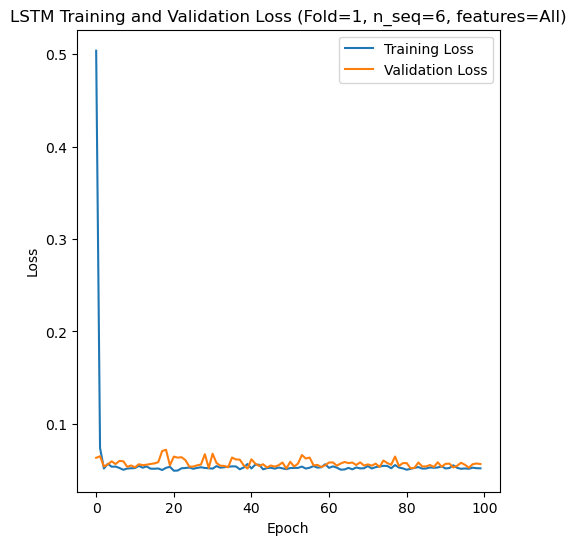

Epoch 1/100
84/84 [==============================] - 34s 234ms/step - loss: 0.6731 - val_loss: 0.0485
Epoch 2/100
84/84 [==============================] - 18s 214ms/step - loss: 0.0849 - val_loss: 0.0520
Epoch 3/100
84/84 [==============================] - 20s 242ms/step - loss: 0.0630 - val_loss: 0.0401
Epoch 4/100
84/84 [==============================] - 20s 237ms/step - loss: 0.0550 - val_loss: 0.0322
Epoch 5/100
84/84 [==============================] - 26s 307ms/step - loss: 0.0542 - val_loss: 0.0316
Epoch 6/100
84/84 [==============================] - 20s 243ms/step - loss: 0.0531 - val_loss: 0.0356
Epoch 7/100
84/84 [==============================] - 20s 240ms/step - loss: 0.0507 - val_loss: 0.0548
Epoch 8/100
84/84 [==============================] - 21s 255ms/step - loss: 0.0520 - val_loss: 0.0644
Epoch 9/100
84/84 [==============================] - 15s 177ms/step - loss: 0.0560 - val_loss: 0.0521
Epoch 10/100
84/84 [==============================] - 14s 171ms/step - loss: 0.052

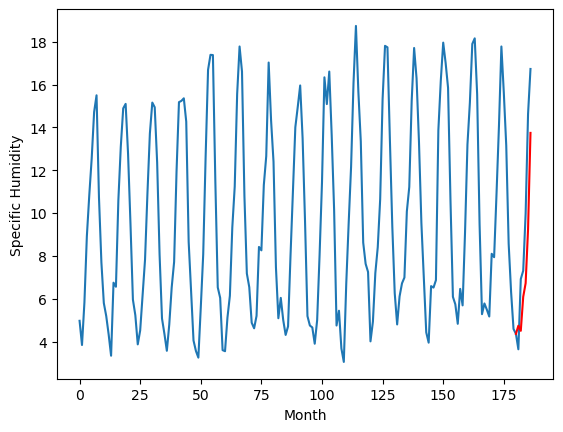

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		2.01		0.17
1.16		1.77		0.61
3.01		3.36		0.35
3.13		4.00		0.87
8.25		6.52		-1.73
11.16		11.01		-0.15
[180, 181, 182, 183, 184, 185, 186]
[2.82, 2.0104621046781537, 1.7719615989923474, 3.3593888574838635, 3.9960776263475415, 6.519570201039314, 11.014963477253914]


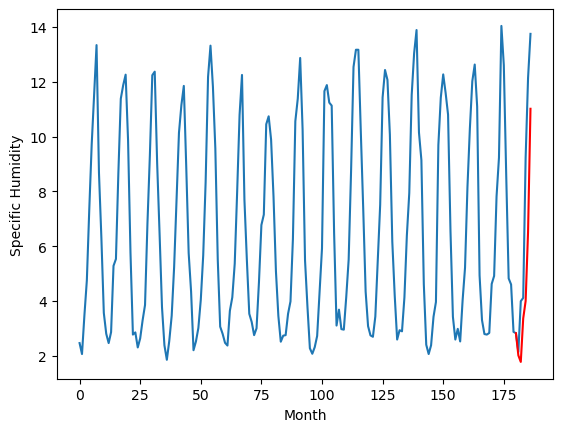

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		5.16		-0.37
7.66		4.92		-2.74
7.88		6.51		-1.37
8.85		7.15		-1.70
10.16		9.67		-0.49
13.94		14.16		0.22
[180, 181, 182, 183, 184, 185, 186]
[9.16, 5.160462104678154, 4.921961598992348, 6.509388857483864, 7.146077626347542, 9.669570201039313, 14.164963477253913]


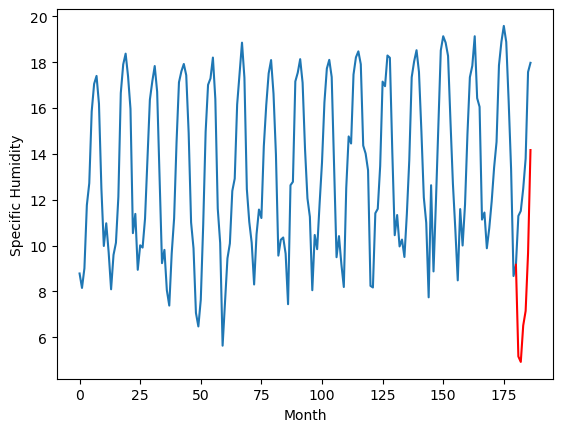

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		5.18		1.20
4.15		4.94		0.79
4.79		6.53		1.74
6.14		7.17		1.03
7.82		9.69		1.87
12.42		14.18		1.76
[180, 181, 182, 183, 184, 185, 186]
[2.44, 5.180462104678154, 4.941961598992347, 6.529388857483863, 7.166077626347541, 9.689570201039313, 14.184963477253913]


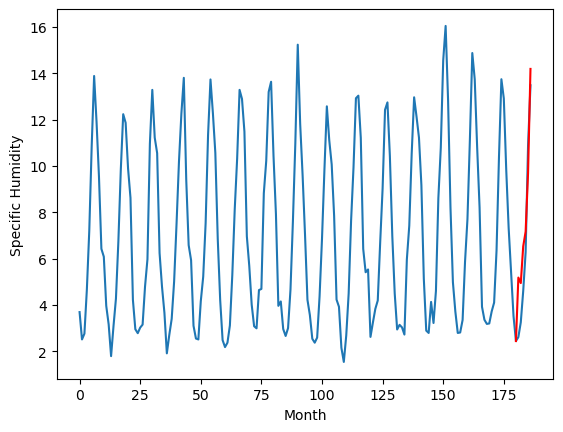

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		5.09		-0.01
5.08		4.85		-0.23
8.37		6.44		-1.93
8.39		7.08		-1.31
11.59		9.60		-1.99
15.48		14.09		-1.39
[180, 181, 182, 183, 184, 185, 186]
[6.65, 5.090462104678154, 4.8519615989923475, 6.439388857483864, 7.076077626347542, 9.599570201039313, 14.094963477253913]


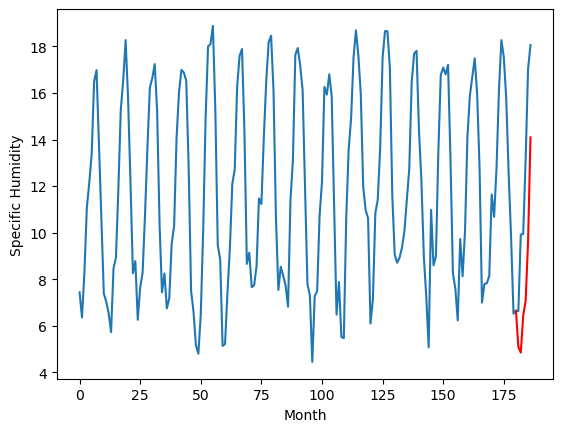

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		2.58		0.25
2.28		2.34		0.06
5.27		3.93		-1.34
6.84		4.57		-2.27
11.67		7.09		-4.58
14.31		11.58		-2.73
[180, 181, 182, 183, 184, 185, 186]
[6.19, 2.580462104678154, 2.3419615989923477, 3.929388857483864, 4.566077626347542, 7.089570201039314, 11.584963477253915]


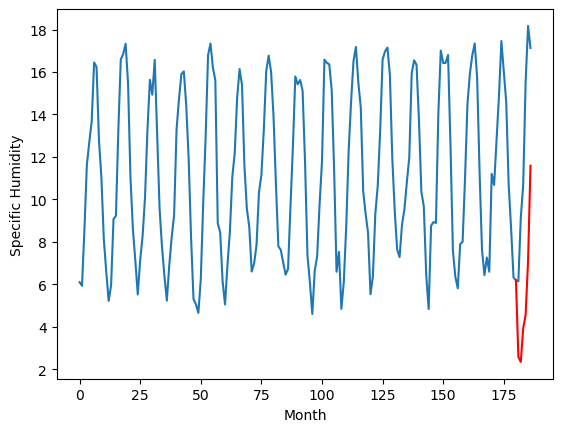

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.90		0.22
8.35		8.66		0.31
11.21		10.25		-0.96
12.53		10.89		-1.64
16.73		13.41		-3.32
20.48		17.90		-2.58
[180, 181, 182, 183, 184, 185, 186]
[4.78, 8.900462104678153, 8.661961598992347, 10.249388857483863, 10.886077626347541, 13.409570201039314, 17.904963477253915]


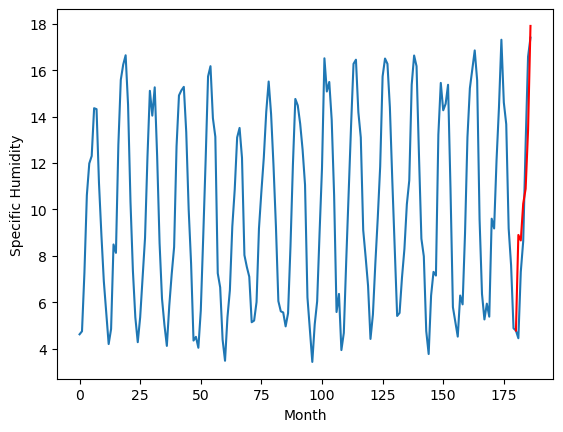

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.81		-0.16
3.84		3.57		-0.27
3.93		5.16		1.23
4.23		5.80		1.57
4.35		8.32		3.97
7.01		12.81		5.80
[180, 181, 182, 183, 184, 185, 186]
[2.61, 3.810462104678154, 3.5719615989923477, 5.159388857483863, 5.796077626347541, 8.319570201039314, 12.814963477253913]


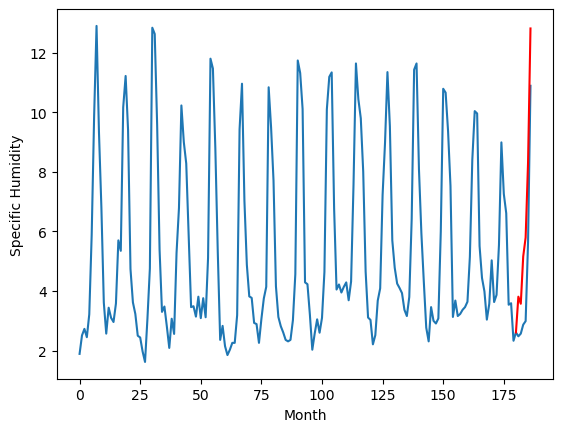

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		7.56		-0.73
8.82		7.32		-1.50
8.93		8.91		-0.02
10.25		9.55		-0.70
11.73		12.07		0.34
12.98		16.56		3.58
[180, 181, 182, 183, 184, 185, 186]
[4.6, 7.560462104678154, 7.321961598992348, 8.909388857483865, 9.546077626347543, 12.069570201039316, 16.564963477253915]


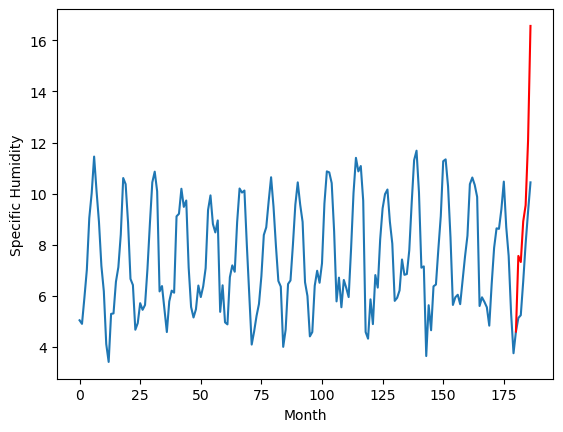

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		6.22		0.24
6.05		5.98		-0.07
7.78		7.57		-0.21
8.31		8.21		-0.10
11.02		10.73		-0.29
15.52		15.22		-0.30
[180, 181, 182, 183, 184, 185, 186]
[4.27, 6.220462104678154, 5.981961598992347, 7.5693888574838635, 8.206077626347541, 10.729570201039314, 15.224963477253914]


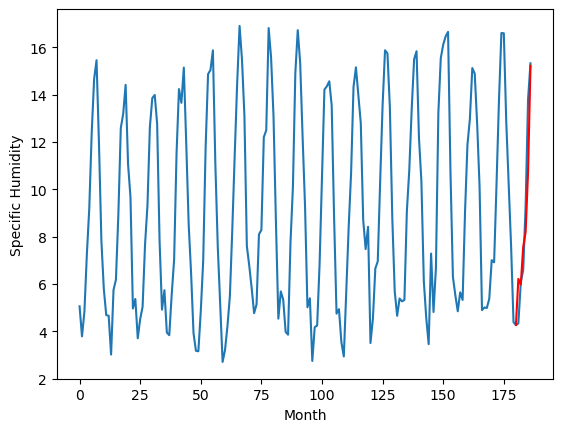

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		4.74		0.11
4.87		4.50		-0.37
5.90		6.09		0.19
6.51		6.73		0.22
9.18		9.25		0.07
13.28		13.74		0.46
[180, 181, 182, 183, 184, 185, 186]
[3.91, 4.740462104678154, 4.501961598992348, 6.089388857483864, 6.726077626347542, 9.249570201039315, 13.744963477253915]


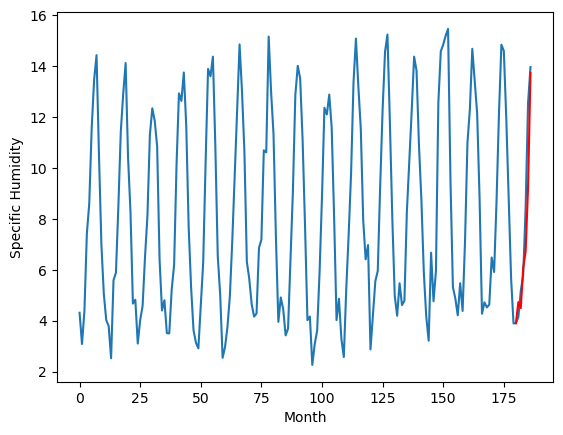

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[4.740462104678154, 2.0104621046781537, 5.160462104678154, 5.180462104678154, 5.090462104678154, 2.580462104678154, 8.900462104678153, 3.810462104678154, 7.560462104678154, 6.220462104678154, 4.740462104678154]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   4.740462
1                 1    1.84   2.010462
2                 2    5.53   5.160462
3                 3    3.98   5.180462
4                 4    5.10   5.090462
5                 5    2.33   2.580462
6                 6    8.68   8.900462
7                 7    3.97   3.810462
8                 8    8.29   7.560462
9                 9    5.98   6.220462
10               10    4.63   4.740462


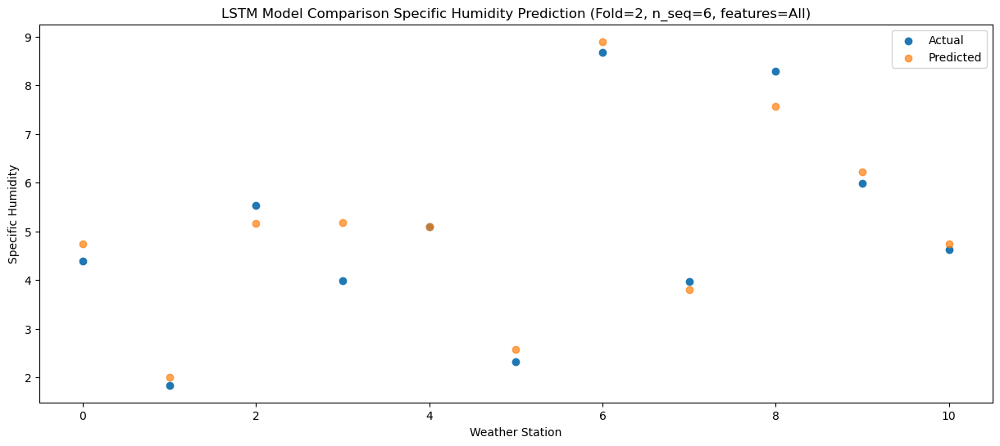

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   4.501962
1                 1    1.16   1.771962
2                 2    7.66   4.921962
3                 3    4.15   4.941962
4                 4    5.08   4.851962
5                 5    2.28   2.341962
6                 6    8.35   8.661962
7                 7    3.84   3.571962
8                 8    8.82   7.321962
9                 9    6.05   5.981962
10               10    4.87   4.501962


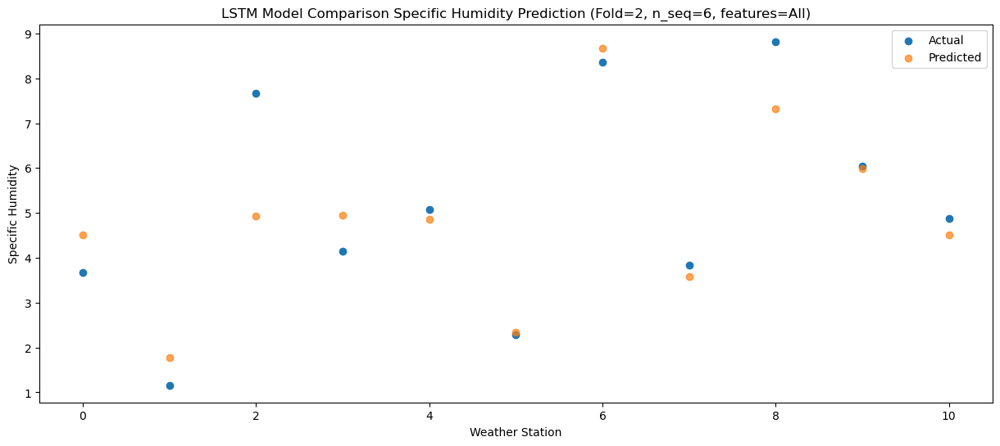

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95   6.089389
1                 1    3.01   3.359389
2                 2    7.88   6.509389
3                 3    4.79   6.529389
4                 4    8.37   6.439389
5                 5    5.27   3.929389
6                 6   11.21  10.249389
7                 7    3.93   5.159389
8                 8    8.93   8.909389
9                 9    7.78   7.569389
10               10    5.90   6.089389


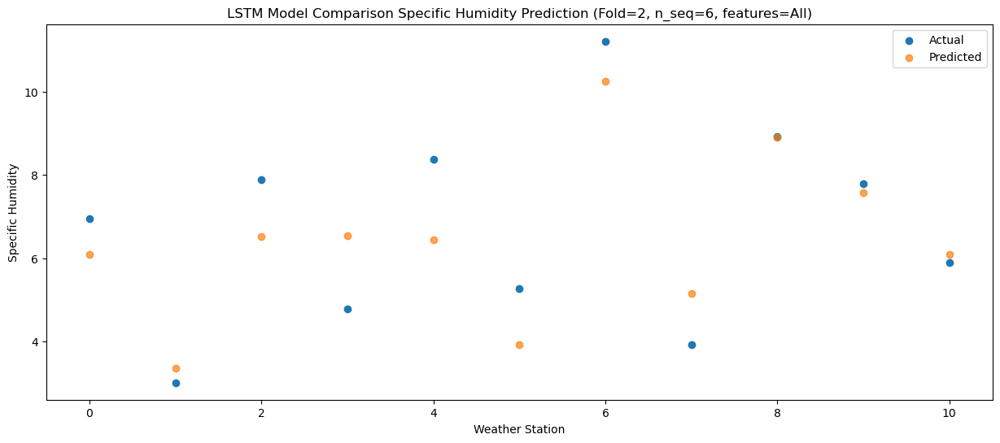

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.34   6.726078
1                 1    3.13   3.996078
2                 2    8.85   7.146078
3                 3    6.14   7.166078
4                 4    8.39   7.076078
5                 5    6.84   4.566078
6                 6   12.53  10.886078
7                 7    4.23   5.796078
8                 8   10.25   9.546078
9                 9    8.31   8.206078
10               10    6.51   6.726078


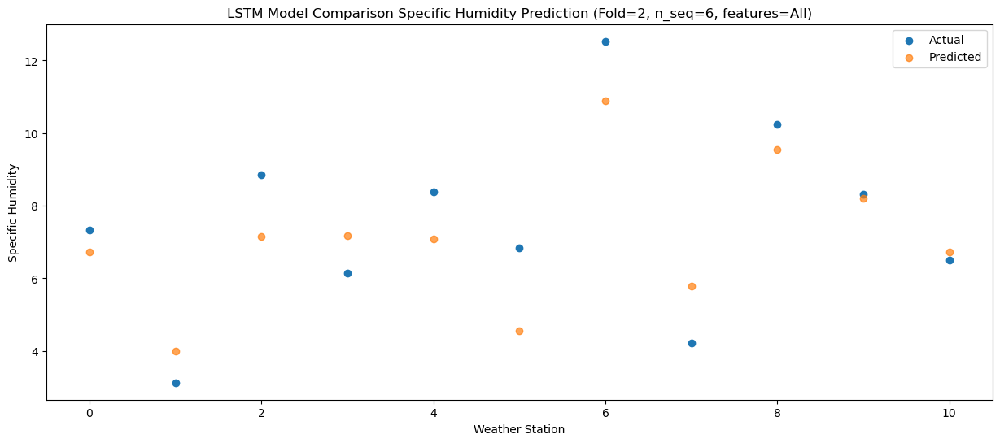

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.01    9.24957
1                 1    8.25    6.51957
2                 2   10.16    9.66957
3                 3    7.82    9.68957
4                 4   11.59    9.59957
5                 5   11.67    7.08957
6                 6   16.73   13.40957
7                 7    4.35    8.31957
8                 8   11.73   12.06957
9                 9   11.02   10.72957
10               10    9.18    9.24957


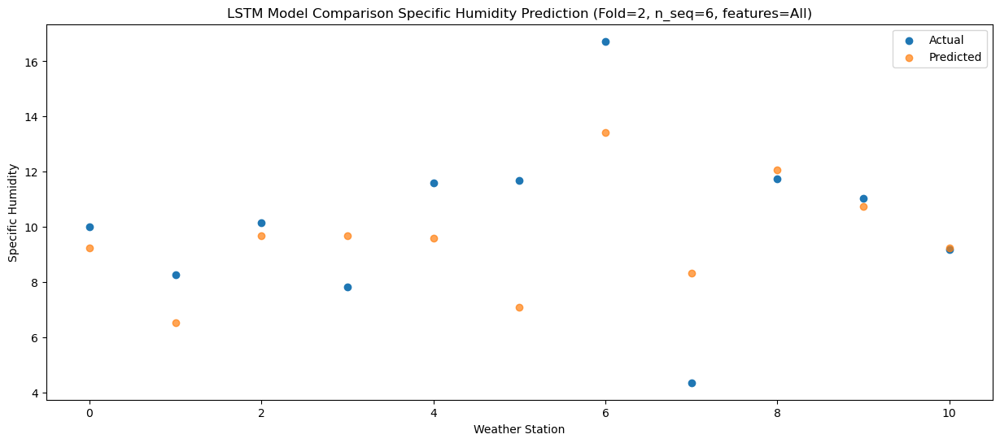

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.66  13.744963
1                 1   11.16  11.014963
2                 2   13.94  14.164963
3                 3   12.42  14.184963
4                 4   15.48  14.094963
5                 5   14.31  11.584963
6                 6   20.48  17.904963
7                 7    7.01  12.814963
8                 8   12.98  16.564963
9                 9   15.52  15.224963
10               10   13.28  13.744963


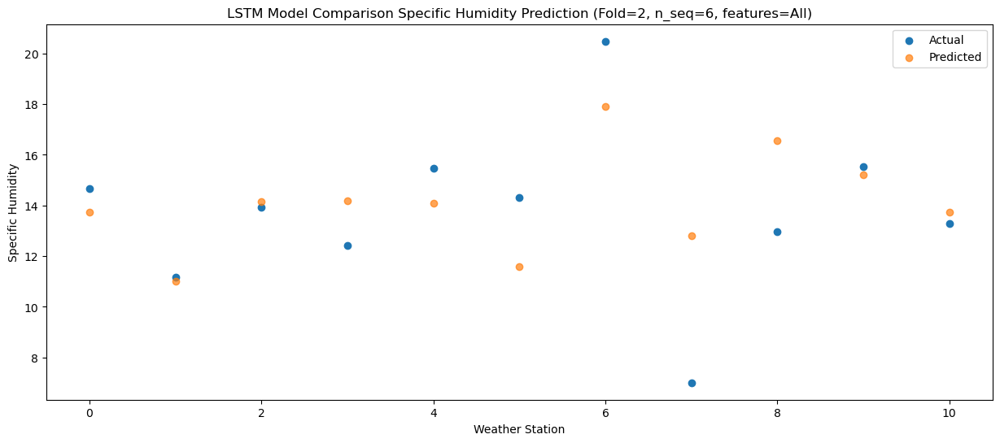

Model: "sequential_502"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1004 (LSTM)            (1, 1, 512)               5449728   
                                                                 
 dropout_1004 (Dropout)      (1, 1, 512)               0         
                                                                 
 lstm_1005 (LSTM)            (1, 512)                  2099200   
                                                                 
 dropout_1005 (Dropout)      (1, 512)                  0         
                                                                 
 dense_1506 (Dense)          (1, 256)                  131328    
                                                                 
 dense_1507 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1508 (Dense)          (1, 6)                 

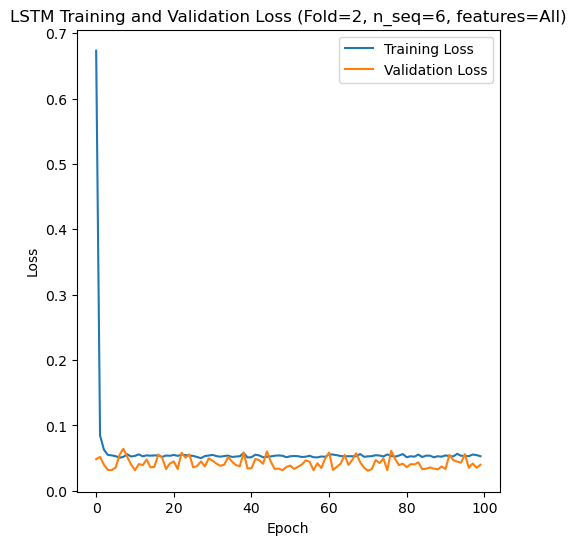

Epoch 1/100
84/84 [==============================] - 39s 260ms/step - loss: 0.5523 - val_loss: 0.0614
Epoch 2/100
84/84 [==============================] - 16s 189ms/step - loss: 0.0621 - val_loss: 0.0585
Epoch 3/100
84/84 [==============================] - 16s 197ms/step - loss: 0.0556 - val_loss: 0.0568
Epoch 4/100
84/84 [==============================] - 17s 208ms/step - loss: 0.0540 - val_loss: 0.0618
Epoch 5/100
84/84 [==============================] - 14s 171ms/step - loss: 0.0516 - val_loss: 0.0656
Epoch 6/100
84/84 [==============================] - 19s 232ms/step - loss: 0.0558 - val_loss: 0.0616
Epoch 7/100
84/84 [==============================] - 21s 256ms/step - loss: 0.0511 - val_loss: 0.0520
Epoch 8/100
84/84 [==============================] - 21s 248ms/step - loss: 0.0554 - val_loss: 0.0508
Epoch 9/100
84/84 [==============================] - 23s 280ms/step - loss: 0.0516 - val_loss: 0.0575
Epoch 10/100
84/84 [==============================] - 23s 275ms/step - loss: 0.051

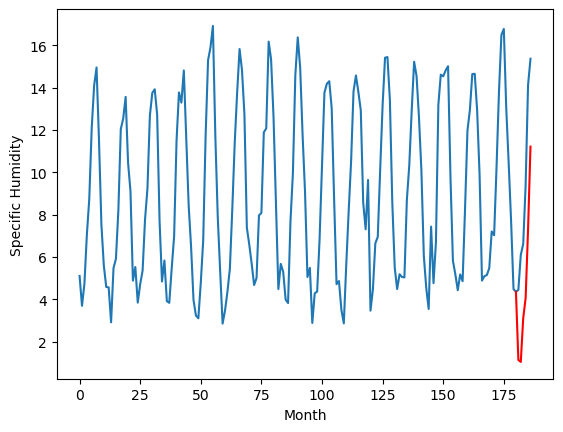

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.19		-0.45
2.08		2.09		0.01
4.59		4.15		-0.44
5.76		5.11		-0.65
9.28		8.35		-0.93
13.81		12.25		-1.56
[180, 181, 182, 183, 184, 185, 186]
[3.43, 2.185000102519989, 2.091514076590538, 4.151048149466515, 5.10848798930645, 8.34654631793499, 12.253721143603325]


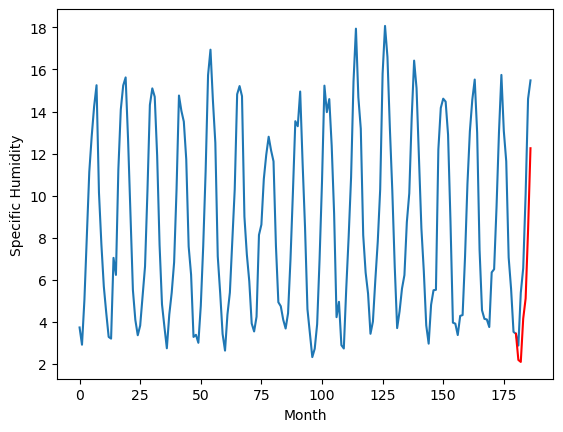

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		5.39		-0.98
6.31		5.29		-1.02
6.39		7.35		0.96
7.01		8.31		1.30
7.41		11.55		4.14
9.86		15.45		5.59
[180, 181, 182, 183, 184, 185, 186]
[5.43, 5.385000102519989, 5.291514076590538, 7.351048149466514, 8.30848798930645, 11.54654631793499, 15.453721143603325]


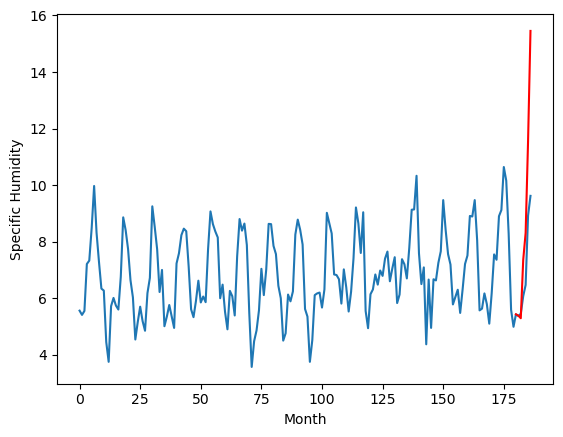

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.17		-0.27
3.37		3.07		-0.30
4.67		5.13		0.46
5.86		6.09		0.23
8.39		9.33		0.94
13.81		13.23		-0.58
[180, 181, 182, 183, 184, 185, 186]
[3.21, 3.165000102519989, 3.071514076590538, 5.1310481494665146, 6.08848798930645, 9.32654631793499, 13.233721143603326]


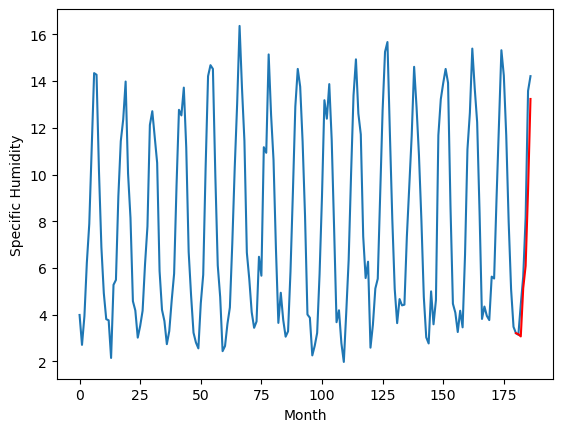

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		4.57		-0.34
4.08		4.47		0.39
6.56		6.53		-0.03
7.62		7.49		-0.13
10.04		10.73		0.69
14.50		14.63		0.13
[180, 181, 182, 183, 184, 185, 186]
[3.04, 4.565000102519989, 4.471514076590538, 6.531048149466515, 7.48848798930645, 10.72654631793499, 14.633721143603324]


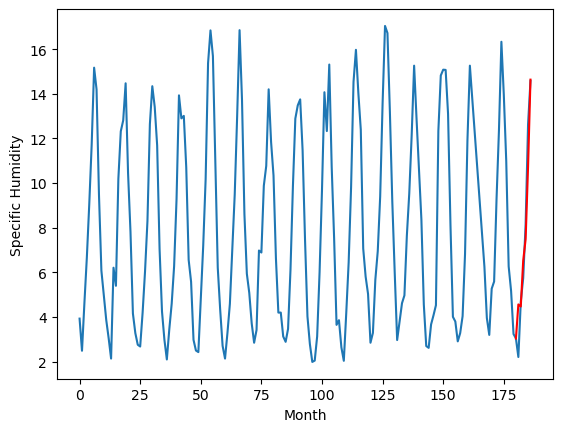

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.19		-0.23
2.90		3.09		0.19
4.93		5.15		0.22
6.23		6.11		-0.12
8.47		9.35		0.88
13.69		13.25		-0.44
[180, 181, 182, 183, 184, 185, 186]
[2.91, 3.185000102519989, 3.091514076590538, 5.151048149466515, 6.10848798930645, 9.34654631793499, 13.253721143603325]


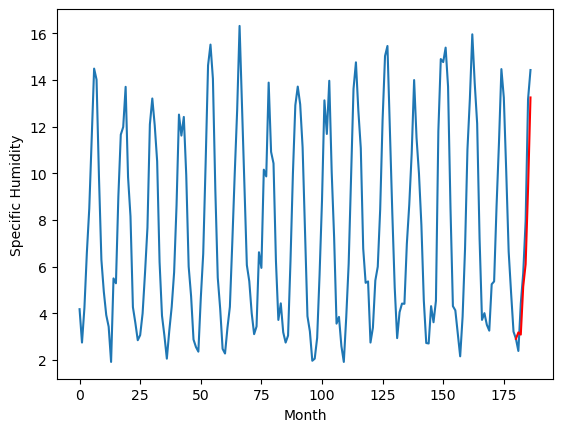

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.02		-0.71
5.79		4.92		-0.87
6.10		6.98		0.88
6.57		7.94		1.37
7.97		11.18		3.21
9.30		15.08		5.78
[180, 181, 182, 183, 184, 185, 186]
[1.6, 5.015000102519989, 4.921514076590538, 6.981048149466514, 7.9384879893064495, 11.176546317934989, 15.083721143603324]


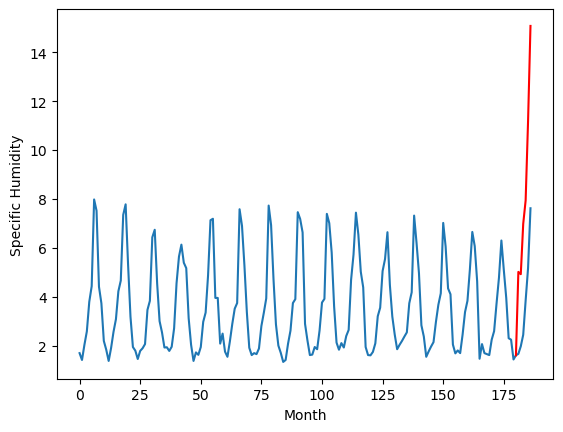

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		3.45		-1.35
4.32		3.35		-0.97
4.62		5.41		0.79
4.31		6.37		2.06
4.87		9.61		4.74
6.29		13.51		7.22
[180, 181, 182, 183, 184, 185, 186]
[2.86, 3.4450001025199892, 3.3515140765905382, 5.411048149466515, 6.36848798930645, 9.60654631793499, 13.513721143603325]


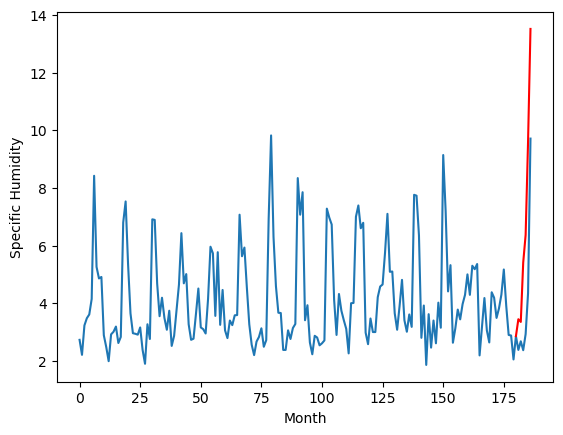

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		3.39		-1.21
4.25		3.29		-0.96
3.90		5.35		1.45
4.83		6.31		1.48
5.27		9.55		4.28
6.70		13.45		6.75
[180, 181, 182, 183, 184, 185, 186]
[5.65, 3.385000102519989, 3.291514076590538, 5.351048149466514, 6.30848798930645, 9.54654631793499, 13.453721143603325]


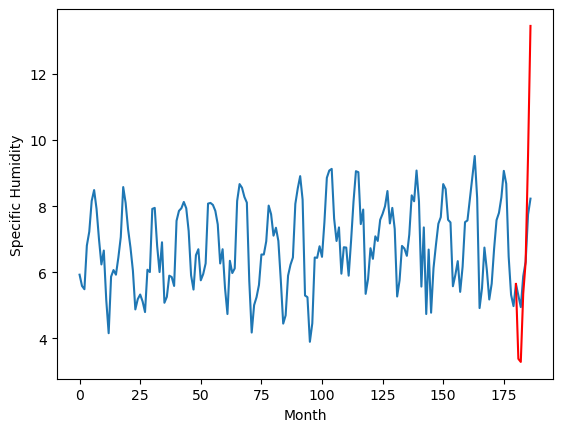

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		3.64		0.55
3.24		3.54		0.30
4.02		5.60		1.58
5.40		6.56		1.16
6.97		9.80		2.83
11.87		13.70		1.83
[180, 181, 182, 183, 184, 185, 186]
[2.54, 3.6350001025199887, 3.5415140765905377, 5.601048149466514, 6.55848798930645, 9.79654631793499, 13.703721143603325]


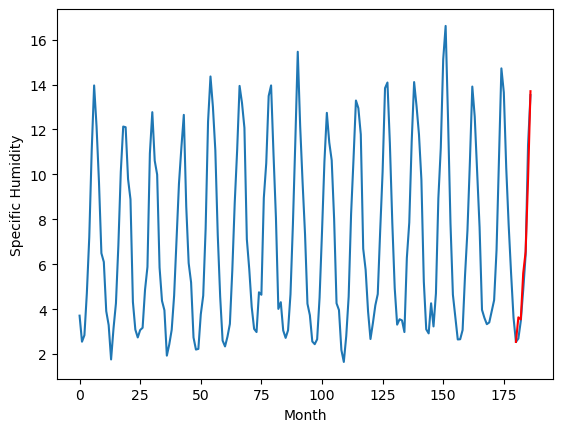

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.15		0.15
0.86		1.05		0.19
2.14		3.11		0.97
3.55		4.07		0.52
5.14		7.31		2.17
10.01		11.21		1.20
[180, 181, 182, 183, 184, 185, 186]
[2.51, 1.145000102519989, 1.051514076590538, 3.1110481494665145, 4.068487989306449, 7.306546317934989, 11.213721143603324]


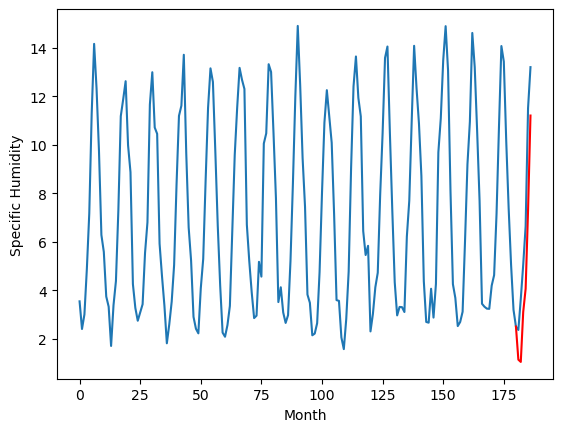

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.145000102519989, 2.185000102519989, 5.385000102519989, 3.165000102519989, 4.565000102519989, 3.185000102519989, 5.015000102519989, 3.4450001025199892, 3.385000102519989, 3.6350001025199887, 1.145000102519989]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56      1.145
1                 1    2.64      2.185
2                 2    6.37      5.385
3                 3    3.44      3.165
4                 4    4.91      4.565
5                 5    3.42      3.185
6                 6    5.73      5.015
7                 7    4.80      3.445
8                 8    4.60      3.385
9                 9    3.09      3.635
10               10    1.00      1.145


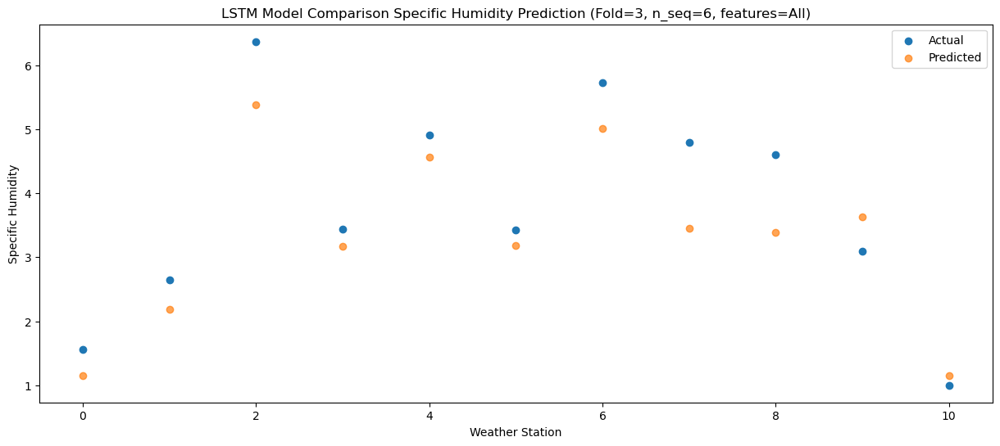

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   1.051514
1                 1    2.08   2.091514
2                 2    6.31   5.291514
3                 3    3.37   3.071514
4                 4    4.08   4.471514
5                 5    2.90   3.091514
6                 6    5.79   4.921514
7                 7    4.32   3.351514
8                 8    4.25   3.291514
9                 9    3.24   3.541514
10               10    0.86   1.051514


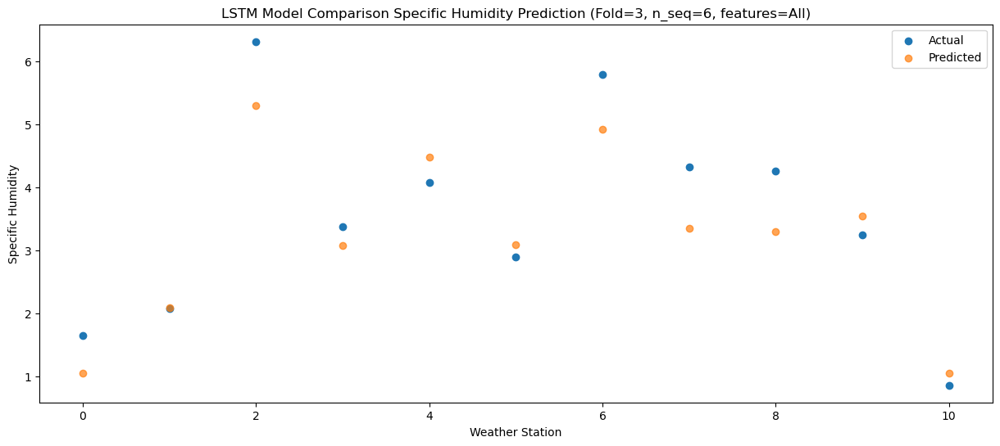

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   3.111048
1                 1    4.59   4.151048
2                 2    6.39   7.351048
3                 3    4.67   5.131048
4                 4    6.56   6.531048
5                 5    4.93   5.151048
6                 6    6.10   6.981048
7                 7    4.62   5.411048
8                 8    3.90   5.351048
9                 9    4.02   5.601048
10               10    2.14   3.111048


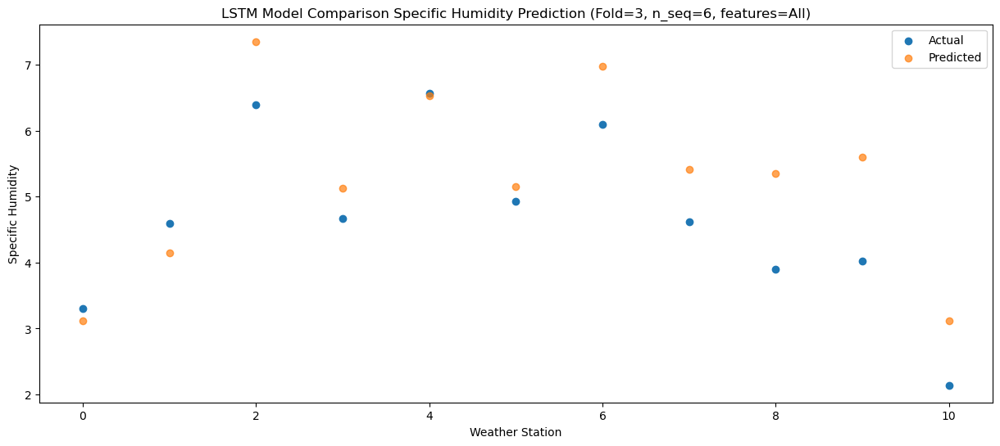

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    3.82   4.068488
1                 1    5.76   5.108488
2                 2    7.01   8.308488
3                 3    5.86   6.088488
4                 4    7.62   7.488488
5                 5    6.23   6.108488
6                 6    6.57   7.938488
7                 7    4.31   6.368488
8                 8    4.83   6.308488
9                 9    5.40   6.558488
10               10    3.55   4.068488


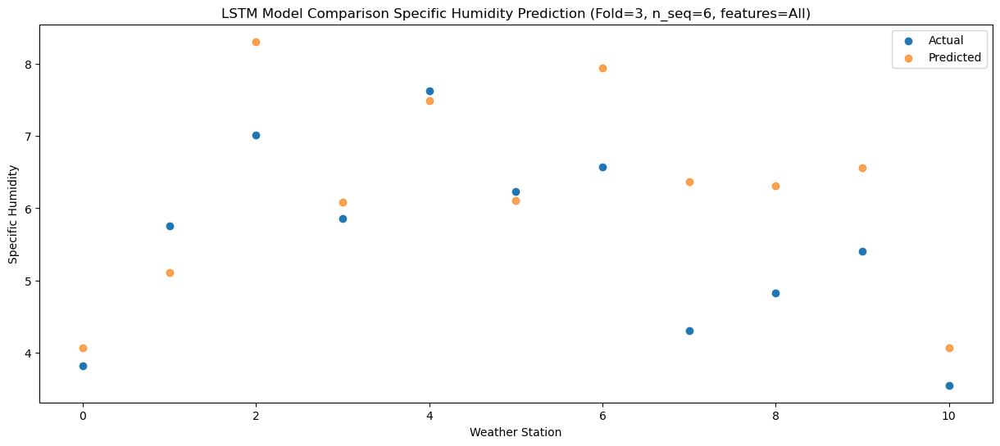

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    6.60   7.306546
1                 1    9.28   8.346546
2                 2    7.41  11.546546
3                 3    8.39   9.326546
4                 4   10.04  10.726546
5                 5    8.47   9.346546
6                 6    7.97  11.176546
7                 7    4.87   9.606546
8                 8    5.27   9.546546
9                 9    6.97   9.796546
10               10    5.14   7.306546


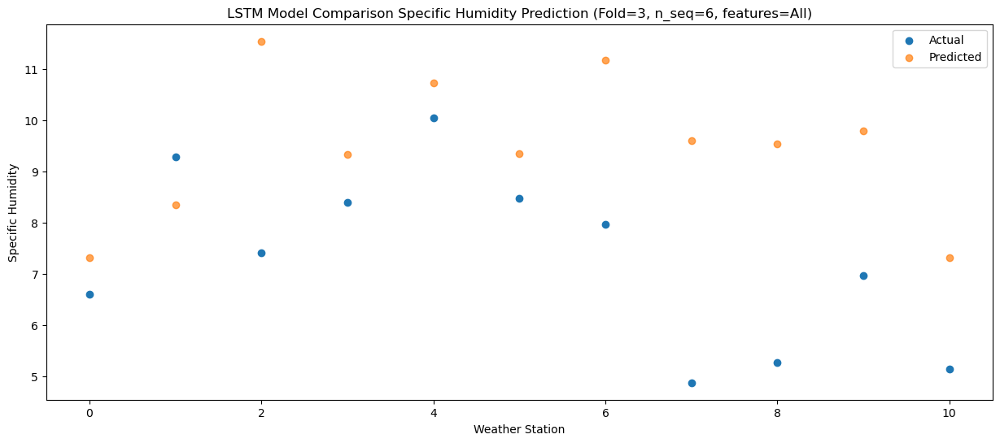

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   11.32  11.213721
1                 1   13.81  12.253721
2                 2    9.86  15.453721
3                 3   13.81  13.233721
4                 4   14.50  14.633721
5                 5   13.69  13.253721
6                 6    9.30  15.083721
7                 7    6.29  13.513721
8                 8    6.70  13.453721
9                 9   11.87  13.703721
10               10   10.01  11.213721


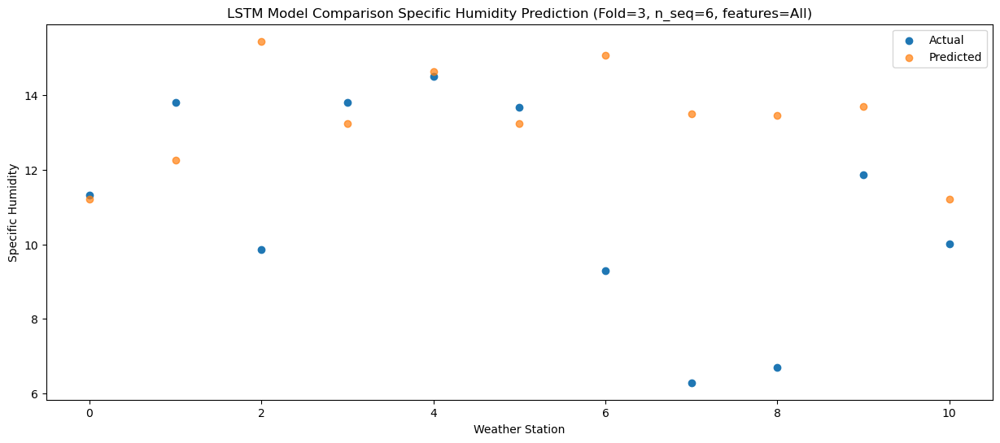

Model: "sequential_503"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1006 (LSTM)            (1, 1, 512)               5449728   
                                                                 
 dropout_1006 (Dropout)      (1, 1, 512)               0         
                                                                 
 lstm_1007 (LSTM)            (1, 512)                  2099200   
                                                                 
 dropout_1007 (Dropout)      (1, 512)                  0         
                                                                 
 dense_1509 (Dense)          (1, 256)                  131328    
                                                                 
 dense_1510 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1511 (Dense)          (1, 6)                 

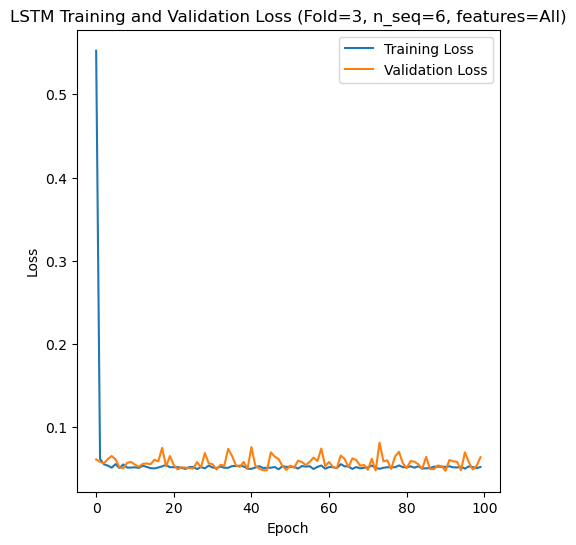

Epoch 1/100
84/84 [==============================] - 38s 273ms/step - loss: 0.6125 - val_loss: 0.0647
Epoch 2/100
84/84 [==============================] - 20s 235ms/step - loss: 0.0695 - val_loss: 0.0604
Epoch 3/100
84/84 [==============================] - 22s 258ms/step - loss: 0.0610 - val_loss: 0.0589
Epoch 4/100
84/84 [==============================] - 22s 259ms/step - loss: 0.0540 - val_loss: 0.0464
Epoch 5/100
84/84 [==============================] - 21s 247ms/step - loss: 0.0541 - val_loss: 0.0480
Epoch 6/100
84/84 [==============================] - 19s 222ms/step - loss: 0.0536 - val_loss: 0.0491
Epoch 7/100
84/84 [==============================] - 18s 210ms/step - loss: 0.0542 - val_loss: 0.0471
Epoch 8/100
84/84 [==============================] - 19s 232ms/step - loss: 0.0547 - val_loss: 0.0446
Epoch 9/100
84/84 [==============================] - 20s 238ms/step - loss: 0.0530 - val_loss: 0.0536
Epoch 10/100
84/84 [==============================] - 20s 240ms/step - loss: 0.053

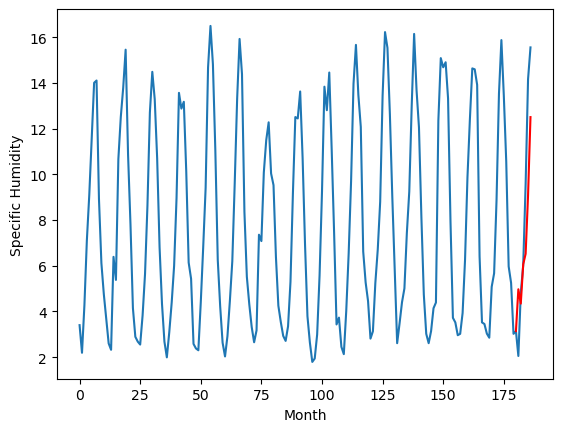

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		3.67		-0.60
6.26		3.04		-3.22
6.23		4.76		-1.47
6.98		5.22		-1.76
8.31		7.79		-0.52
12.60		11.21		-1.39
[180, 181, 182, 183, 184, 185, 186]
[7.79, 3.670159814953804, 3.04333782017231, 4.761251567006111, 5.222320584654808, 7.788998393416405, 11.207786111235619]


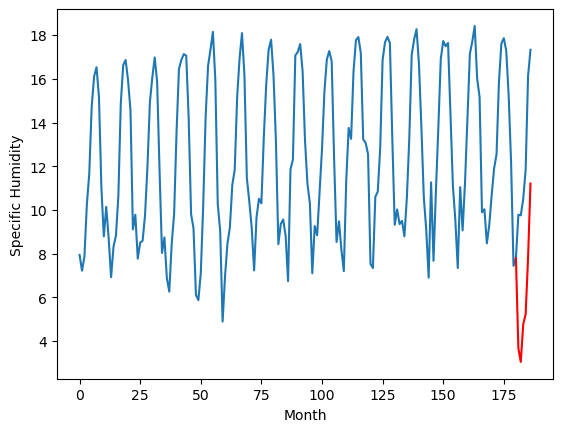

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		3.73		-0.14
3.75		3.10		-0.65
6.81		4.82		-1.99
7.06		5.28		-1.78
10.50		7.85		-2.65
14.74		11.27		-3.47
[180, 181, 182, 183, 184, 185, 186]
[5.03, 3.730159814953804, 3.10333782017231, 4.821251567006112, 5.2823205846548085, 7.848998393416405, 11.267786111235619]


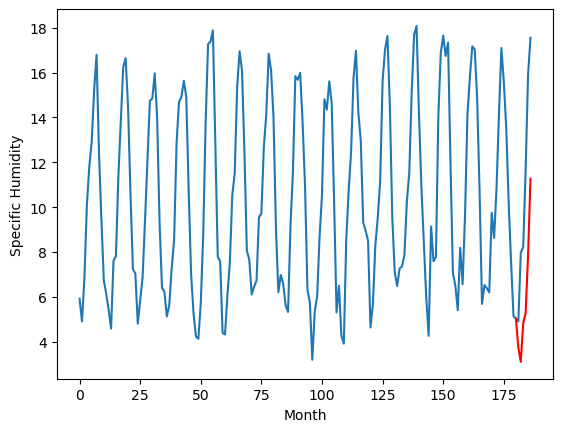

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.59		-0.14
3.41		2.96		-0.45
6.07		4.68		-1.39
7.36		5.14		-2.22
11.36		7.71		-3.65
15.05		11.13		-3.92
[180, 181, 182, 183, 184, 185, 186]
[4.41, 3.590159814953804, 2.9633378201723097, 4.681251567006111, 5.142320584654808, 7.708998393416405, 11.127786111235618]


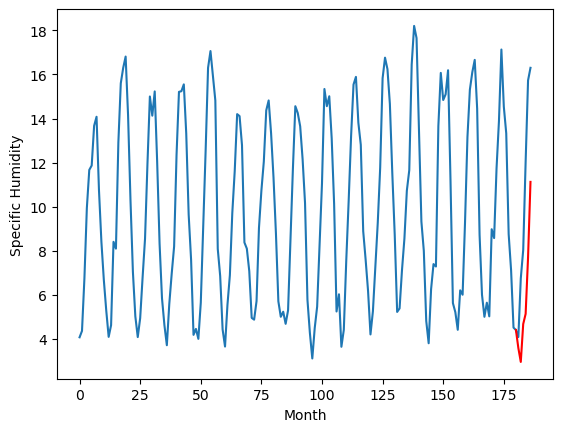

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		3.15		-0.21
2.91		2.52		-0.39
5.49		4.24		-1.25
6.85		4.70		-2.15
11.14		7.27		-3.87
15.02		10.69		-4.33
[180, 181, 182, 183, 184, 185, 186]
[4.29, 3.150159814953804, 2.52333782017231, 4.2412515670061115, 4.702320584654808, 7.268998393416405, 10.687786111235619]


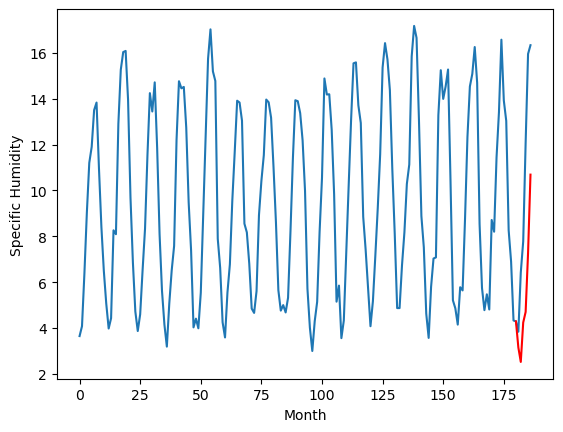

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		7.69		-0.95
8.00		7.06		-0.94
9.49		8.78		-0.71
10.45		9.24		-1.21
15.00		11.81		-3.19
17.30		15.23		-2.07
[180, 181, 182, 183, 184, 185, 186]
[3.47, 7.690159814953804, 7.06333782017231, 8.781251567006112, 9.24232058465481, 11.808998393416406, 15.22778611123562]


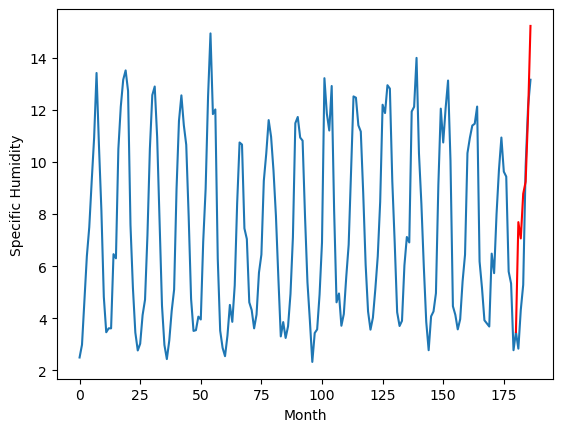

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.67		-0.13
6.05		5.04		-1.01
7.76		6.76		-1.00
8.17		7.22		-0.95
11.15		9.79		-1.36
15.84		13.21		-2.63
[180, 181, 182, 183, 184, 185, 186]
[4.52, 5.670159814953804, 5.04333782017231, 6.761251567006111, 7.222320584654808, 9.788998393416405, 13.207786111235619]


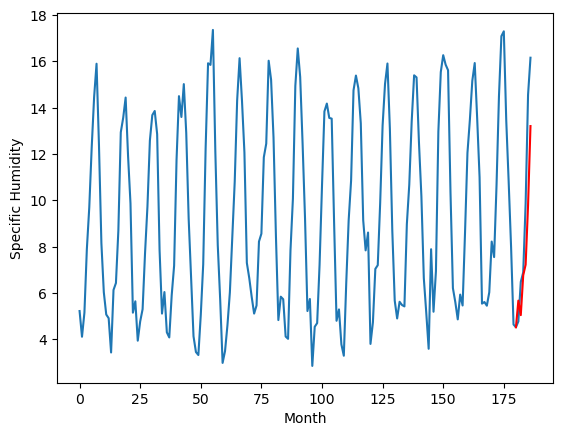

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		3.83		-0.10
3.30		3.20		-0.10
5.67		4.92		-0.75
6.59		5.38		-1.21
9.75		7.95		-1.80
14.35		11.37		-2.98
[180, 181, 182, 183, 184, 185, 186]
[3.4, 3.830159814953804, 3.20333782017231, 4.921251567006111, 5.382320584654808, 7.948998393416405, 11.367786111235619]


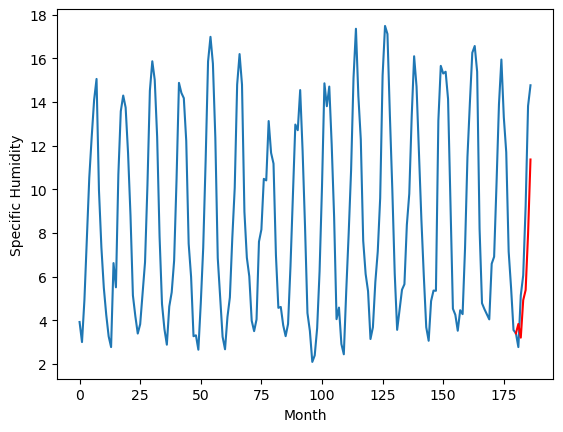

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.40		0.10
2.73		2.77		0.04
4.67		4.49		-0.18
6.00		4.95		-1.05
8.29		7.52		-0.77
13.35		10.94		-2.41
[180, 181, 182, 183, 184, 185, 186]
[2.82, 3.400159814953804, 2.77333782017231, 4.4912515670061115, 4.952320584654808, 7.518998393416405, 10.937786111235619]


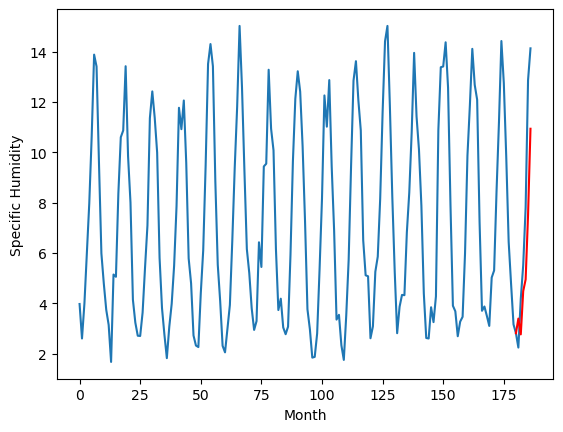

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		2.24		0.07
1.53		1.61		0.08
3.90		3.33		-0.57
5.21		3.79		-1.42
7.83		6.36		-1.47
12.58		9.78		-2.80
[180, 181, 182, 183, 184, 185, 186]
[2.86, 2.2401598149538042, 1.61333782017231, 3.3312515670061114, 3.7923205846548083, 6.358998393416405, 9.777786111235619]


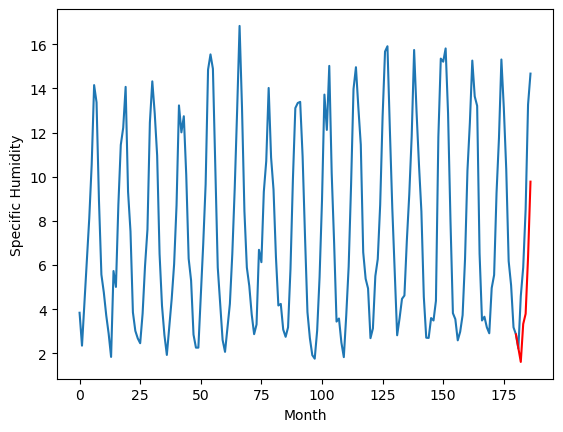

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		4.97		0.13
4.27		4.34		0.07
5.56		6.06		0.50
7.23		6.52		-0.71
8.83		9.09		0.26
13.84		12.51		-1.33
[180, 181, 182, 183, 184, 185, 186]
[2.61, 4.970159814953804, 4.34333782017231, 6.061251567006111, 6.522320584654808, 9.088998393416404, 12.507786111235617]


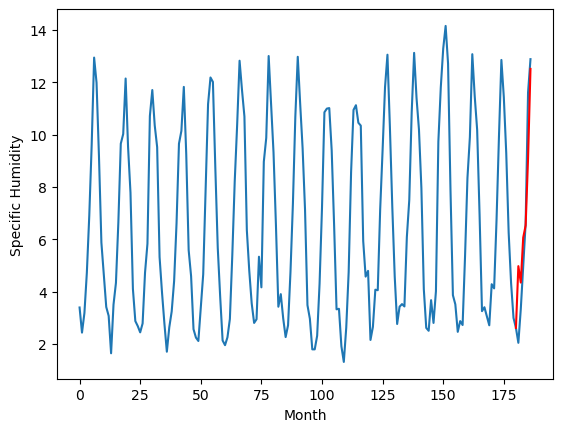

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[4.970159814953804, 3.670159814953804, 3.730159814953804, 3.590159814953804, 3.150159814953804, 7.690159814953804, 5.670159814953804, 3.830159814953804, 3.400159814953804, 2.2401598149538042, 4.970159814953804]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34    4.97016
1                 1    4.27    3.67016
2                 2    3.87    3.73016
3                 3    3.73    3.59016
4                 4    3.36    3.15016
5                 5    8.64    7.69016
6                 6    5.80    5.67016
7                 7    3.93    3.83016
8                 8    3.30    3.40016
9                 9    2.17    2.24016
10               10    4.84    4.97016


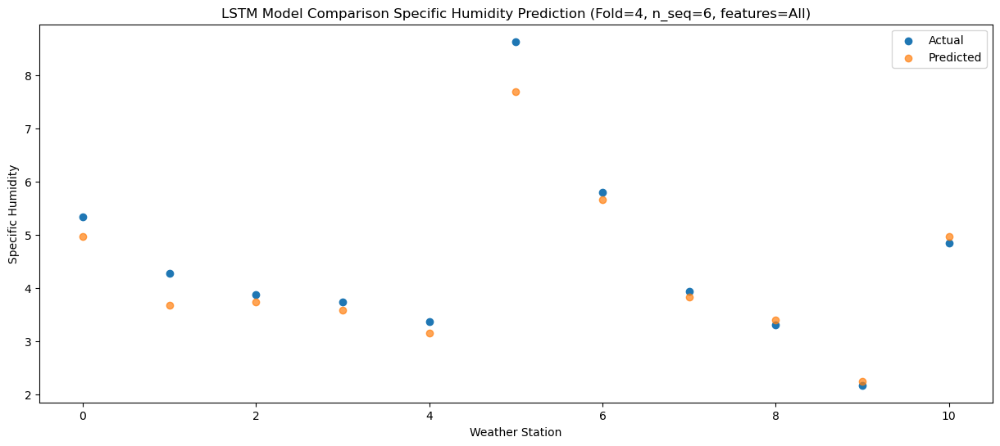

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   4.343338
1                 1    6.26   3.043338
2                 2    3.75   3.103338
3                 3    3.41   2.963338
4                 4    2.91   2.523338
5                 5    8.00   7.063338
6                 6    6.05   5.043338
7                 7    3.30   3.203338
8                 8    2.73   2.773338
9                 9    1.53   1.613338
10               10    4.27   4.343338


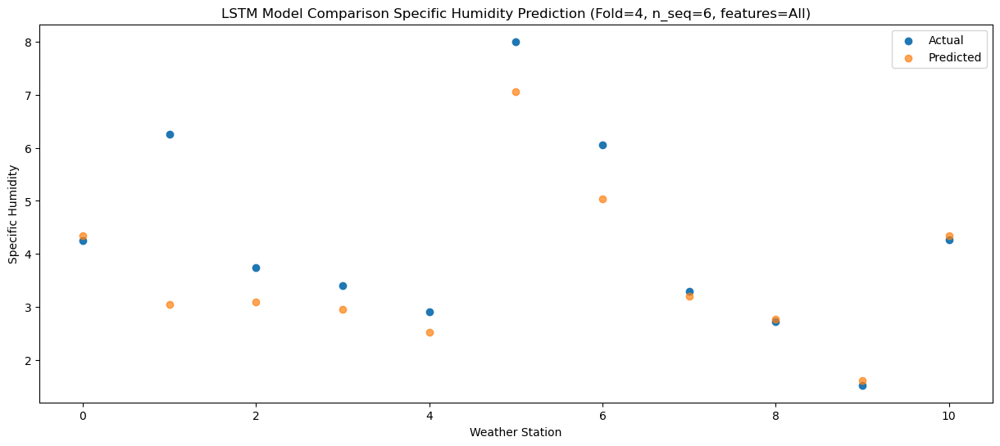

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   6.061252
1                 1    6.23   4.761252
2                 2    6.81   4.821252
3                 3    6.07   4.681252
4                 4    5.49   4.241252
5                 5    9.49   8.781252
6                 6    7.76   6.761252
7                 7    5.67   4.921252
8                 8    4.67   4.491252
9                 9    3.90   3.331252
10               10    5.56   6.061252


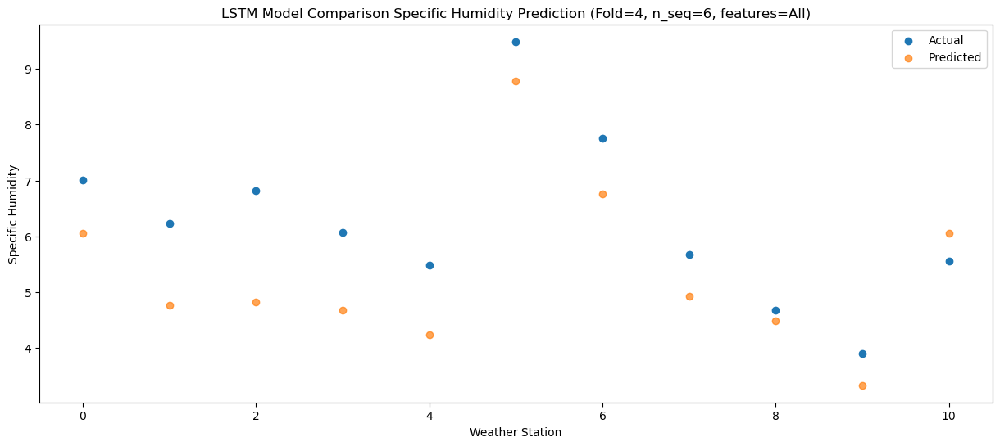

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    8.22   6.522321
1                 1    6.98   5.222321
2                 2    7.06   5.282321
3                 3    7.36   5.142321
4                 4    6.85   4.702321
5                 5   10.45   9.242321
6                 6    8.17   7.222321
7                 7    6.59   5.382321
8                 8    6.00   4.952321
9                 9    5.21   3.792321
10               10    7.23   6.522321


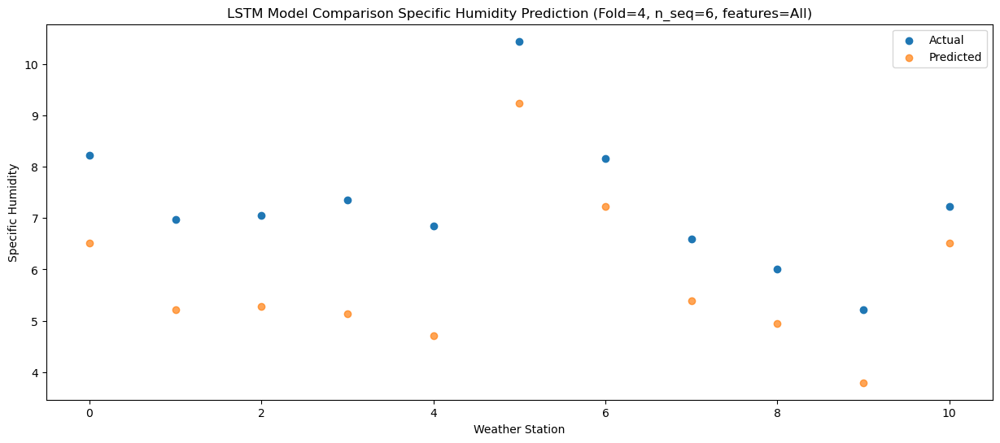

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   11.78   9.088998
1                 1    8.31   7.788998
2                 2   10.50   7.848998
3                 3   11.36   7.708998
4                 4   11.14   7.268998
5                 5   15.00  11.808998
6                 6   11.15   9.788998
7                 7    9.75   7.948998
8                 8    8.29   7.518998
9                 9    7.83   6.358998
10               10    8.83   9.088998


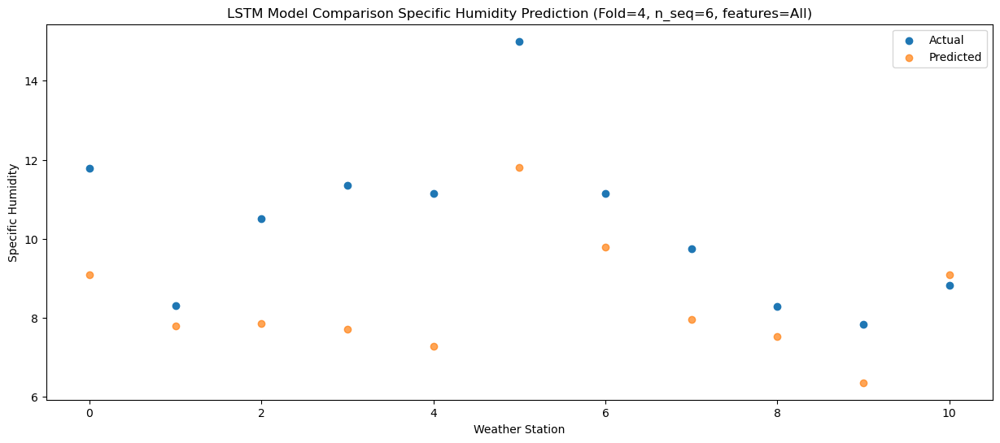

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   16.37  12.507786
1                 1   12.60  11.207786
2                 2   14.74  11.267786
3                 3   15.05  11.127786
4                 4   15.02  10.687786
5                 5   17.30  15.227786
6                 6   15.84  13.207786
7                 7   14.35  11.367786
8                 8   13.35  10.937786
9                 9   12.58   9.777786
10               10   13.84  12.507786


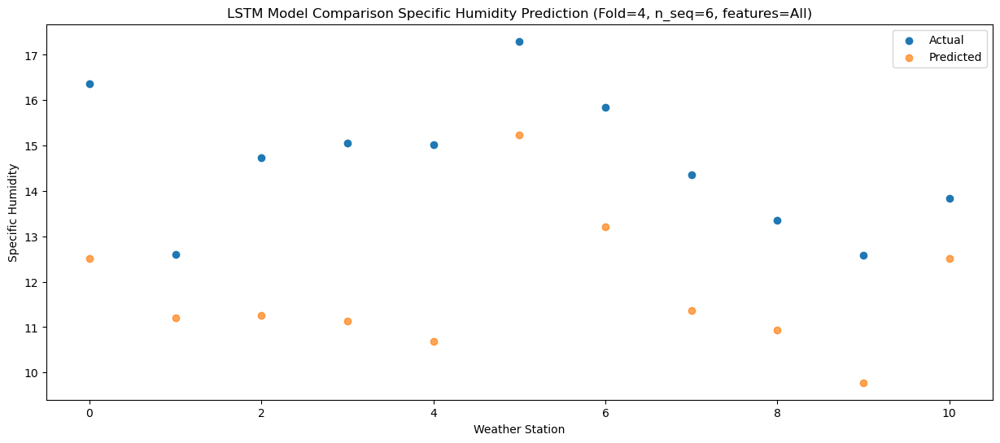

Model: "sequential_504"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1008 (LSTM)            (1, 1, 512)               5449728   
                                                                 
 dropout_1008 (Dropout)      (1, 1, 512)               0         
                                                                 
 lstm_1009 (LSTM)            (1, 512)                  2099200   
                                                                 
 dropout_1009 (Dropout)      (1, 512)                  0         
                                                                 
 dense_1512 (Dense)          (1, 256)                  131328    
                                                                 
 dense_1513 (Dense)          (1, 128)                  32896     
                                                                 
 dense_1514 (Dense)          (1, 6)                 

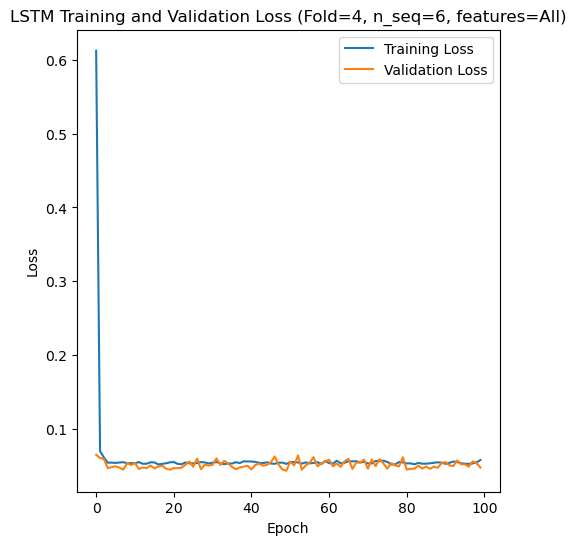

[[0.2916426507223891, 0.7201675406744019, 1.595516914101639, 1.2197703597089, 2.495252870269693, 2.4977945510251782], [0.3833521004317241, 0.47891378335071394, 0.7101474276712842, 0.7327156600279732, 1.3745672521701748, 0.8877565829115033], [0.4737352631270471, 1.0357219912951434, 1.1203120902372588, 1.2680826207188325, 2.3206159420142054, 2.465245646557454], [0.7224248254230666, 0.6334037014508508, 0.8720119094628234, 1.0515588302471401, 2.7681188717874092, 3.9349383470832686], [0.3742449789503723, 1.0886632504650904, 1.094099324170774, 1.5399426772153548, 2.354087369839819, 2.9943166817316405]]
[[0.24310658630999632, 0.5565753130208357, 1.367747857706113, 1.028203148164532, 2.207082351527431, 2.338439636420119], [0.2908709338036454, 0.4051027187975972, 0.6149887437712067, 0.6620986476269637, 1.1845903244343667, 0.7748026809367269], [0.3464896649122237, 0.7070944000916047, 0.9274394025044006, 1.0937970109961244, 1.7646626724438235, 1.8077305929769165], [0.6077272074872797, 0.527135083

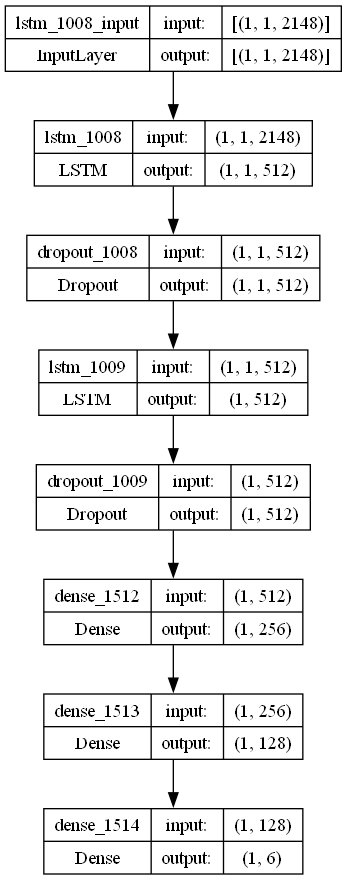

In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

# Make one forecast with an LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100

# Optimize and fit the model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S6.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

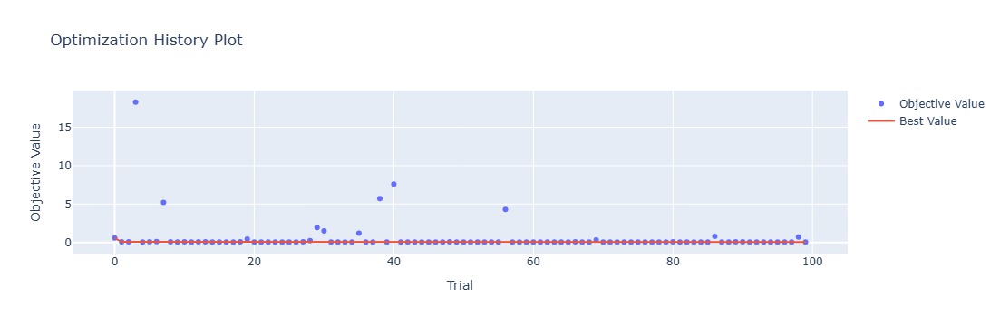

In [4]:
optuna.visualization.plot_optimization_history(study)

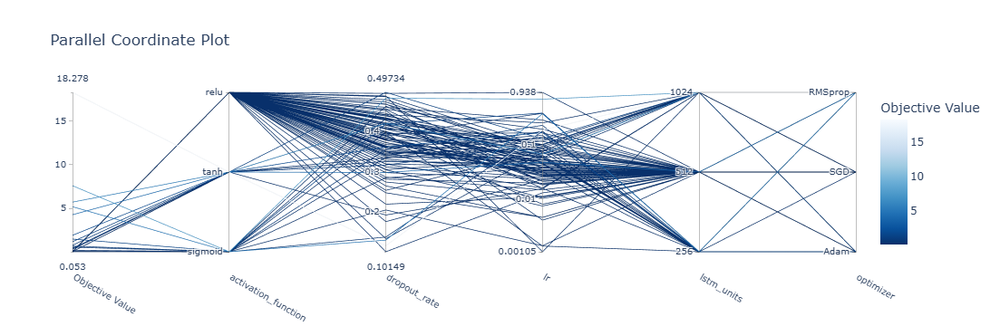

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

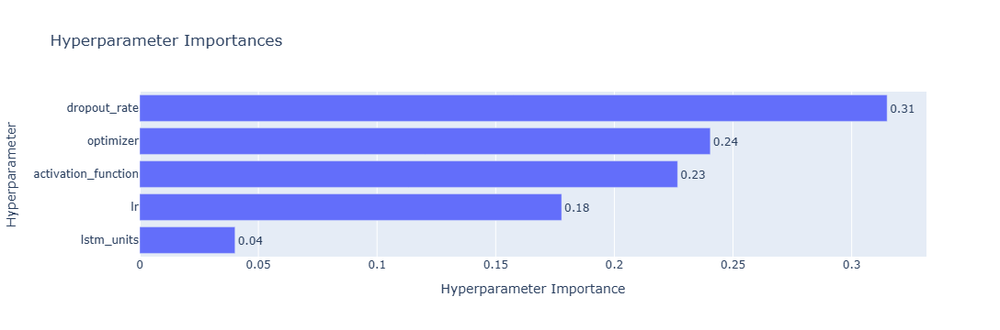

In [6]:
optuna.visualization.plot_param_importances(study)

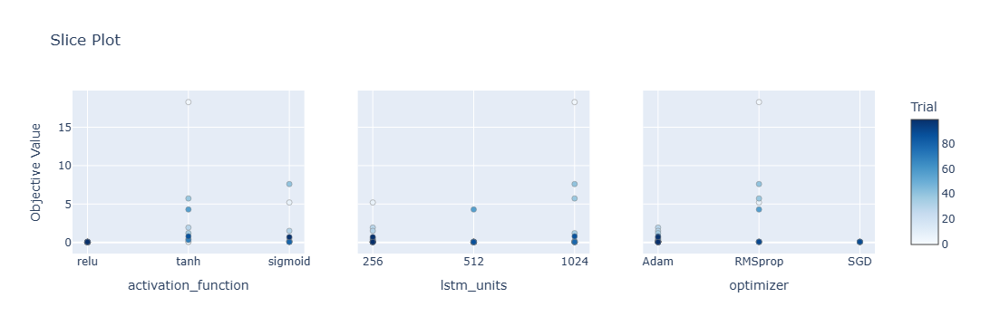

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

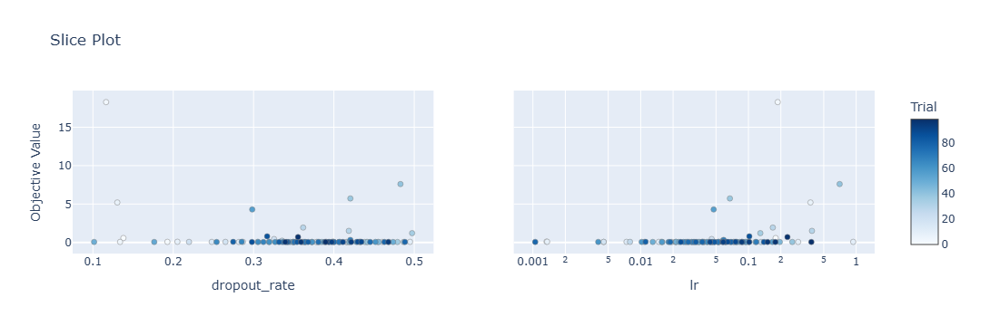

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[ 5.39  4.3   6.51 ... 13.73  8.35  9.05]
 [ 8.03  6.78  8.21 ... 17.14 11.74 12.27]
 [ 5.48  4.27  5.49 ... 13.3   9.17  8.6 ]
 ...
 [ 4.55  3.1   4.22 ... 12.8   7.91  6.65]
 [ 4.44  3.4   5.39 ... 12.34  7.74  6.78]
 [ 4.14  2.75  4.12 ... 10.6   7.07  6.41]]
Epoch 1/100
84/84 [==============================] - 7s 40ms/step - loss: 0.7270 - accuracy: 0.4167 - mae: 0.6477 - rmse: 0.7270 - mape: 114.0811 - pearson: 0.3277 - val_loss: 0.2423 - val_accuracy: 0.8000 - val_mae: 0.2176 - val_rmse: 0.2423 - val_mape: 36.6978 - val_pearson: 0.1637
Epoch 2/100
84/84 [==============================] - 2s 24ms/step - loss: 0.0768 - accuracy: 0.7857 - mae: 0.0638 - rmse: 0.0768 - mape: 10.8213 - pearson: 0.6800 - val_loss: 0.0499 - val_accuracy: 0.8000 - val_mae: 0.0439 - val_rmse: 0.0499 - val_mape: 7.5909 - val_pearson: 0.8182
Epoch 3/100
84/84 [==============================] - 2s 26ms/step - loss: 0.0582 - accuracy: 0.7381 - mae: 0.0471 - rmse: 0.0582 - mape: 7.9293 - pearson: 0.7446 - val_

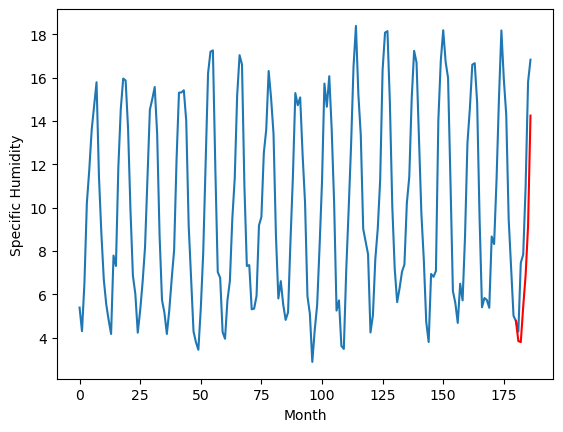

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.74		5.09		-0.65
6.45		5.04		-1.41
8.66		6.68		-1.98
8.88		8.14		-0.74
11.37		10.40		-0.97
16.12		15.50		-0.62
[180, 181, 182, 183, 184, 185, 186]
[7.05, 5.092360421419143, 5.044074121266603, 6.679558697491884, 8.142685356885195, 10.404096070080996, 15.50067371442914]


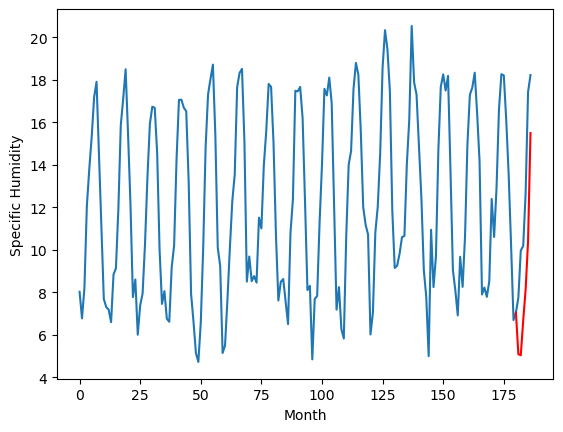

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.41		7.73		-0.68
8.56		7.68		-0.88
10.41		9.32		-1.09
10.65		10.78		0.13
13.41		13.04		-0.37
18.03		18.14		0.11
[180, 181, 182, 183, 184, 185, 186]
[5.06, 7.732360421419143, 7.684074121266603, 9.319558697491884, 10.782685356885194, 13.044096070080995, 18.14067371442914]


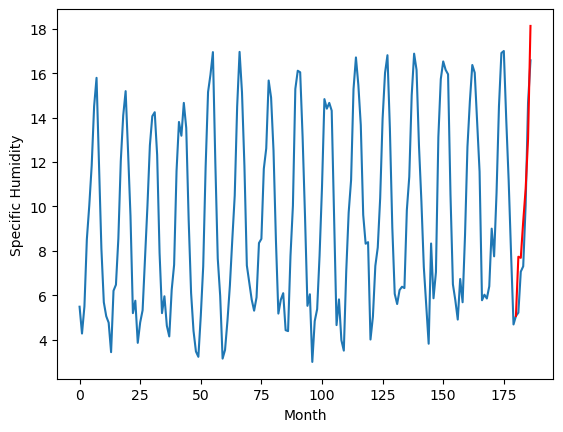

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.55		5.18		-0.37
5.46		5.13		-0.33
8.91		6.77		-2.14
9.48		8.23		-1.25
12.99		10.49		-2.50
16.89		15.59		-1.30
[180, 181, 182, 183, 184, 185, 186]
[7.05, 5.182360421419144, 5.134074121266604, 6.769558697491885, 8.232685356885195, 10.494096070080996, 15.59067371442914]


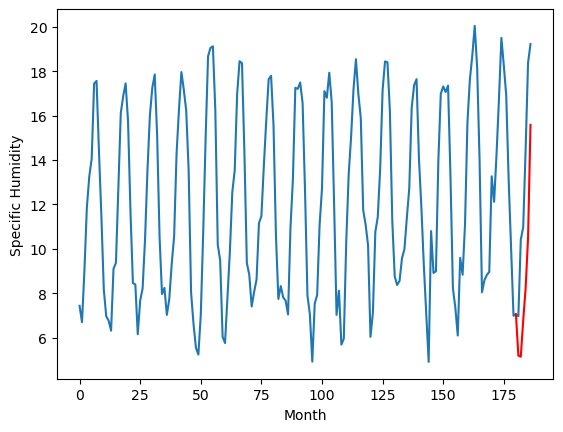

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.36		7.13		-0.23
6.96		7.08		0.12
9.80		8.72		-1.08
11.20		10.18		-1.02
15.21		12.44		-2.77
18.90		17.54		-1.36
[180, 181, 182, 183, 184, 185, 186]
[5.2, 7.132360421419143, 7.084074121266603, 8.719558697491884, 10.182685356885194, 12.444096070080995, 17.54067371442914]


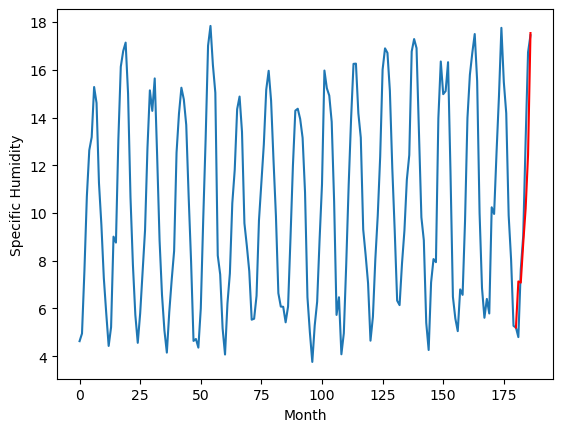

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.02		4.33		0.31
4.61		4.28		-0.33
6.18		5.92		-0.26
7.19		7.38		0.19
9.69		9.64		-0.05
14.95		14.74		-0.21
[180, 181, 182, 183, 184, 185, 186]
[5.16, 4.332360421419144, 4.284074121266603, 5.919558697491884, 7.382685356885195, 9.644096070080995, 14.740673714429139]


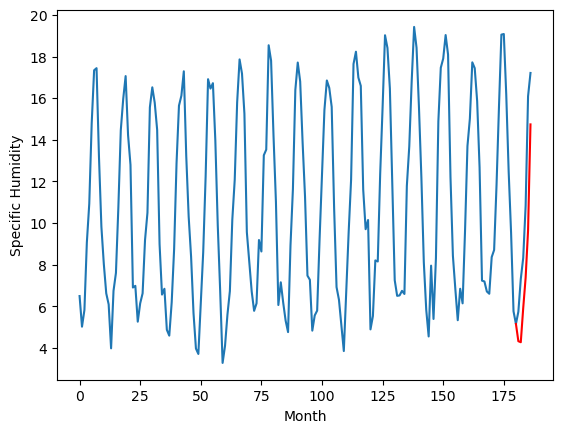

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.35		6.20		-0.15
6.40		6.15		-0.25
7.99		7.79		-0.20
8.59		9.25		0.66
11.59		11.51		-0.08
15.97		16.61		0.64
[180, 181, 182, 183, 184, 185, 186]
[4.05, 6.202360421419144, 6.1540741212666035, 7.789558697491884, 9.252685356885195, 11.514096070080996, 16.61067371442914]


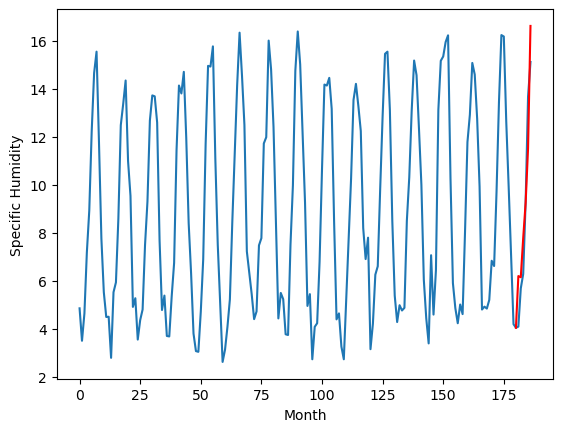

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.55		4.56		0.01
4.58		4.51		-0.07
6.20		6.15		-0.05
6.90		7.61		0.71
9.92		9.87		-0.05
14.19		14.97		0.78
[180, 181, 182, 183, 184, 185, 186]
[3.64, 4.562360421419144, 4.514074121266604, 6.1495586974918846, 7.612685356885195, 9.874096070080995, 14.97067371442914]


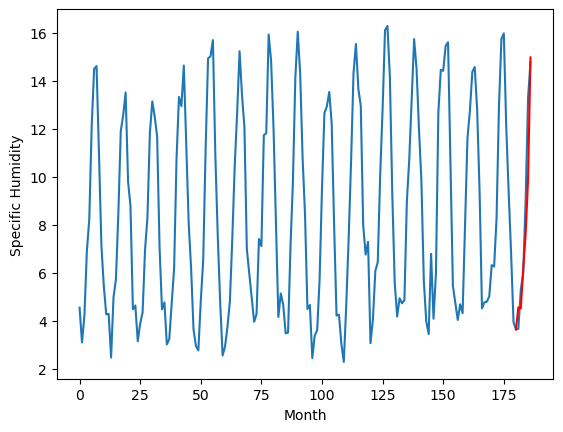

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.32		4.25		-0.07
3.64		4.20		0.56
6.70		5.84		-0.86
7.43		7.30		-0.13
10.34		9.56		-0.78
15.32		14.66		-0.66
[180, 181, 182, 183, 184, 185, 186]
[3.46, 4.2523604214191435, 4.204074121266603, 5.839558697491884, 7.302685356885195, 9.564096070080996, 14.66067371442914]


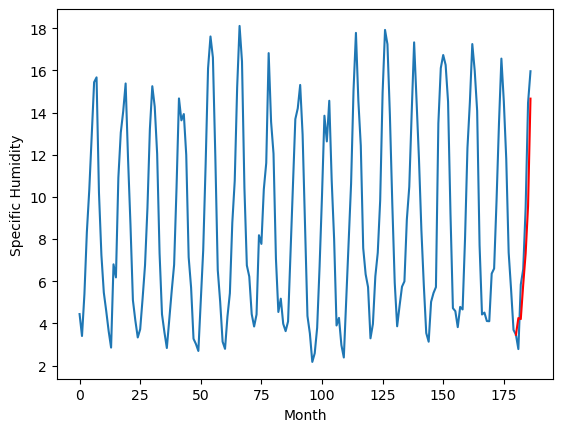

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.11		4.14		0.03
3.66		4.09		0.43
5.46		5.73		0.27
6.78		7.19		0.41
8.87		9.45		0.58
13.64		14.55		0.91
[180, 181, 182, 183, 184, 185, 186]
[2.93, 4.142360421419144, 4.094074121266604, 5.729558697491885, 7.192685356885195, 9.454096070080997, 14.550673714429141]


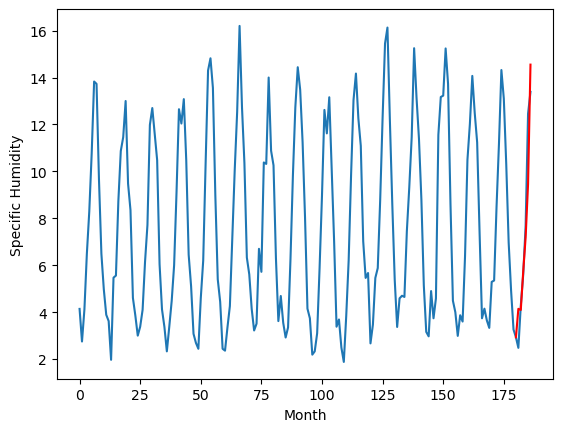

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.76		3.84		0.08
3.02		3.79		0.77
4.64		5.43		0.79
6.24		6.89		0.65
7.76		9.15		1.39
12.89		14.25		1.36
[180, 181, 182, 183, 184, 185, 186]
[2.74, 3.8423604214191434, 3.794074121266603, 5.429558697491884, 6.8926853568851945, 9.154096070080996, 14.25067371442914]


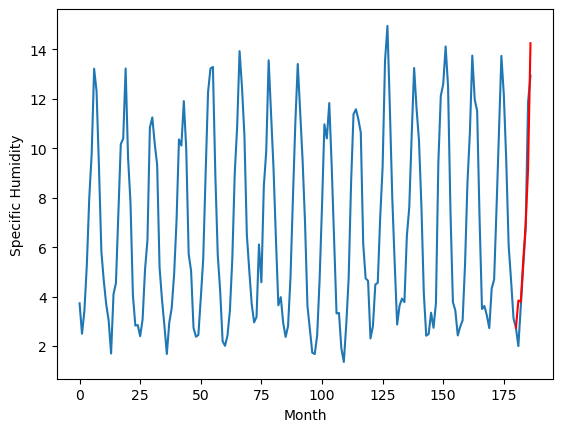

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.90    3.84236
1                 1    5.74    5.09236
2                 2    8.41    7.73236
3                 3    5.55    5.18236
4                 4    7.36    7.13236
5                 5    4.02    4.33236
6                 6    6.35    6.20236
7                 7    4.55    4.56236
8                 8    4.32    4.25236
9                 9    4.11    4.14236
10               10    3.76    3.84236


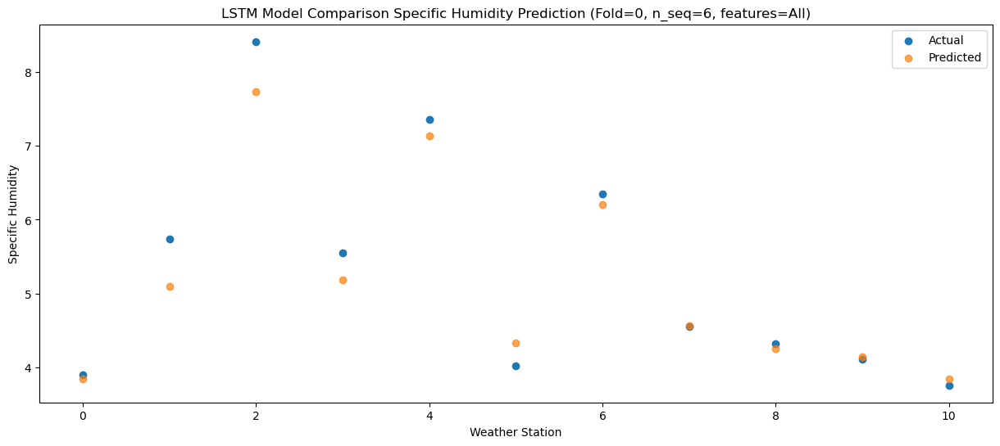

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.41   3.794074
1                 1    6.45   5.044074
2                 2    8.56   7.684074
3                 3    5.46   5.134074
4                 4    6.96   7.084074
5                 5    4.61   4.284074
6                 6    6.40   6.154074
7                 7    4.58   4.514074
8                 8    3.64   4.204074
9                 9    3.66   4.094074
10               10    3.02   3.794074


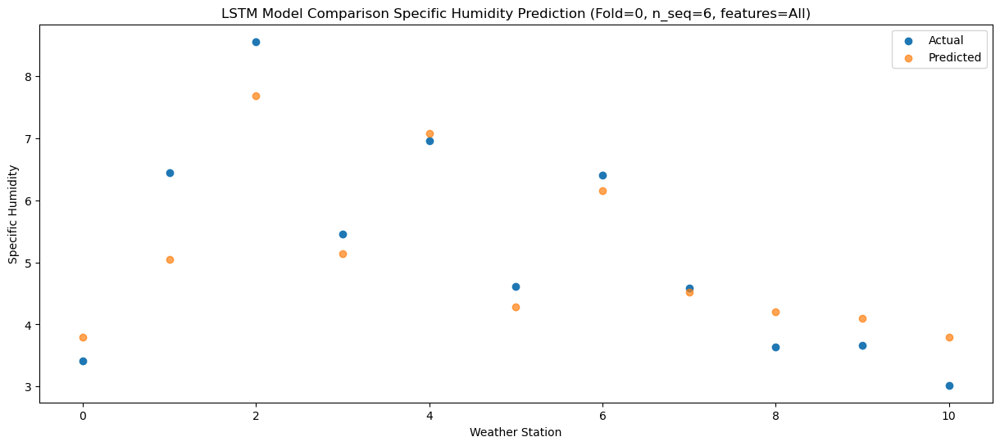

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.58   5.429559
1                 1    8.66   6.679559
2                 2   10.41   9.319559
3                 3    8.91   6.769559
4                 4    9.80   8.719559
5                 5    6.18   5.919559
6                 6    7.99   7.789559
7                 7    6.20   6.149559
8                 8    6.70   5.839559
9                 9    5.46   5.729559
10               10    4.64   5.429559


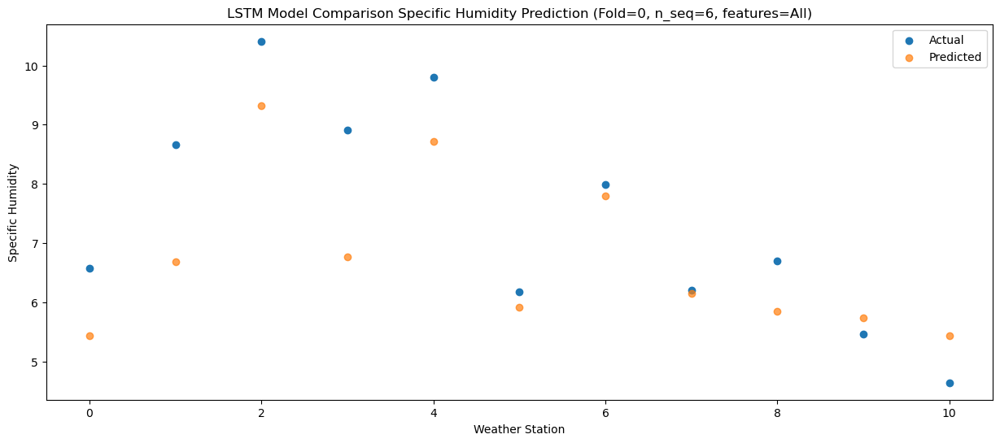

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.97   6.892685
1                 1    8.88   8.142685
2                 2   10.65  10.782685
3                 3    9.48   8.232685
4                 4   11.20  10.182685
5                 5    7.19   7.382685
6                 6    8.59   9.252685
7                 7    6.90   7.612685
8                 8    7.43   7.302685
9                 9    6.78   7.192685
10               10    6.24   6.892685


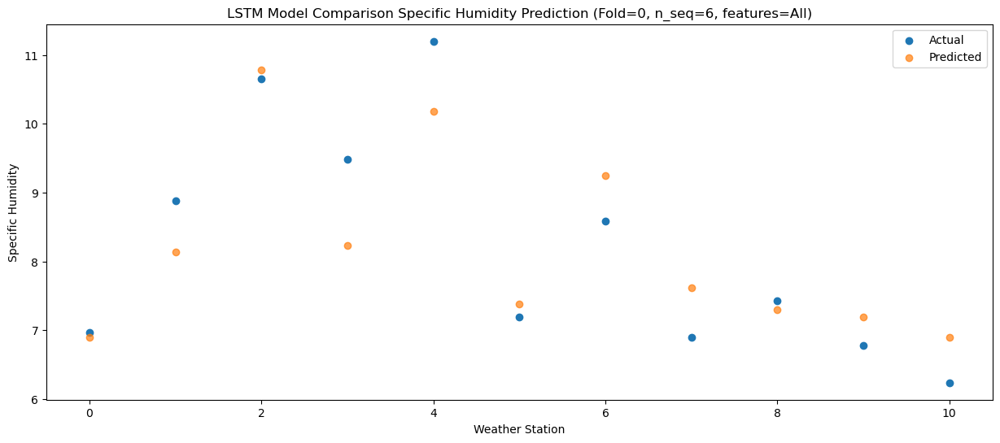

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.12   9.154096
1                 1   11.37  10.404096
2                 2   13.41  13.044096
3                 3   12.99  10.494096
4                 4   15.21  12.444096
5                 5    9.69   9.644096
6                 6   11.59  11.514096
7                 7    9.92   9.874096
8                 8   10.34   9.564096
9                 9    8.87   9.454096
10               10    7.76   9.154096


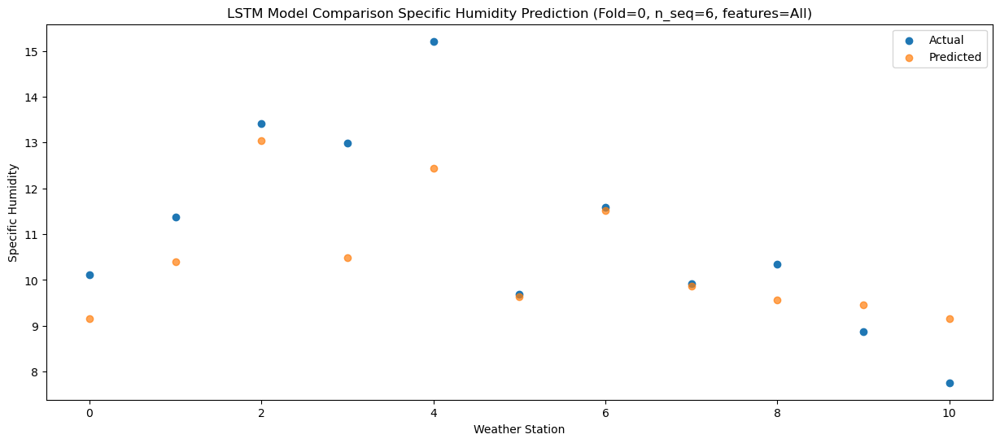

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.93  14.250674
1                 1   16.12  15.500674
2                 2   18.03  18.140674
3                 3   16.89  15.590674
4                 4   18.90  17.540674
5                 5   14.95  14.740674
6                 6   15.97  16.610674
7                 7   14.19  14.970674
8                 8   15.32  14.660674
9                 9   13.64  14.550674
10               10   12.89  14.250674


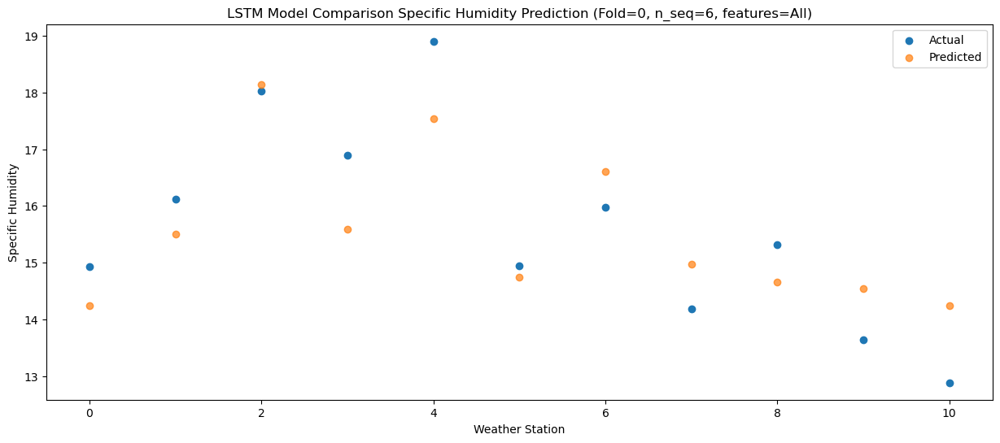

f, t:
[[ 3.9   5.74  8.41  5.55  7.36  4.02  6.35  4.55  4.32  4.11  3.76]
 [ 3.41  6.45  8.56  5.46  6.96  4.61  6.4   4.58  3.64  3.66  3.02]
 [ 6.58  8.66 10.41  8.91  9.8   6.18  7.99  6.2   6.7   5.46  4.64]
 [ 6.97  8.88 10.65  9.48 11.2   7.19  8.59  6.9   7.43  6.78  6.24]
 [10.12 11.37 13.41 12.99 15.21  9.69 11.59  9.92 10.34  8.87  7.76]
 [14.93 16.12 18.03 16.89 18.9  14.95 15.97 14.19 15.32 13.64 12.89]]
[[ 3.84236042  5.09236042  7.73236042  5.18236042  7.13236042  4.33236042
   6.20236042  4.56236042  4.25236042  4.14236042  3.84236042]
 [ 3.79407412  5.04407412  7.68407412  5.13407412  7.08407412  4.28407412
   6.15407412  4.51407412  4.20407412  4.09407412  3.79407412]
 [ 5.4295587   6.6795587   9.3195587   6.7695587   8.7195587   5.9195587
   7.7895587   6.1495587   5.8395587   5.7295587   5.4295587 ]
 [ 6.89268536  8.14268536 10.78268536  8.23268536 10.18268536  7.38268536
   9.25268536  7.61268536  7.30268536  7.19268536  6.89268536]
 [ 9.15409607 10.40409607 13.044

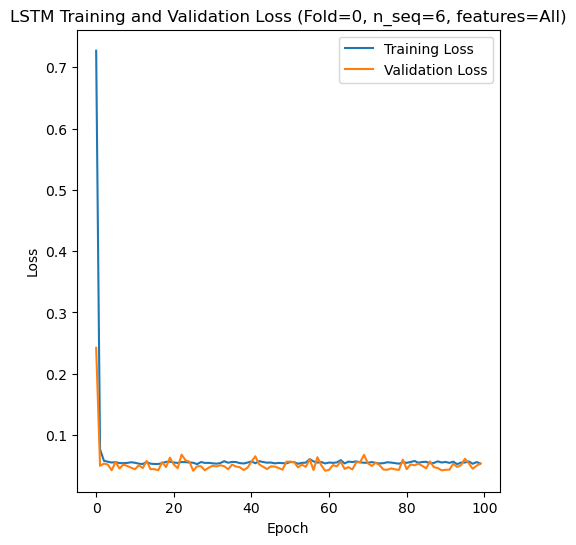

[[ 6.43  5.26  5.95 ... 15.04 10.09  9.76]
 [ 4.92  3.81  4.91 ... 12.52  8.69  7.9 ]
 [ 5.77  4.38  5.81 ... 14.28  9.78  9.52]
 ...
 [ 4.32  3.52  5.54 ... 12.    6.96  7.01]
 [ 3.07  3.12  5.08 ... 11.47  8.11  7.14]
 [ 2.37  2.06  3.5  ...  9.32  6.33  5.39]]
Epoch 1/100
84/84 [==============================] - 38s 164ms/step - loss: 0.5398 - accuracy: 0.5238 - mae: 0.4961 - rmse: 0.5398 - mape: 83.9137 - pearson: 0.4709 - val_loss: 0.1087 - val_accuracy: 0.7000 - val_mae: 0.0920 - val_rmse: 0.1087 - val_mape: 15.1299 - val_pearson: 0.6362
Epoch 2/100
84/84 [==============================] - 6s 74ms/step - loss: 0.0733 - accuracy: 0.7738 - mae: 0.0620 - rmse: 0.0733 - mape: 10.4768 - pearson: 0.7323 - val_loss: 0.0704 - val_accuracy: 0.7000 - val_mae: 0.0521 - val_rmse: 0.0704 - val_mape: 8.4077 - val_pearson: 0.7318
Epoch 3/100
84/84 [==============================] - 7s 79ms/step - loss: 0.0571 - accuracy: 0.8214 - mae: 0.0480 - rmse: 0.0571 - mape: 8.0938 - pearson: 0.7774 - val

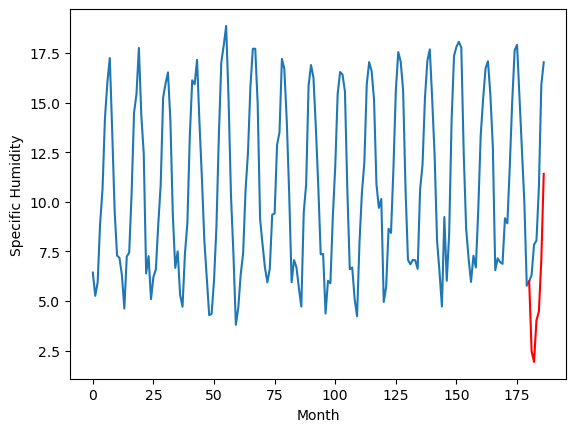

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.45		6.53		0.08
6.64		5.99		-0.65
8.17		8.08		-0.09
8.53		8.53		0.00
11.45		11.12		-0.33
15.43		15.46		0.03
[180, 181, 182, 183, 184, 185, 186]
[4.15, 6.5309532809257504, 5.98981957912445, 8.081682019233703, 8.53278731584549, 11.117285006046295, 15.461755983829498]


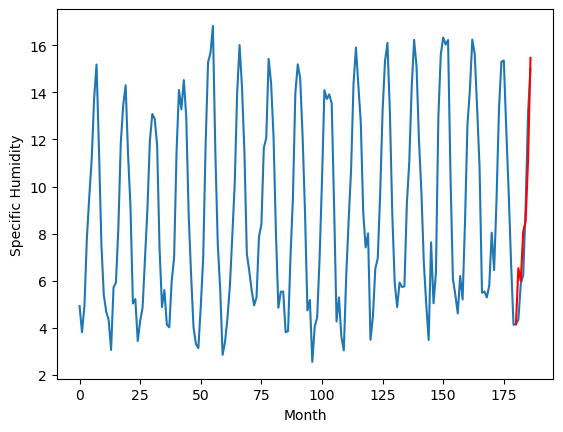

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.02		-0.05
5.07		4.48		-0.59
7.69		6.57		-1.12
7.40		7.02		-0.38
10.24		9.61		-0.63
14.76		13.95		-0.81
[180, 181, 182, 183, 184, 185, 186]
[5.12, 5.020953280925751, 4.479819579124451, 6.5716820192337035, 7.022787315845489, 9.607285006046295, 13.951755983829498]


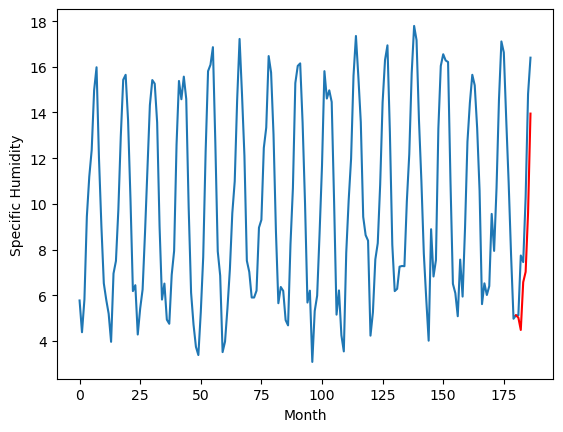

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.43		5.87		0.44
5.50		5.33		-0.17
8.14		7.42		-0.72
9.48		7.87		-1.61
13.37		10.46		-2.91
16.56		14.80		-1.76
[180, 181, 182, 183, 184, 185, 186]
[6.35, 5.87095328092575, 5.32981957912445, 7.421682019233703, 7.872787315845489, 10.457285006046295, 14.801755983829498]


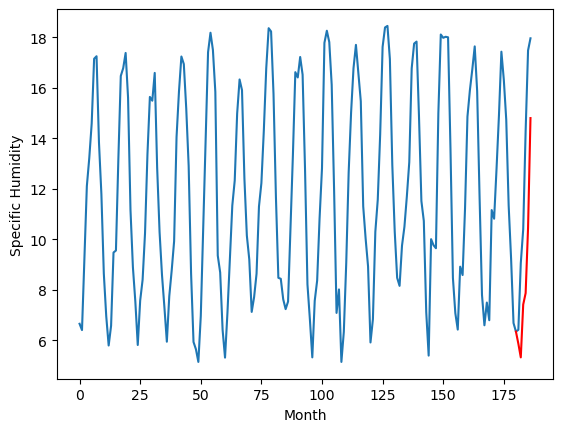

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.41		6.76		0.35
6.45		6.22		-0.23
9.17		8.31		-0.86
10.43		8.76		-1.67
14.46		11.35		-3.11
17.87		15.69		-2.18
[180, 181, 182, 183, 184, 185, 186]
[6.08, 6.760953280925751, 6.219819579124451, 8.311682019233704, 8.76278731584549, 11.347285006046295, 15.691755983829498]


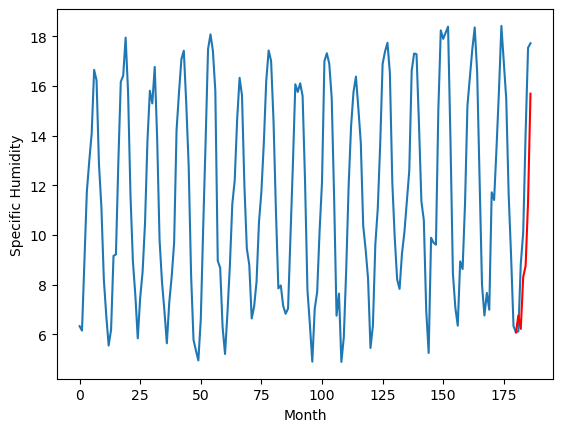

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.16		6.43		-0.73
6.53		5.89		-0.64
7.32		7.98		0.66
8.62		8.43		-0.19
12.93		11.02		-1.91
15.10		15.36		0.26
[180, 181, 182, 183, 184, 185, 186]
[3.92, 6.430953280925751, 5.889819579124451, 7.981682019233704, 8.43278731584549, 11.017285006046295, 15.361755983829498]


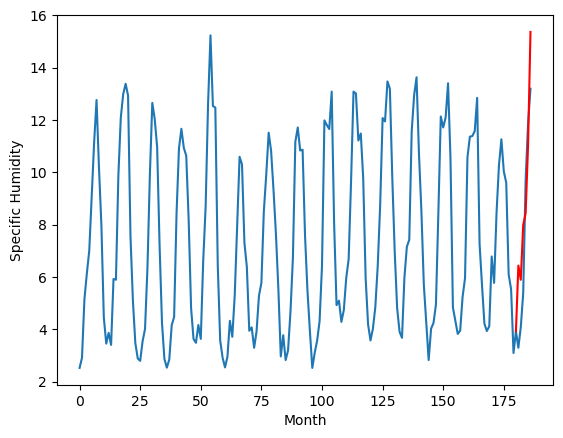

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.41		2.62		0.21
2.53		2.08		-0.45
4.09		4.17		0.08
4.71		4.62		-0.09
7.64		7.21		-0.43
11.99		11.55		-0.44
[180, 181, 182, 183, 184, 185, 186]
[4.16, 2.6209532809257508, 2.0798195791244507, 4.171682019233703, 4.622787315845489, 7.207285006046295, 11.551755983829498]


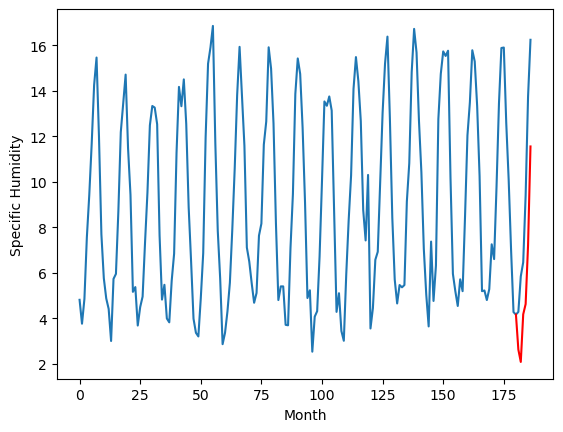

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.68		4.91		0.23
4.16		4.37		0.21
6.89		6.46		-0.43
8.12		6.91		-1.21
11.33		9.50		-1.83
16.09		13.84		-2.25
[180, 181, 182, 183, 184, 185, 186]
[3.84, 4.91095328092575, 4.36981957912445, 6.461682019233703, 6.912787315845489, 9.497285006046294, 13.841755983829497]


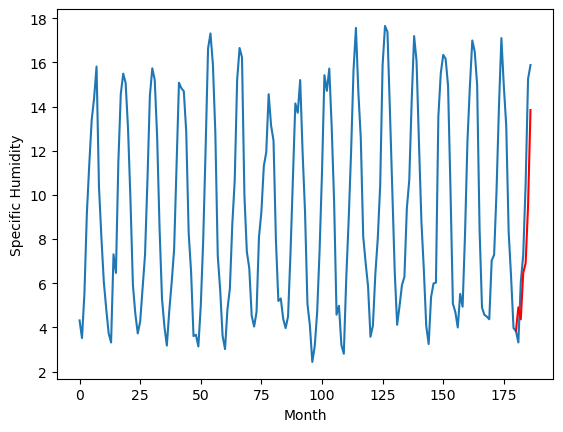

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.42		-0.06
3.67		3.88		0.21
6.28		5.97		-0.31
7.44		6.42		-1.02
11.66		9.01		-2.65
14.80		13.35		-1.45
[180, 181, 182, 183, 184, 185, 186]
[3.73, 4.420953280925751, 3.879819579124451, 5.971682019233704, 6.42278731584549, 9.007285006046295, 13.351755983829499]


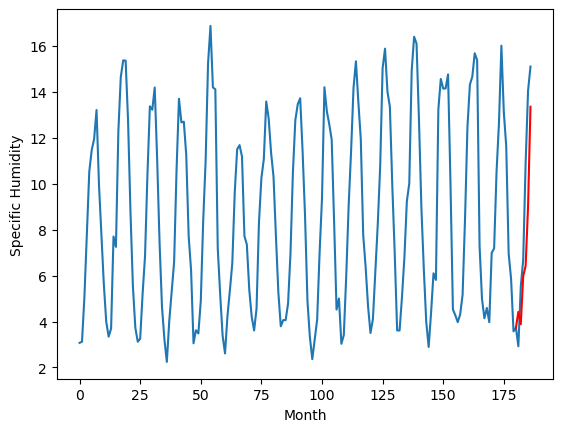

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.26		3.17		-0.09
2.52		2.63		0.11
4.34		4.72		0.38
4.51		5.17		0.66
9.66		7.76		-1.90
12.65		12.10		-0.55
[180, 181, 182, 183, 184, 185, 186]
[2.83, 3.1709532809257506, 2.6298195791244505, 4.721682019233704, 5.17278731584549, 7.7572850060462955, 12.101755983829499]


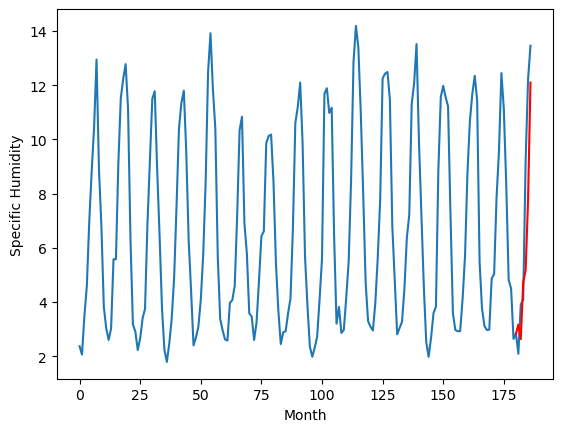

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.64		2.47		0.83
1.68		1.93		0.25
2.92		4.02		1.10
4.29		4.47		0.18
5.82		7.06		1.24
11.14		11.40		0.26
[180, 181, 182, 183, 184, 185, 186]
[2.69, 2.470953280925751, 1.9298195791244508, 4.021682019233704, 4.47278731584549, 7.057285006046295, 11.4017559838295]


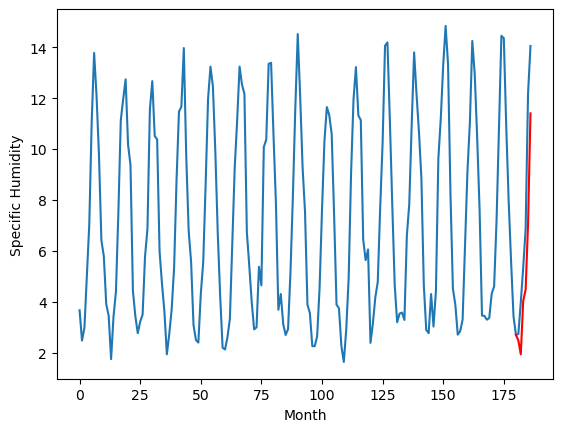

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.59   2.470953
1                 1    6.45   6.530953
2                 2    5.07   5.020953
3                 3    5.43   5.870953
4                 4    6.41   6.760953
5                 5    7.16   6.430953
6                 6    2.41   2.620953
7                 7    4.68   4.910953
8                 8    4.48   4.420953
9                 9    3.26   3.170953
10               10    1.64   2.470953


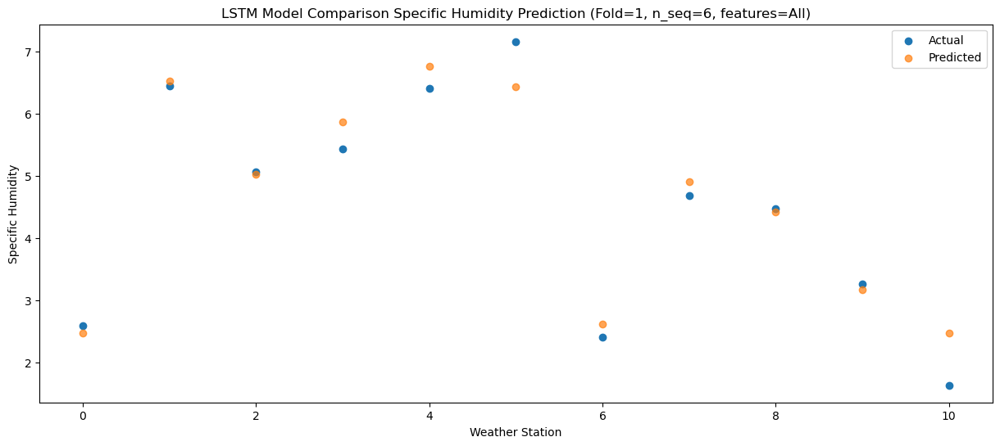

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.91    1.92982
1                 1    6.64    5.98982
2                 2    5.07    4.47982
3                 3    5.50    5.32982
4                 4    6.45    6.21982
5                 5    6.53    5.88982
6                 6    2.53    2.07982
7                 7    4.16    4.36982
8                 8    3.67    3.87982
9                 9    2.52    2.62982
10               10    1.68    1.92982


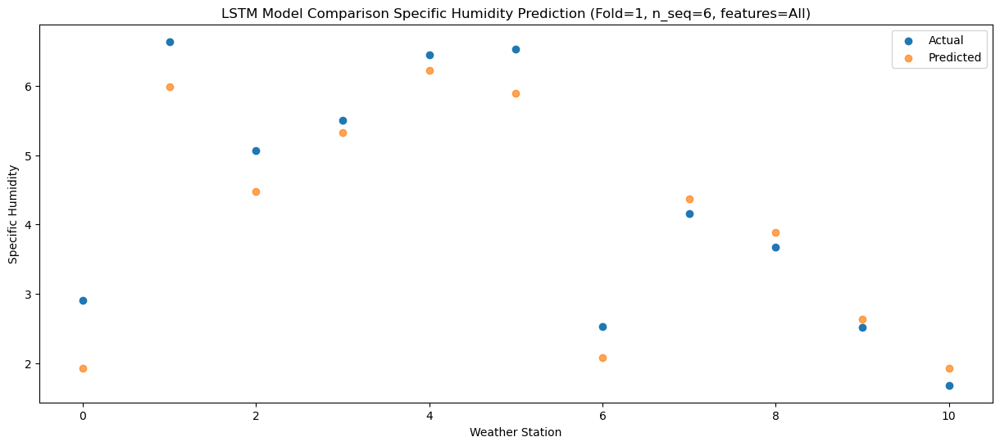

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    4.44   4.021682
1                 1    8.17   8.081682
2                 2    7.69   6.571682
3                 3    8.14   7.421682
4                 4    9.17   8.311682
5                 5    7.32   7.981682
6                 6    4.09   4.171682
7                 7    6.89   6.461682
8                 8    6.28   5.971682
9                 9    4.34   4.721682
10               10    2.92   4.021682


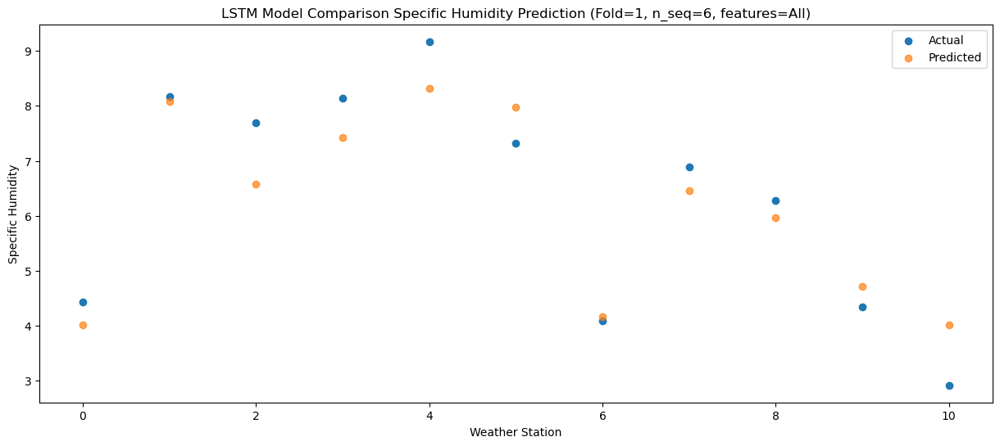

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    4.64   4.472787
1                 1    8.53   8.532787
2                 2    7.40   7.022787
3                 3    9.48   7.872787
4                 4   10.43   8.762787
5                 5    8.62   8.432787
6                 6    4.71   4.622787
7                 7    8.12   6.912787
8                 8    7.44   6.422787
9                 9    4.51   5.172787
10               10    4.29   4.472787


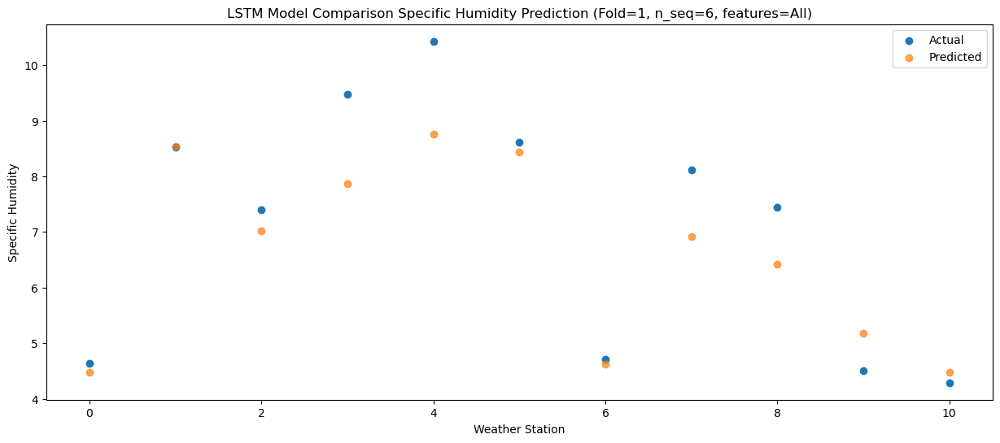

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    7.32   7.057285
1                 1   11.45  11.117285
2                 2   10.24   9.607285
3                 3   13.37  10.457285
4                 4   14.46  11.347285
5                 5   12.93  11.017285
6                 6    7.64   7.207285
7                 7   11.33   9.497285
8                 8   11.66   9.007285
9                 9    9.66   7.757285
10               10    5.82   7.057285


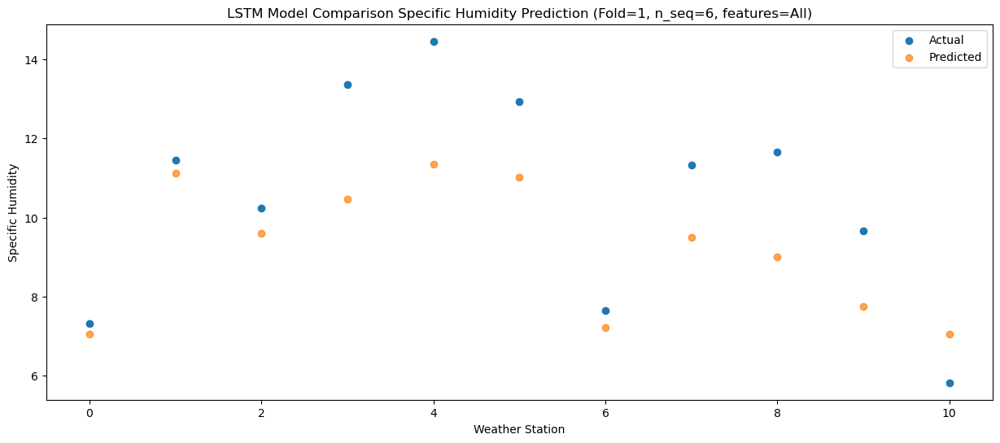

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   12.48  11.401756
1                 1   15.43  15.461756
2                 2   14.76  13.951756
3                 3   16.56  14.801756
4                 4   17.87  15.691756
5                 5   15.10  15.361756
6                 6   11.99  11.551756
7                 7   16.09  13.841756
8                 8   14.80  13.351756
9                 9   12.65  12.101756
10               10   11.14  11.401756


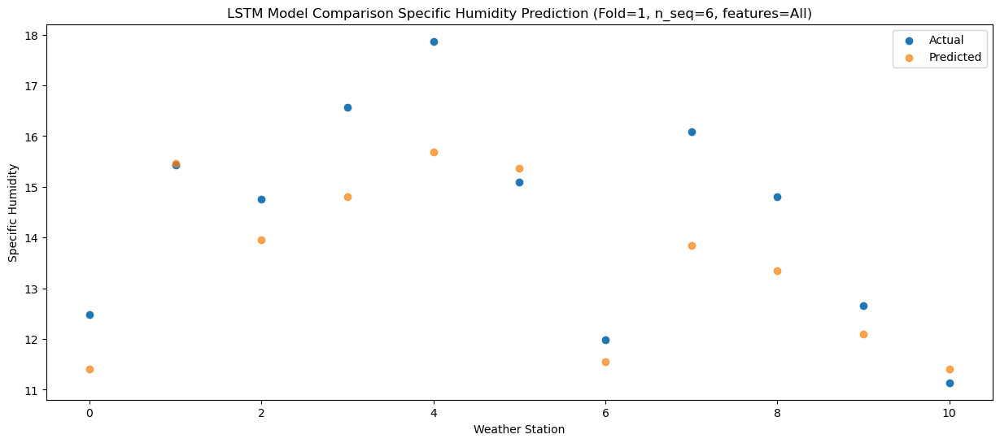

f, t:
[[ 2.59  6.45  5.07  5.43  6.41  7.16  2.41  4.68  4.48  3.26  1.64]
 [ 2.91  6.64  5.07  5.5   6.45  6.53  2.53  4.16  3.67  2.52  1.68]
 [ 4.44  8.17  7.69  8.14  9.17  7.32  4.09  6.89  6.28  4.34  2.92]
 [ 4.64  8.53  7.4   9.48 10.43  8.62  4.71  8.12  7.44  4.51  4.29]
 [ 7.32 11.45 10.24 13.37 14.46 12.93  7.64 11.33 11.66  9.66  5.82]
 [12.48 15.43 14.76 16.56 17.87 15.1  11.99 16.09 14.8  12.65 11.14]]
[[ 2.47095328  6.53095328  5.02095328  5.87095328  6.76095328  6.43095328
   2.62095328  4.91095328  4.42095328  3.17095328  2.47095328]
 [ 1.92981958  5.98981958  4.47981958  5.32981958  6.21981958  5.88981958
   2.07981958  4.36981958  3.87981958  2.62981958  1.92981958]
 [ 4.02168202  8.08168202  6.57168202  7.42168202  8.31168202  7.98168202
   4.17168202  6.46168202  5.97168202  4.72168202  4.02168202]
 [ 4.47278732  8.53278732  7.02278732  7.87278732  8.76278732  8.43278732
   4.62278732  6.91278732  6.42278732  5.17278732  4.47278732]
 [ 7.05728501 11.11728501  9.60

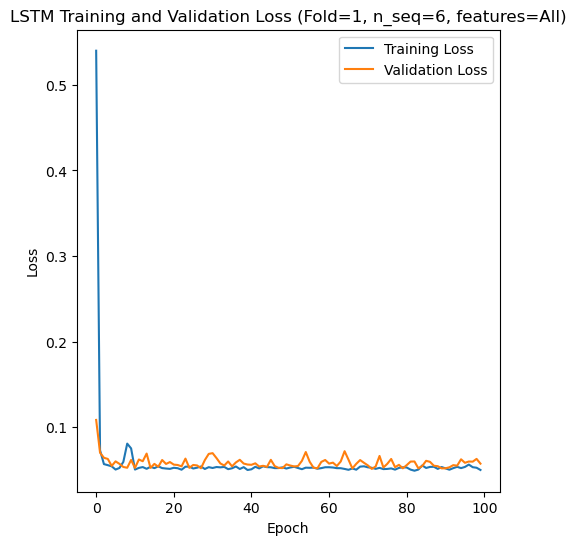

[[ 4.97  3.84  5.83 ... 12.86  8.48  8.25]
 [ 2.46  2.06  3.48 ...  9.57  6.71  5.1 ]
 [ 8.78  8.15  9.01 ... 20.36 15.38 12.95]
 ...
 [ 1.89  2.51  2.73 ...  7.42  4.53  3.35]
 [ 5.04  4.9   5.93 ... 10.09  8.19  4.88]
 [ 5.06  3.79  4.84 ... 13.58  8.96  7.8 ]]
Epoch 1/100
84/84 [==============================] - 36s 154ms/step - loss: 0.5796 - accuracy: 0.5595 - mae: 0.5258 - rmse: 0.5796 - mape: 90.4374 - pearson: 0.4886 - val_loss: 0.0591 - val_accuracy: 1.0000 - val_mae: 0.0434 - val_rmse: 0.0591 - val_mape: 6.5507 - val_pearson: 0.7547
Epoch 2/100
84/84 [==============================] - 7s 80ms/step - loss: 0.0797 - accuracy: 0.6548 - mae: 0.0653 - rmse: 0.0797 - mape: 10.9280 - pearson: 0.7116 - val_loss: 0.0499 - val_accuracy: 1.0000 - val_mae: 0.0382 - val_rmse: 0.0499 - val_mape: 5.9370 - val_pearson: 0.9052
Epoch 3/100
84/84 [==============================] - 6s 73ms/step - loss: 0.0552 - accuracy: 0.8095 - mae: 0.0449 - rmse: 0.0552 - mape: 7.5031 - pearson: 0.7983 - val_

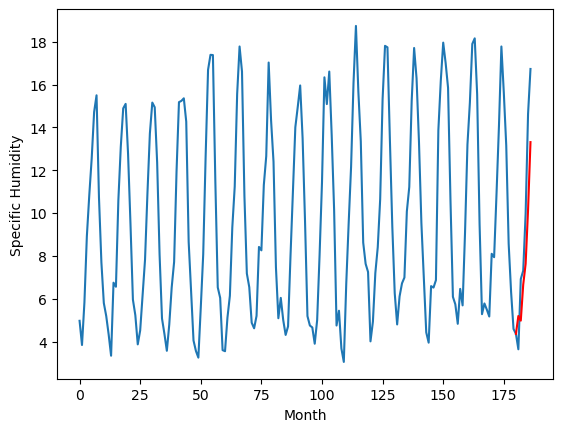

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		5.11		0.19
4.24		4.89		0.65
6.09		6.57		0.48
6.21		7.54		1.33
11.33		10.07		-1.26
14.24		13.22		-1.02
[180, 181, 182, 183, 184, 185, 186]
[2.82, 5.10554435968399, 4.886864097118377, 6.566083700656891, 7.54163655757904, 10.065084071159362, 13.224149079322814]


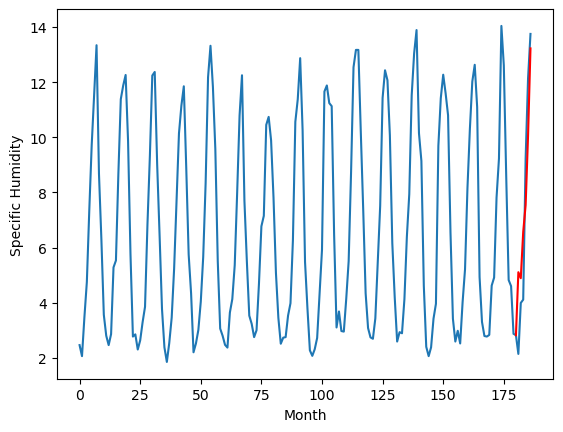

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.95		2.60		-0.35
5.08		2.38		-2.70
5.30		4.06		-1.24
6.27		5.03		-1.24
7.58		7.56		-0.02
11.36		10.71		-0.65
[180, 181, 182, 183, 184, 185, 186]
[9.16, 2.5955443596839904, 2.3768640971183777, 4.056083700656891, 5.0316365575790405, 7.555084071159363, 10.714149079322816]


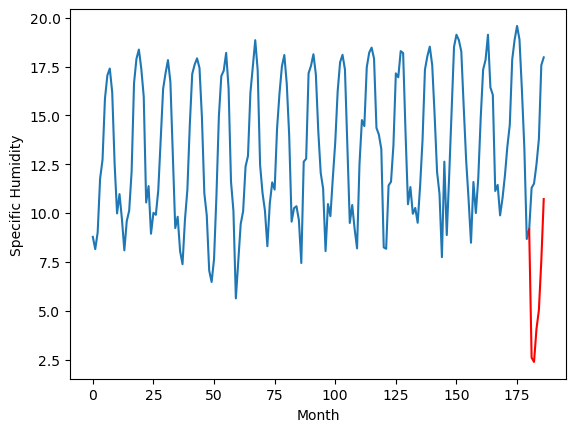

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.70		8.92		1.22
7.87		8.70		0.83
8.51		10.38		1.87
9.86		11.35		1.49
11.54		13.88		2.34
16.14		17.03		0.89
[180, 181, 182, 183, 184, 185, 186]
[2.44, 8.91554435968399, 8.696864097118377, 10.37608370065689, 11.35163655757904, 13.875084071159362, 17.034149079322816]


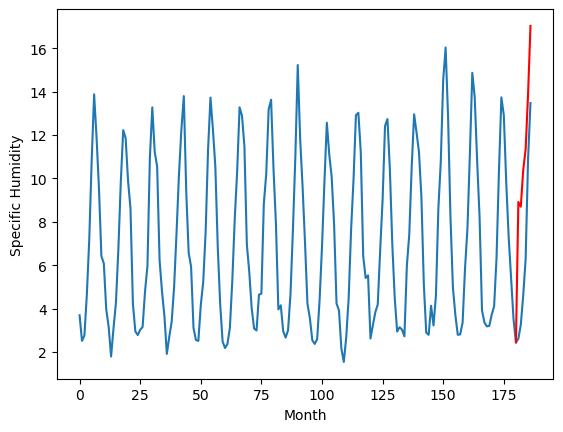

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.82		3.83		0.01
3.80		3.61		-0.19
7.09		5.29		-1.80
7.11		6.26		-0.85
10.31		8.79		-1.52
14.20		11.94		-2.26
[180, 181, 182, 183, 184, 185, 186]
[6.65, 3.8255443596839904, 3.6068640971183776, 5.28608370065689, 6.26163655757904, 8.785084071159362, 11.944149079322814]


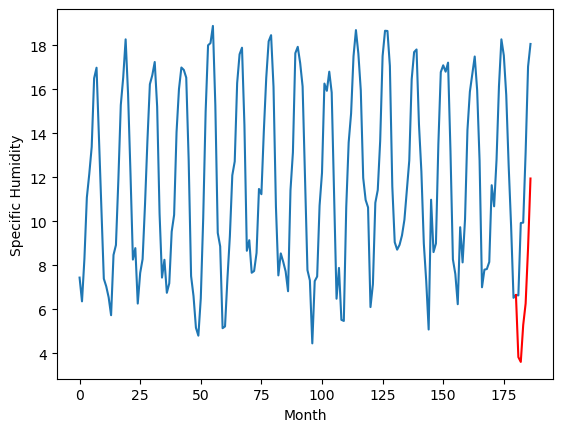

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.31		7.58		0.27
7.26		7.36		0.10
10.25		9.04		-1.21
11.82		10.01		-1.81
16.65		12.54		-4.11
19.29		15.69		-3.60
[180, 181, 182, 183, 184, 185, 186]
[6.19, 7.575544359683991, 7.356864097118378, 9.036083700656892, 10.011636557579042, 12.535084071159364, 15.694149079322816]


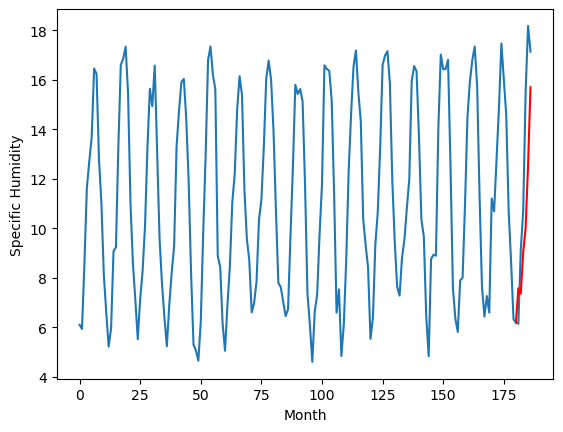

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.00		6.24		0.24
5.67		6.02		0.35
8.53		7.70		-0.83
9.85		8.67		-1.18
14.05		11.20		-2.85
17.80		14.35		-3.45
[180, 181, 182, 183, 184, 185, 186]
[4.78, 6.23554435968399, 6.016864097118377, 7.6960837006568905, 8.67163655757904, 11.195084071159362, 14.354149079322815]


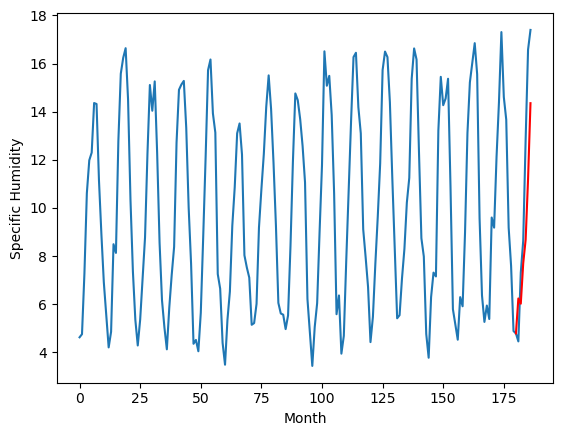

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.76		-0.14
4.77		4.54		-0.23
4.86		6.22		1.36
5.16		7.19		2.03
5.28		9.72		4.44
7.94		12.87		4.93
[180, 181, 182, 183, 184, 185, 186]
[2.61, 4.755544359683991, 4.536864097118378, 6.216083700656891, 7.191636557579041, 9.715084071159364, 12.874149079322816]


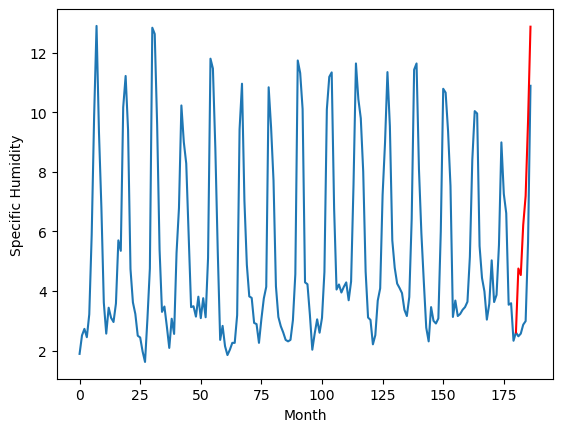

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.74		2.03		-0.71
3.27		1.81		-1.46
3.38		3.49		0.11
4.70		4.46		-0.24
6.18		6.99		0.81
7.43		10.14		2.71
[180, 181, 182, 183, 184, 185, 186]
[4.6, 2.02554435968399, 1.8068640971183774, 3.4860837006568905, 4.46163655757904, 6.9850840711593625, 10.144149079322816]


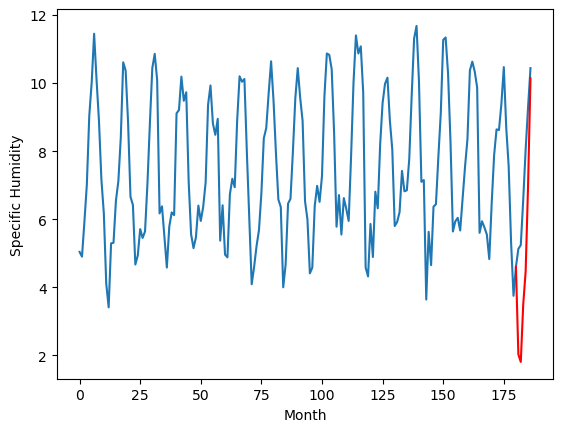

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.92		5.18		0.26
4.99		4.96		-0.03
6.72		6.64		-0.08
7.25		7.61		0.36
9.96		10.14		0.18
14.46		13.29		-1.17
[180, 181, 182, 183, 184, 185, 186]
[4.27, 5.1755443596839905, 4.956864097118378, 6.636083700656891, 7.611636557579041, 10.135084071159362, 13.294149079322814]


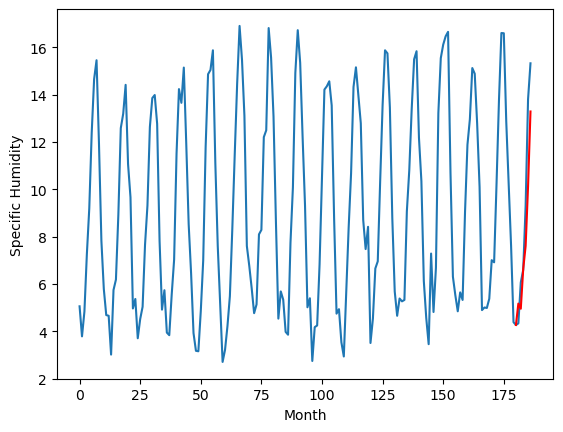

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.20		0.13
5.31		4.98		-0.33
6.34		6.66		0.32
6.95		7.63		0.68
9.62		10.16		0.54
13.72		13.31		-0.41
[180, 181, 182, 183, 184, 185, 186]
[3.91, 5.19554435968399, 4.976864097118377, 6.6560837006568905, 7.63163655757904, 10.155084071159362, 13.314149079322814]


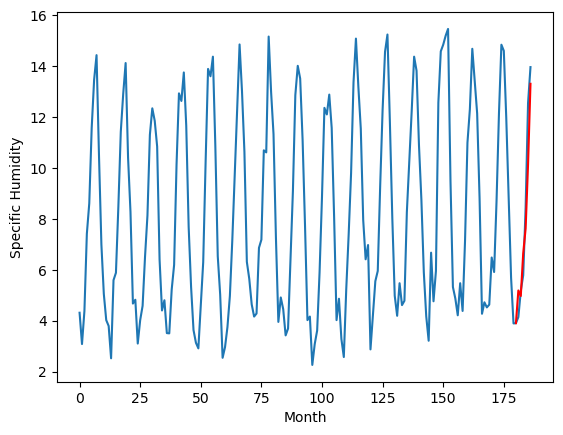

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.83   5.195544
1                 1    4.92   5.105544
2                 2    2.95   2.595544
3                 3    7.70   8.915544
4                 4    3.82   3.825544
5                 5    7.31   7.575544
6                 6    6.00   6.235544
7                 7    4.90   4.755544
8                 8    2.74   2.025544
9                 9    4.92   5.175544
10               10    5.07   5.195544


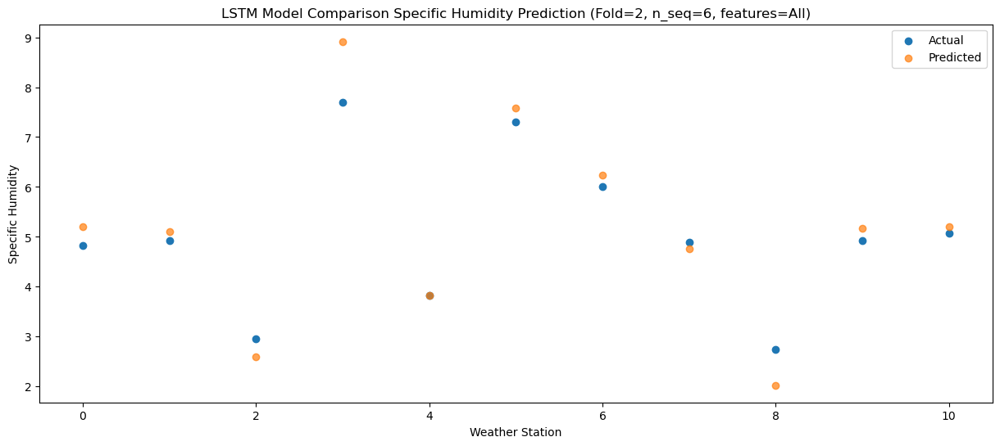

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.11   4.976864
1                 1    4.24   4.886864
2                 2    5.08   2.376864
3                 3    7.87   8.696864
4                 4    3.80   3.606864
5                 5    7.26   7.356864
6                 6    5.67   6.016864
7                 7    4.77   4.536864
8                 8    3.27   1.806864
9                 9    4.99   4.956864
10               10    5.31   4.976864


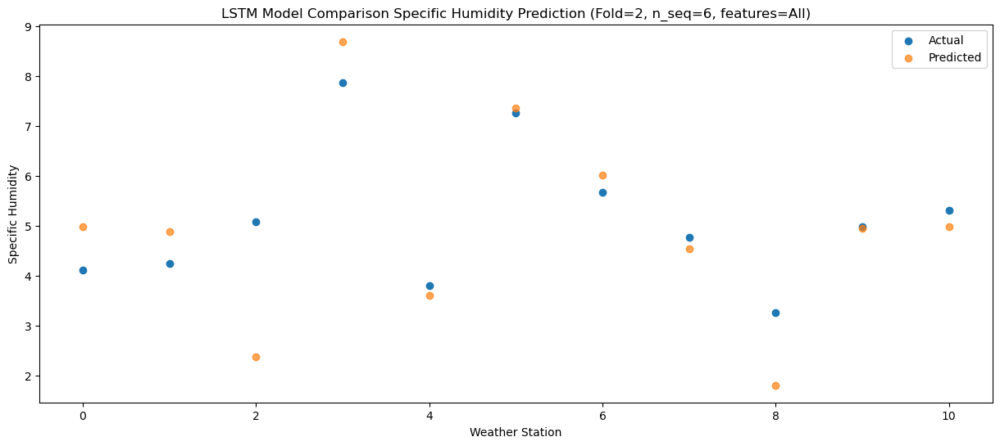

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.39   6.656084
1                 1    6.09   6.566084
2                 2    5.30   4.056084
3                 3    8.51  10.376084
4                 4    7.09   5.286084
5                 5   10.25   9.036084
6                 6    8.53   7.696084
7                 7    4.86   6.216084
8                 8    3.38   3.486084
9                 9    6.72   6.636084
10               10    6.34   6.656084


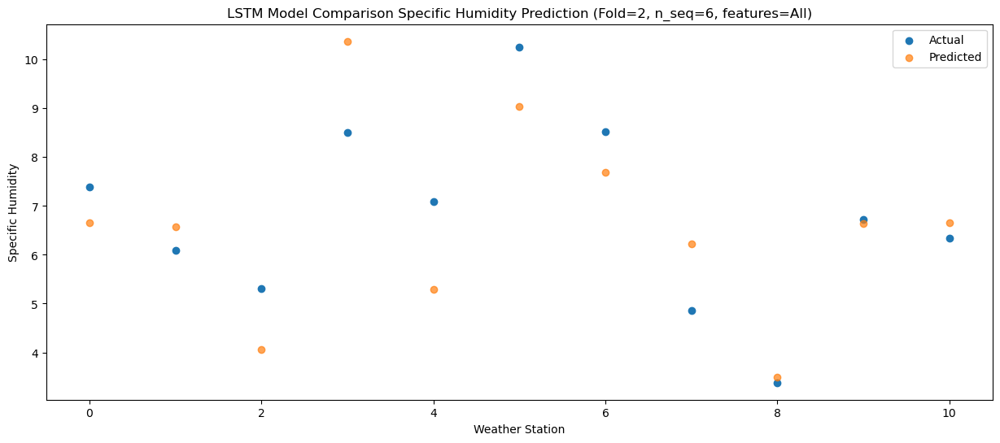

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.78   7.631637
1                 1    6.21   7.541637
2                 2    6.27   5.031637
3                 3    9.86  11.351637
4                 4    7.11   6.261637
5                 5   11.82  10.011637
6                 6    9.85   8.671637
7                 7    5.16   7.191637
8                 8    4.70   4.461637
9                 9    7.25   7.611637
10               10    6.95   7.631637


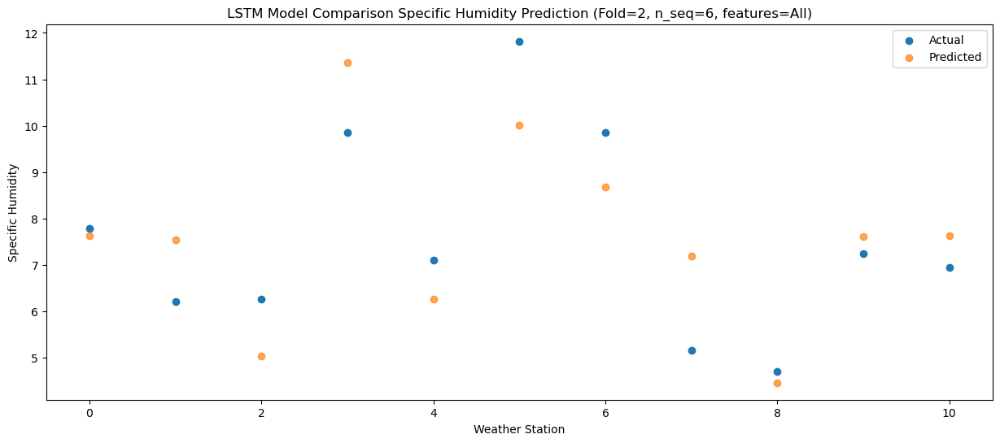

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.45  10.155084
1                 1   11.33  10.065084
2                 2    7.58   7.555084
3                 3   11.54  13.875084
4                 4   10.31   8.785084
5                 5   16.65  12.535084
6                 6   14.05  11.195084
7                 7    5.28   9.715084
8                 8    6.18   6.985084
9                 9    9.96  10.135084
10               10    9.62  10.155084


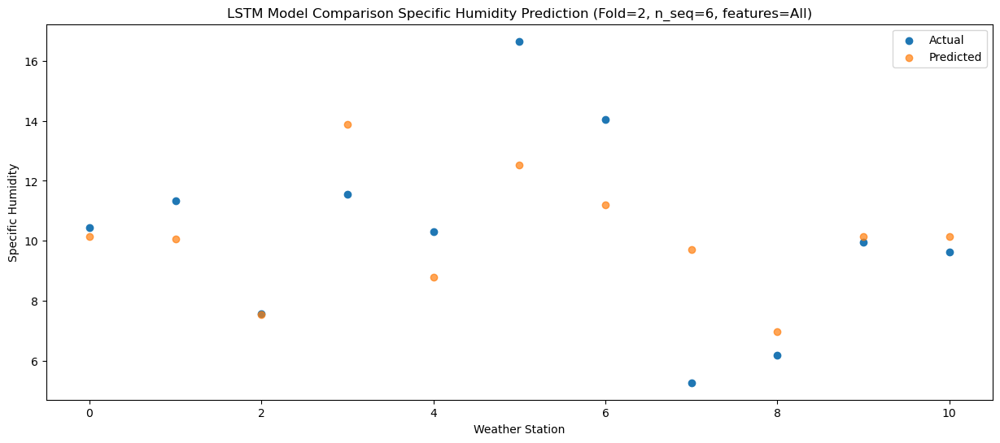

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.10  13.314149
1                 1   14.24  13.224149
2                 2   11.36  10.714149
3                 3   16.14  17.034149
4                 4   14.20  11.944149
5                 5   19.29  15.694149
6                 6   17.80  14.354149
7                 7    7.94  12.874149
8                 8    7.43  10.144149
9                 9   14.46  13.294149
10               10   13.72  13.314149


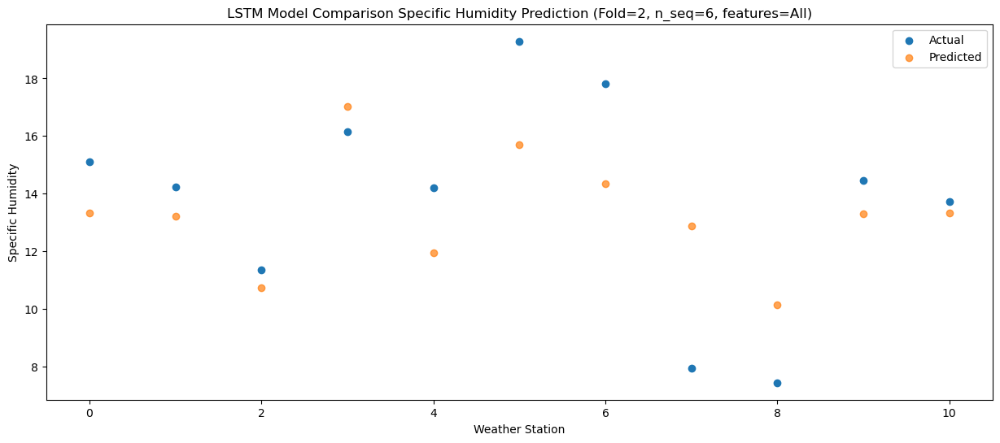

f, t:
[[ 4.83  4.92  2.95  7.7   3.82  7.31  6.    4.9   2.74  4.92  5.07]
 [ 4.11  4.24  5.08  7.87  3.8   7.26  5.67  4.77  3.27  4.99  5.31]
 [ 7.39  6.09  5.3   8.51  7.09 10.25  8.53  4.86  3.38  6.72  6.34]
 [ 7.78  6.21  6.27  9.86  7.11 11.82  9.85  5.16  4.7   7.25  6.95]
 [10.45 11.33  7.58 11.54 10.31 16.65 14.05  5.28  6.18  9.96  9.62]
 [15.1  14.24 11.36 16.14 14.2  19.29 17.8   7.94  7.43 14.46 13.72]]
[[ 5.19554436  5.10554436  2.59554436  8.91554436  3.82554436  7.57554436
   6.23554436  4.75554436  2.02554436  5.17554436  5.19554436]
 [ 4.9768641   4.8868641   2.3768641   8.6968641   3.6068641   7.3568641
   6.0168641   4.5368641   1.8068641   4.9568641   4.9768641 ]
 [ 6.6560837   6.5660837   4.0560837  10.3760837   5.2860837   9.0360837
   7.6960837   6.2160837   3.4860837   6.6360837   6.6560837 ]
 [ 7.63163656  7.54163656  5.03163656 11.35163656  6.26163656 10.01163656
   8.67163656  7.19163656  4.46163656  7.61163656  7.63163656]
 [10.15508407 10.06508407  7.5550

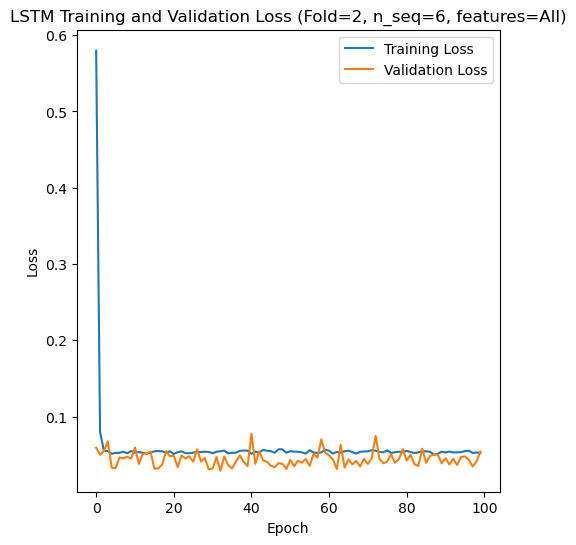

[[ 5.11  3.7   4.74 ... 13.5   8.68  7.66]
 [ 3.73  2.91  5.05 ... 11.19  6.96  6.57]
 [ 5.56  5.41  5.55 ...  8.56  7.45  5.59]
 ...
 [ 2.73  2.21  3.23 ...  5.    3.95  3.09]
 [ 5.93  5.59  5.49 ...  8.63  7.04  6.11]
 [ 3.71  2.55  2.84 ...  9.78  6.68  4.77]]
Epoch 1/100
84/84 [==============================] - 34s 155ms/step - loss: 0.6454 - accuracy: 0.4643 - mae: 0.5799 - rmse: 0.6454 - mape: 99.4035 - pearson: 0.4342 - val_loss: 0.1011 - val_accuracy: 0.9000 - val_mae: 0.0848 - val_rmse: 0.1011 - val_mape: 14.9105 - val_pearson: 0.5563
Epoch 2/100
84/84 [==============================] - 6s 72ms/step - loss: 0.0681 - accuracy: 0.7500 - mae: 0.0567 - rmse: 0.0681 - mape: 9.5592 - pearson: 0.7413 - val_loss: 0.0495 - val_accuracy: 0.9000 - val_mae: 0.0402 - val_rmse: 0.0495 - val_mape: 6.9616 - val_pearson: 0.7967
Epoch 3/100
84/84 [==============================] - 6s 77ms/step - loss: 0.0562 - accuracy: 0.7381 - mae: 0.0456 - rmse: 0.0562 - mape: 7.5894 - pearson: 0.7841 - val_

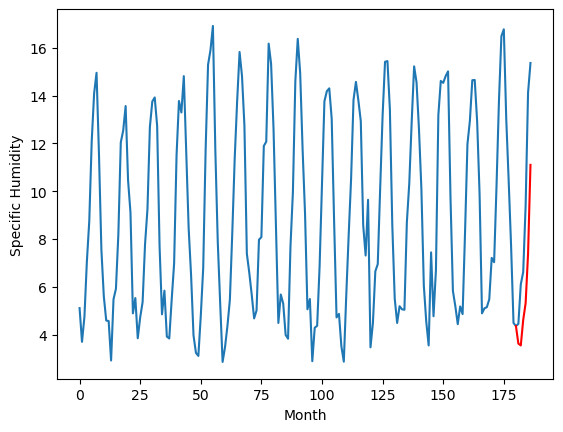

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.02		5.03		0.01
4.46		4.95		0.49
6.97		6.02		-0.95
8.14		6.72		-1.42
11.66		8.78		-2.88
16.19		12.50		-3.69
[180, 181, 182, 183, 184, 185, 186]
[3.43, 5.025619663894177, 4.948795252144337, 6.01676111727953, 6.721482746899128, 8.779548161327838, 12.50038337022066]


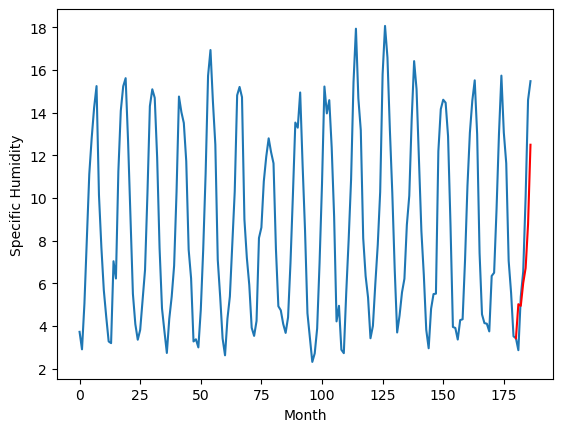

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.17		3.65		-0.52
4.11		3.57		-0.54
4.19		4.64		0.45
4.81		5.34		0.53
5.21		7.40		2.19
7.66		11.12		3.46
[180, 181, 182, 183, 184, 185, 186]
[5.43, 3.6456196638941765, 3.5687952521443367, 4.63676111727953, 5.341482746899128, 7.399548161327839, 11.120383370220662]


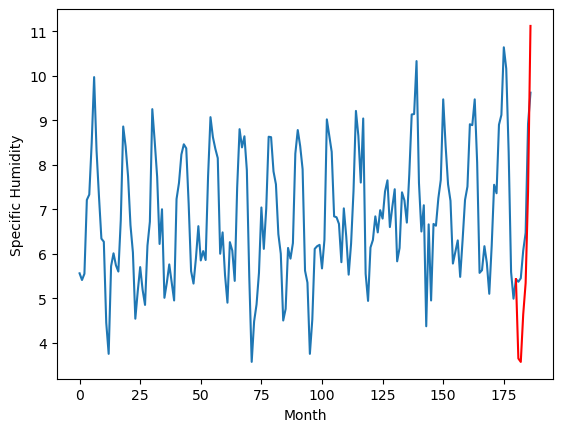

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.29		5.48		0.19
5.22		5.40		0.18
6.52		6.47		-0.05
7.71		7.17		-0.54
10.24		9.23		-1.01
15.66		12.95		-2.71
[180, 181, 182, 183, 184, 185, 186]
[3.21, 5.475619663894176, 5.398795252144336, 6.466761117279529, 7.171482746899128, 9.229548161327838, 12.95038337022066]


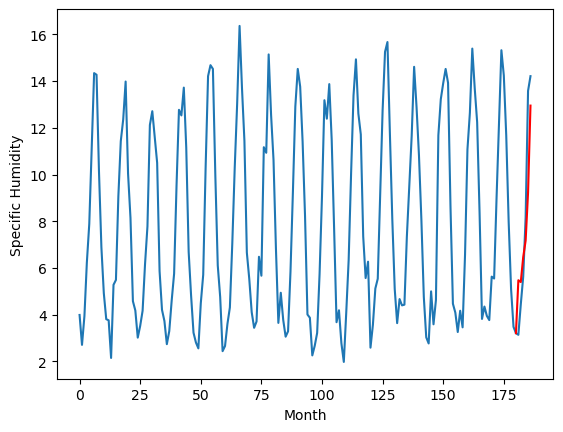

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.79		3.91		0.12
2.96		3.83		0.87
5.44		4.90		-0.54
6.50		5.60		-0.90
8.92		7.66		-1.26
13.38		11.38		-2.00
[180, 181, 182, 183, 184, 185, 186]
[3.04, 3.9056196638941767, 3.828795252144337, 4.89676111727953, 5.601482746899128, 7.659548161327839, 11.380383370220661]


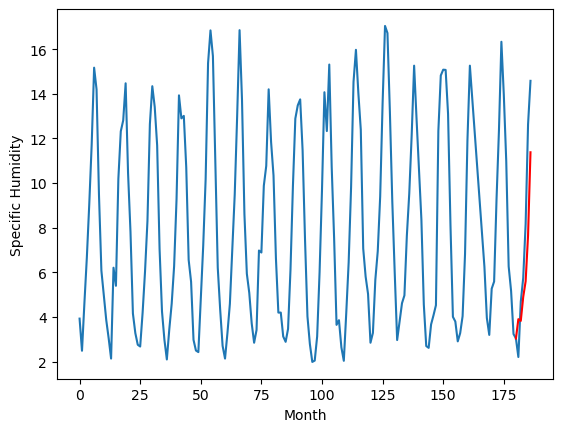

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.62		3.85		0.23
3.10		3.77		0.67
5.13		4.84		-0.29
6.43		5.54		-0.89
8.67		7.60		-1.07
13.89		11.32		-2.57
[180, 181, 182, 183, 184, 185, 186]
[2.91, 3.8456196638941766, 3.768795252144337, 4.836761117279529, 5.541482746899128, 7.599548161327839, 11.32038337022066]


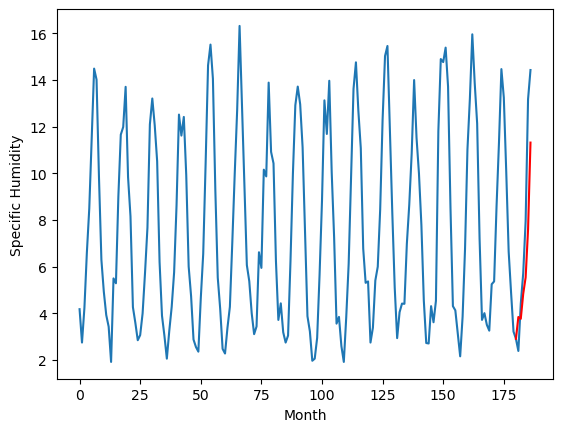

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		4.10		-0.25
4.41		4.02		-0.39
4.72		5.09		0.37
5.19		5.79		0.60
6.59		7.85		1.26
7.92		11.57		3.65
[180, 181, 182, 183, 184, 185, 186]
[1.6, 4.095619663894176, 4.018795252144336, 5.086761117279529, 5.791482746899128, 7.849548161327839, 11.57038337022066]


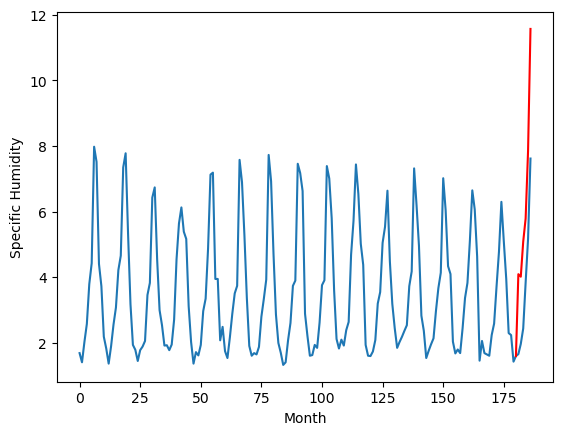

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.50		1.61		-0.89
2.02		1.53		-0.49
2.32		2.60		0.28
2.01		3.30		1.29
2.57		5.36		2.79
3.99		9.08		5.09
[180, 181, 182, 183, 184, 185, 186]
[2.86, 1.6056196638941764, 1.5287952521443366, 2.5967611172795295, 3.301482746899128, 5.359548161327838, 9.08038337022066]


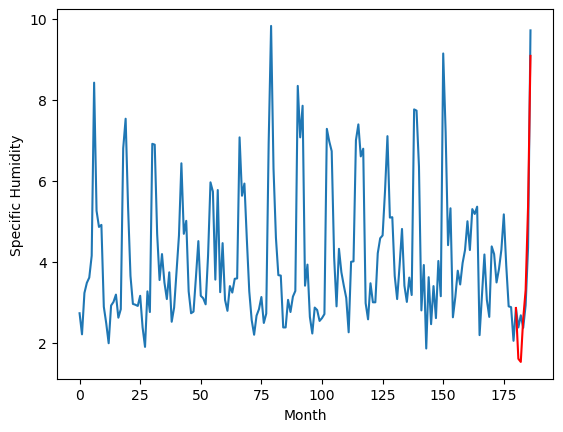

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.40		2.65		-0.75
3.05		2.57		-0.48
2.70		3.64		0.94
3.63		4.34		0.71
4.07		6.40		2.33
5.50		10.12		4.62
[180, 181, 182, 183, 184, 185, 186]
[5.65, 2.6456196638941765, 2.5687952521443367, 3.6367611172795296, 4.341482746899128, 6.399548161327839, 10.120383370220662]


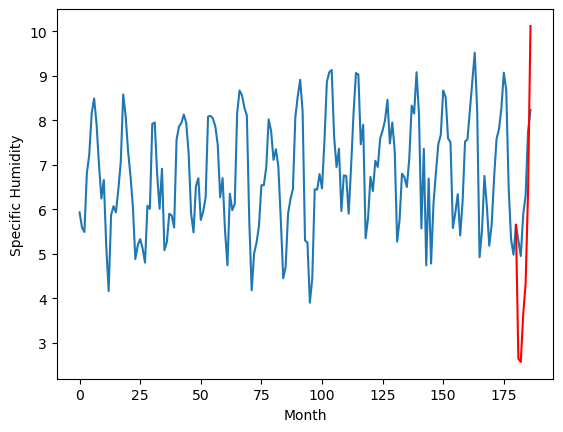

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		5.85		1.01
4.99		5.77		0.78
5.77		6.84		1.07
7.15		7.54		0.39
8.72		9.60		0.88
13.62		13.32		-0.30
[180, 181, 182, 183, 184, 185, 186]
[2.54, 5.845619663894176, 5.768795252144336, 6.836761117279529, 7.541482746899128, 9.599548161327839, 13.32038337022066]


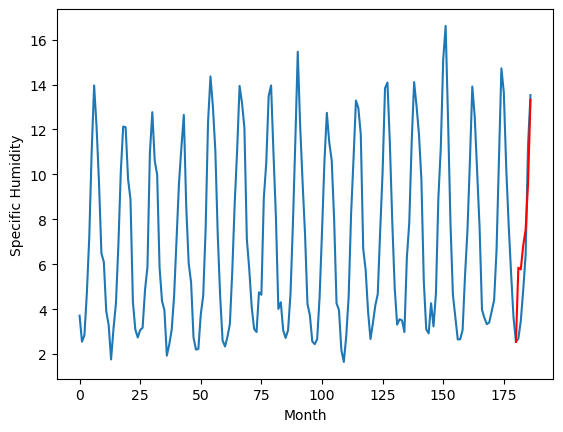

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.02		3.63		0.61
2.88		3.55		0.67
4.16		4.62		0.46
5.57		5.32		-0.25
7.16		7.38		0.22
12.03		11.10		-0.93
[180, 181, 182, 183, 184, 185, 186]
[2.51, 3.6256196638941764, 3.5487952521443367, 4.6167611172795295, 5.321482746899128, 7.379548161327839, 11.100383370220662]


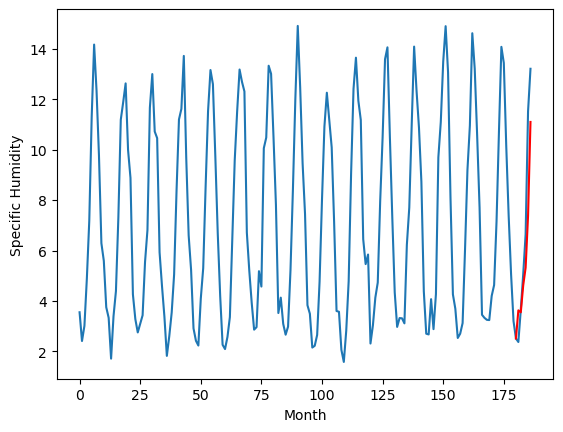

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.58    3.62562
1                 1    5.02    5.02562
2                 2    4.17    3.64562
3                 3    5.29    5.47562
4                 4    3.79    3.90562
5                 5    3.62    3.84562
6                 6    4.35    4.09562
7                 7    2.50    1.60562
8                 8    3.40    2.64562
9                 9    4.84    5.84562
10               10    3.02    3.62562


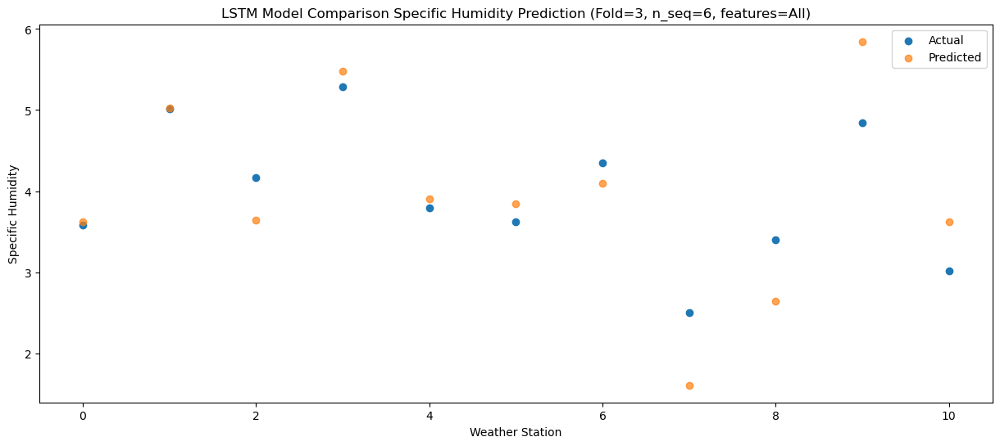

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   3.548795
1                 1    4.46   4.948795
2                 2    4.11   3.568795
3                 3    5.22   5.398795
4                 4    2.96   3.828795
5                 5    3.10   3.768795
6                 6    4.41   4.018795
7                 7    2.02   1.528795
8                 8    3.05   2.568795
9                 9    4.99   5.768795
10               10    2.88   3.548795


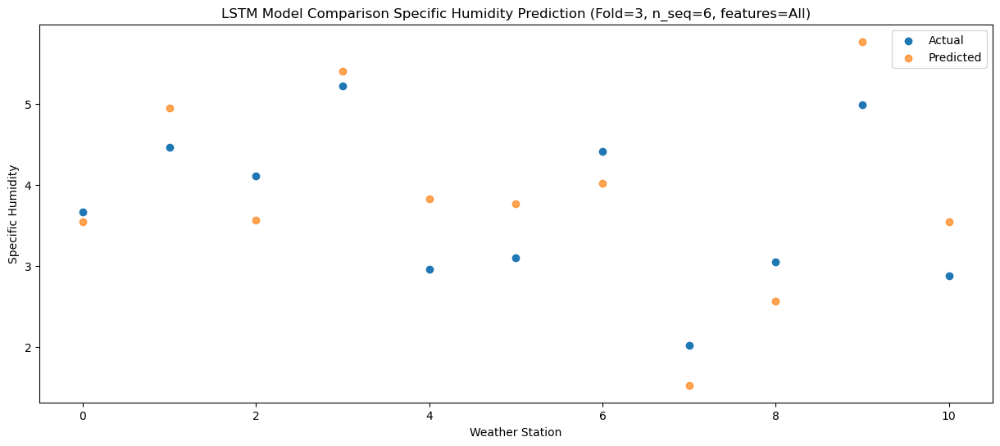

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.32   4.616761
1                 1    6.97   6.016761
2                 2    4.19   4.636761
3                 3    6.52   6.466761
4                 4    5.44   4.896761
5                 5    5.13   4.836761
6                 6    4.72   5.086761
7                 7    2.32   2.596761
8                 8    2.70   3.636761
9                 9    5.77   6.836761
10               10    4.16   4.616761


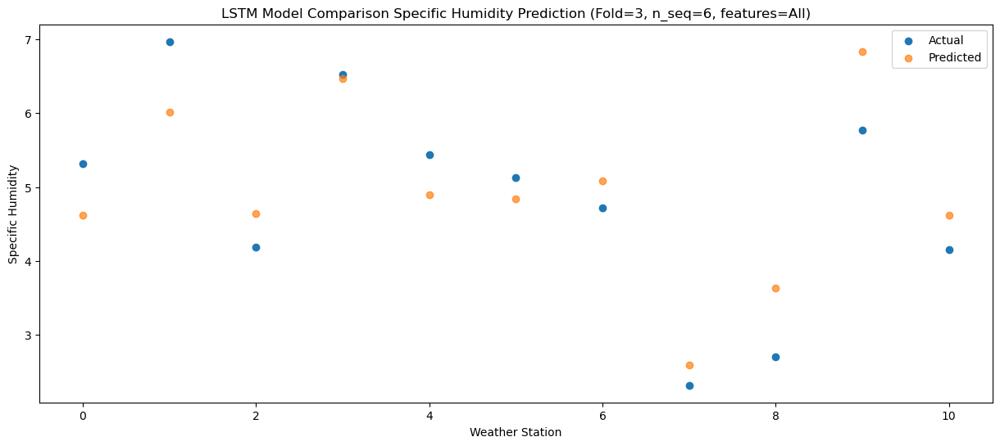

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    5.84   5.321483
1                 1    8.14   6.721483
2                 2    4.81   5.341483
3                 3    7.71   7.171483
4                 4    6.50   5.601483
5                 5    6.43   5.541483
6                 6    5.19   5.791483
7                 7    2.01   3.301483
8                 8    3.63   4.341483
9                 9    7.15   7.541483
10               10    5.57   5.321483


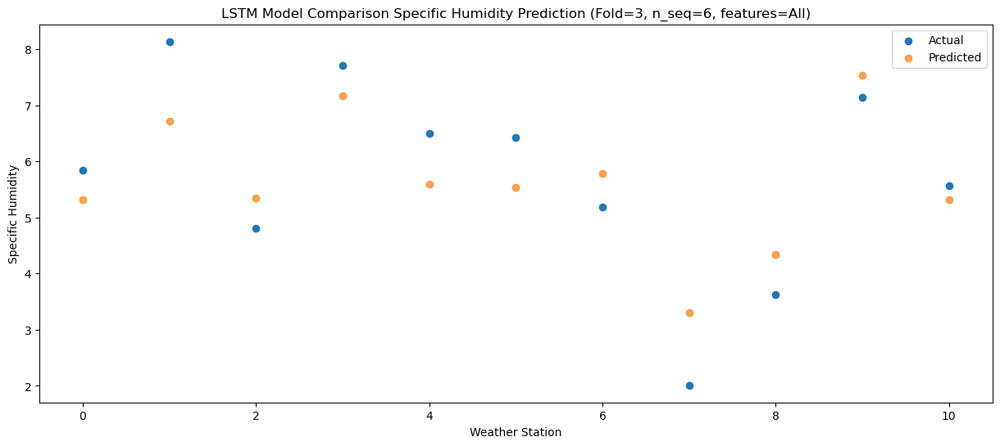

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    8.62   7.379548
1                 1   11.66   8.779548
2                 2    5.21   7.399548
3                 3   10.24   9.229548
4                 4    8.92   7.659548
5                 5    8.67   7.599548
6                 6    6.59   7.849548
7                 7    2.57   5.359548
8                 8    4.07   6.399548
9                 9    8.72   9.599548
10               10    7.16   7.379548


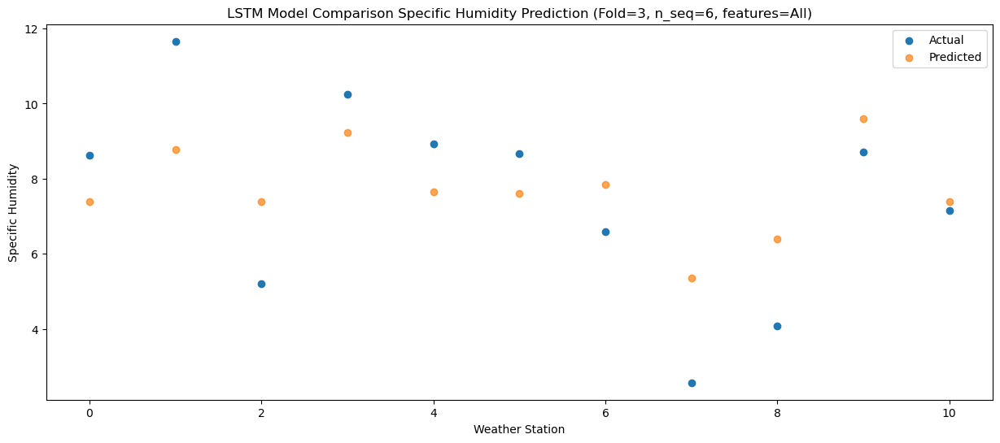

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   13.34  11.100383
1                 1   16.19  12.500383
2                 2    7.66  11.120383
3                 3   15.66  12.950383
4                 4   13.38  11.380383
5                 5   13.89  11.320383
6                 6    7.92  11.570383
7                 7    3.99   9.080383
8                 8    5.50  10.120383
9                 9   13.62  13.320383
10               10   12.03  11.100383


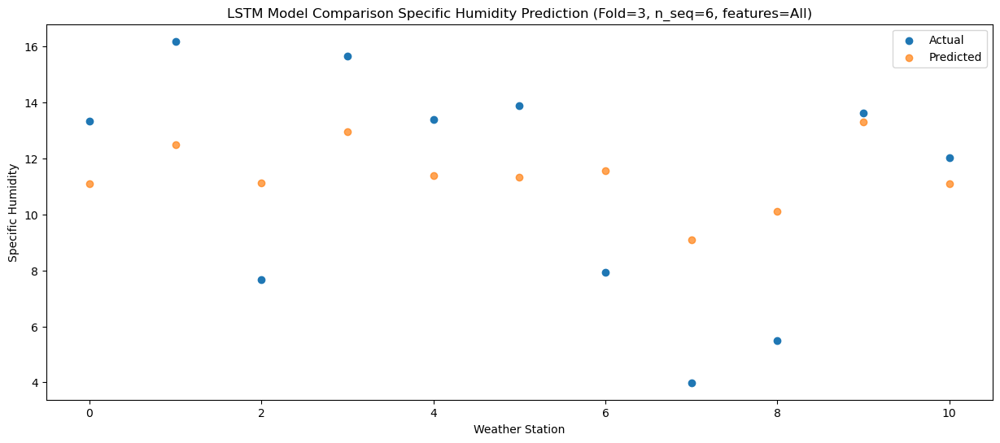

f, t:
[[ 3.58  5.02  4.17  5.29  3.79  3.62  4.35  2.5   3.4   4.84  3.02]
 [ 3.67  4.46  4.11  5.22  2.96  3.1   4.41  2.02  3.05  4.99  2.88]
 [ 5.32  6.97  4.19  6.52  5.44  5.13  4.72  2.32  2.7   5.77  4.16]
 [ 5.84  8.14  4.81  7.71  6.5   6.43  5.19  2.01  3.63  7.15  5.57]
 [ 8.62 11.66  5.21 10.24  8.92  8.67  6.59  2.57  4.07  8.72  7.16]
 [13.34 16.19  7.66 15.66 13.38 13.89  7.92  3.99  5.5  13.62 12.03]]
[[ 3.62561966  5.02561966  3.64561966  5.47561966  3.90561966  3.84561966
   4.09561966  1.60561966  2.64561966  5.84561966  3.62561966]
 [ 3.54879525  4.94879525  3.56879525  5.39879525  3.82879525  3.76879525
   4.01879525  1.52879525  2.56879525  5.76879525  3.54879525]
 [ 4.61676112  6.01676112  4.63676112  6.46676112  4.89676112  4.83676112
   5.08676112  2.59676112  3.63676112  6.83676112  4.61676112]
 [ 5.32148275  6.72148275  5.34148275  7.17148275  5.60148275  5.54148275
   5.79148275  3.30148275  4.34148275  7.54148275  5.32148275]
 [ 7.37954816  8.77954816  7.39

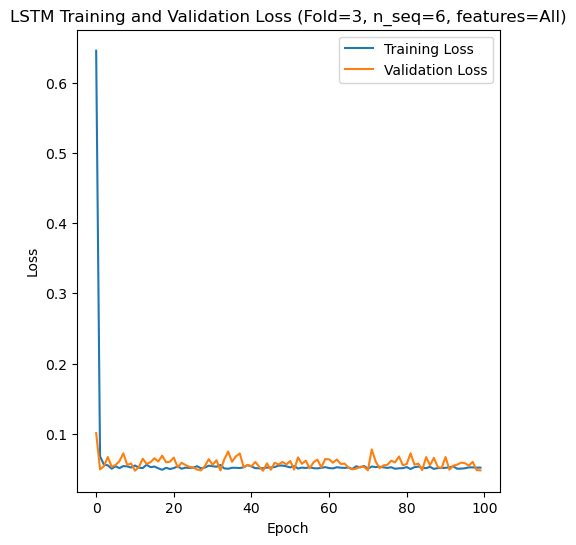

[[ 3.4   2.19  4.28 ... 10.54  6.41  5.39]
 [ 7.94  7.22  7.86 ... 18.27 13.85 11.85]
 [ 5.92  4.91  6.84 ... 14.38  9.59 10.48]
 ...
 [ 3.92  3.    4.93 ... 11.51  7.19  6.46]
 [ 3.98  2.61  4.   ... 10.23  6.65  5.8 ]
 [ 3.84  2.35  4.25 ... 10.6   6.5   5.9 ]]
Epoch 1/100
84/84 [==============================] - 36s 155ms/step - loss: 0.7443 - accuracy: 0.4286 - mae: 0.6764 - rmse: 0.7443 - mape: 116.6754 - pearson: 0.4296 - val_loss: 0.1056 - val_accuracy: 1.0000 - val_mae: 0.0769 - val_rmse: 0.1056 - val_mape: 12.8605 - val_pearson: 0.7063
Epoch 2/100
84/84 [==============================] - 6s 76ms/step - loss: 0.0730 - accuracy: 0.7381 - mae: 0.0590 - rmse: 0.0730 - mape: 9.8184 - pearson: 0.7324 - val_loss: 0.0471 - val_accuracy: 1.0000 - val_mae: 0.0382 - val_rmse: 0.0471 - val_mape: 6.5017 - val_pearson: 0.8696
Epoch 3/100
84/84 [==============================] - 7s 83ms/step - loss: 0.0595 - accuracy: 0.7857 - mae: 0.0490 - rmse: 0.0595 - mape: 8.3309 - pearson: 0.7764 - val

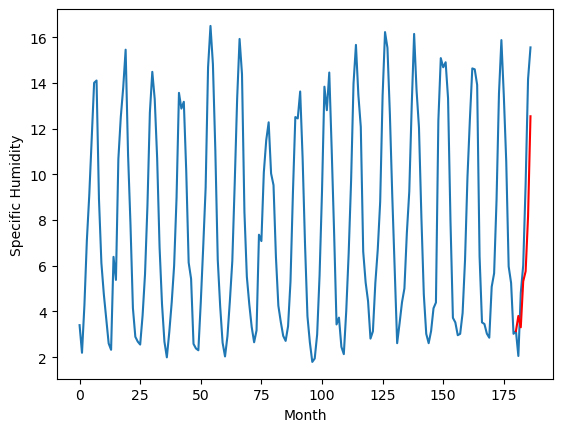

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.75		3.36		-0.39
5.74		2.87		-2.87
5.71		4.88		-0.83
6.46		5.32		-1.14
7.79		7.72		-0.07
12.08		12.11		0.03
[180, 181, 182, 183, 184, 185, 186]
[7.79, 3.363740535080433, 2.8662573114037513, 4.875295998156071, 5.318247409164906, 7.722562880814076, 12.105171771347523]


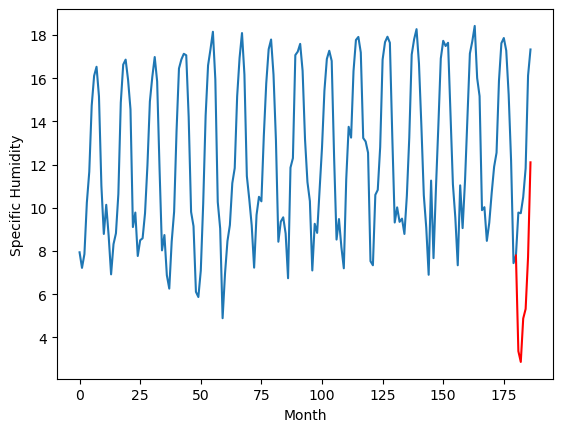

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.83		7.90		0.07
7.71		7.41		-0.30
10.77		9.42		-1.35
11.02		9.86		-1.16
14.46		12.26		-2.20
18.70		16.65		-2.05
[180, 181, 182, 183, 184, 185, 186]
[5.03, 7.903740535080433, 7.406257311403752, 9.415295998156072, 9.858247409164907, 12.262562880814077, 16.645171771347524]


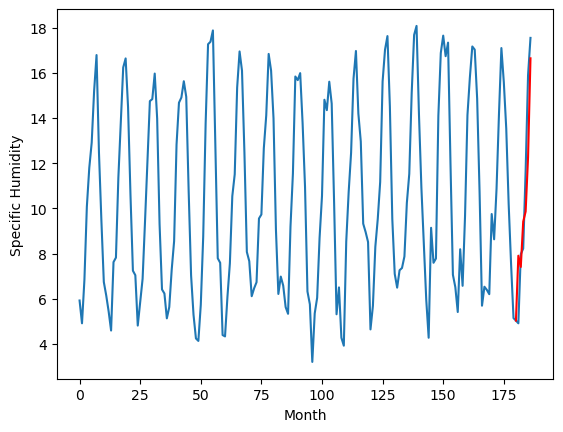

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.81		5.88		0.07
5.49		5.39		-0.10
8.15		7.40		-0.75
9.44		7.84		-1.60
13.44		10.24		-3.20
17.13		14.63		-2.50
[180, 181, 182, 183, 184, 185, 186]
[4.41, 5.883740535080433, 5.386257311403751, 7.395295998156071, 7.8382474091649055, 10.242562880814075, 14.625171771347523]


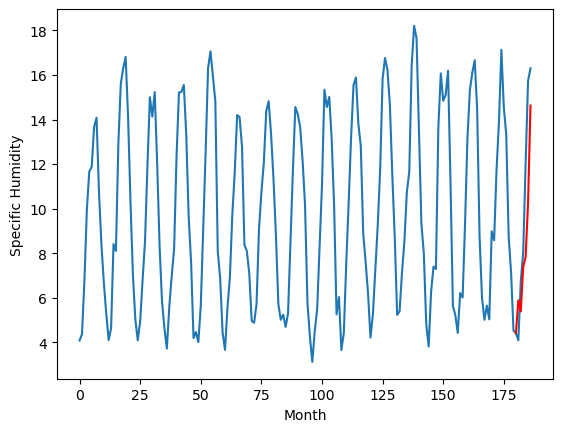

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.04		4.04		0.00
3.59		3.55		-0.04
6.17		5.56		-0.61
7.53		6.00		-1.53
11.82		8.40		-3.42
15.70		12.79		-2.91
[180, 181, 182, 183, 184, 185, 186]
[4.29, 4.043740535080433, 3.5462573114037514, 5.555295998156071, 5.998247409164906, 8.402562880814076, 12.785171771347523]


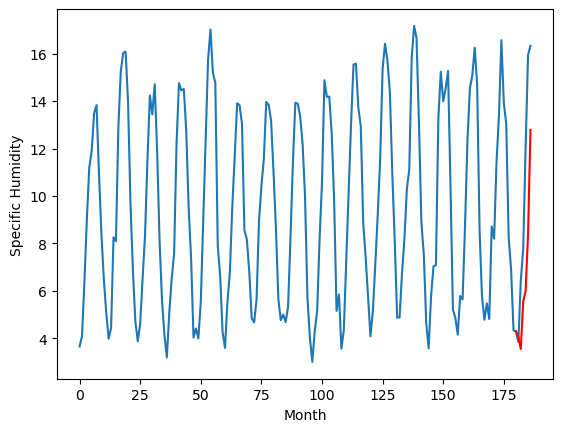

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.35		3.61		-0.74
3.71		3.12		-0.59
5.20		5.13		-0.07
6.16		5.57		-0.59
10.71		7.97		-2.74
13.01		12.36		-0.65
[180, 181, 182, 183, 184, 185, 186]
[3.47, 3.613740535080433, 3.1162573114037513, 5.125295998156071, 5.568247409164906, 7.972562880814076, 12.355171771347523]


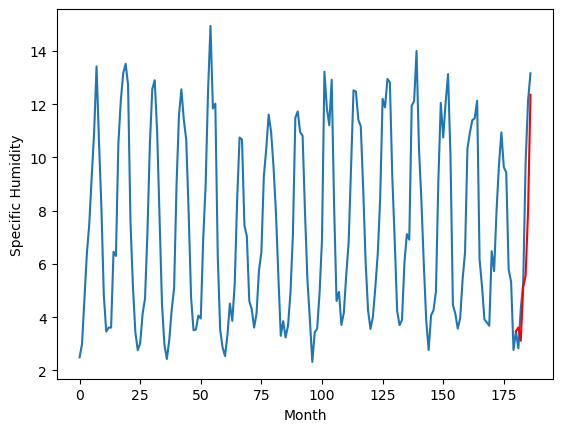

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.37		2.45		0.08
2.62		1.96		-0.66
4.33		3.97		-0.36
4.74		4.41		-0.33
7.72		6.81		-0.91
12.41		11.20		-1.21
[180, 181, 182, 183, 184, 185, 186]
[4.52, 2.453740535080433, 1.9562573114037516, 3.965295998156071, 4.408247409164906, 6.812562880814076, 11.195171771347523]


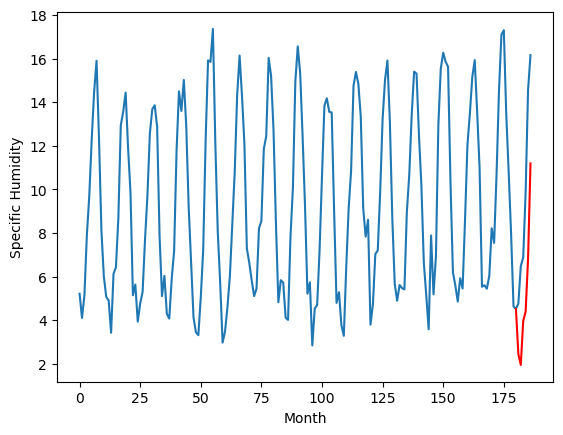

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.07		5.18		0.11
4.44		4.69		0.25
6.81		6.70		-0.11
7.73		7.14		-0.59
10.89		9.54		-1.35
15.49		13.93		-1.56
[180, 181, 182, 183, 184, 185, 186]
[3.4, 5.183740535080433, 4.686257311403751, 6.6952959981560705, 7.138247409164905, 9.542562880814074, 13.925171771347522]


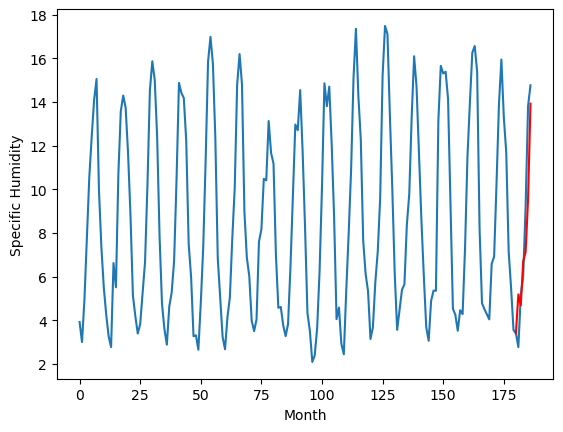

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.57		3.88		0.31
3.00		3.39		0.39
4.94		5.40		0.46
6.27		5.84		-0.43
8.56		8.24		-0.32
13.62		12.63		-0.99
[180, 181, 182, 183, 184, 185, 186]
[2.82, 3.883740535080433, 3.3862573114037513, 5.395295998156071, 5.8382474091649055, 8.242562880814075, 12.625171771347523]


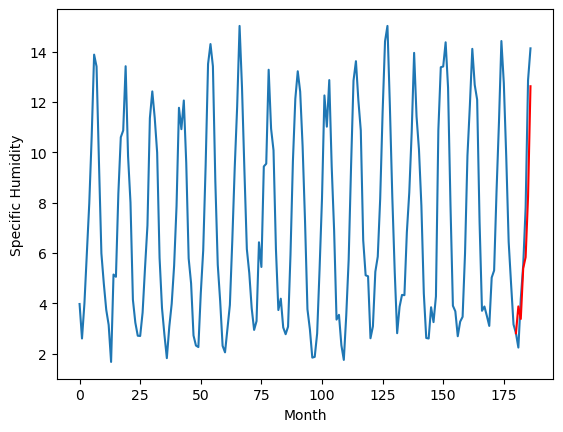

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.66		3.94		0.28
3.02		3.45		0.43
5.39		5.46		0.07
6.70		5.90		-0.80
9.32		8.30		-1.02
14.07		12.69		-1.38
[180, 181, 182, 183, 184, 185, 186]
[2.86, 3.943740535080433, 3.4462573114037514, 5.455295998156071, 5.898247409164906, 8.302562880814076, 12.685171771347523]


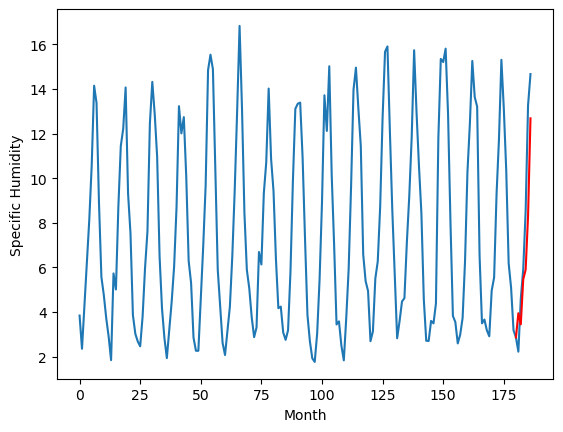

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.46		3.80		0.34
2.89		3.31		0.42
4.18		5.32		1.14
5.85		5.76		-0.09
7.45		8.16		0.71
12.46		12.55		0.09
[180, 181, 182, 183, 184, 185, 186]
[2.61, 3.8037405350804327, 3.3062573114037512, 5.315295998156071, 5.758247409164905, 8.162562880814075, 12.545171771347523]


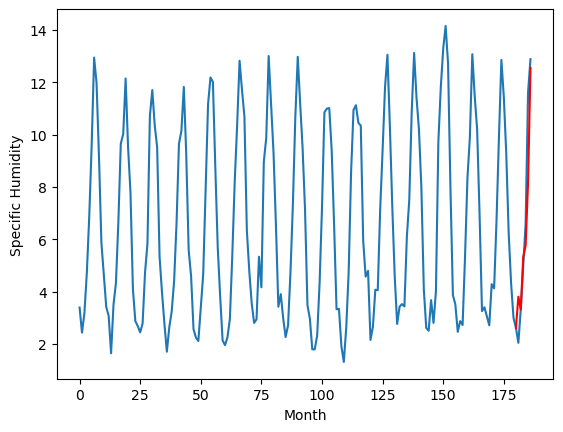

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    3.96   3.803741
1                 1    3.75   3.363741
2                 2    7.83   7.903741
3                 3    5.81   5.883741
4                 4    4.04   4.043741
5                 5    4.35   3.613741
6                 6    2.37   2.453741
7                 7    5.07   5.183741
8                 8    3.57   3.883741
9                 9    3.66   3.943741
10               10    3.46   3.803741


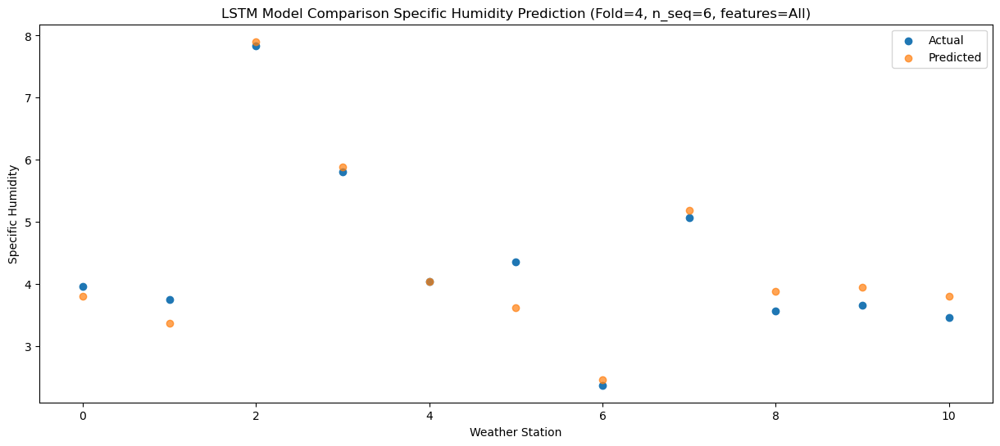

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    2.87   3.306257
1                 1    5.74   2.866257
2                 2    7.71   7.406257
3                 3    5.49   5.386257
4                 4    3.59   3.546257
5                 5    3.71   3.116257
6                 6    2.62   1.956257
7                 7    4.44   4.686257
8                 8    3.00   3.386257
9                 9    3.02   3.446257
10               10    2.89   3.306257


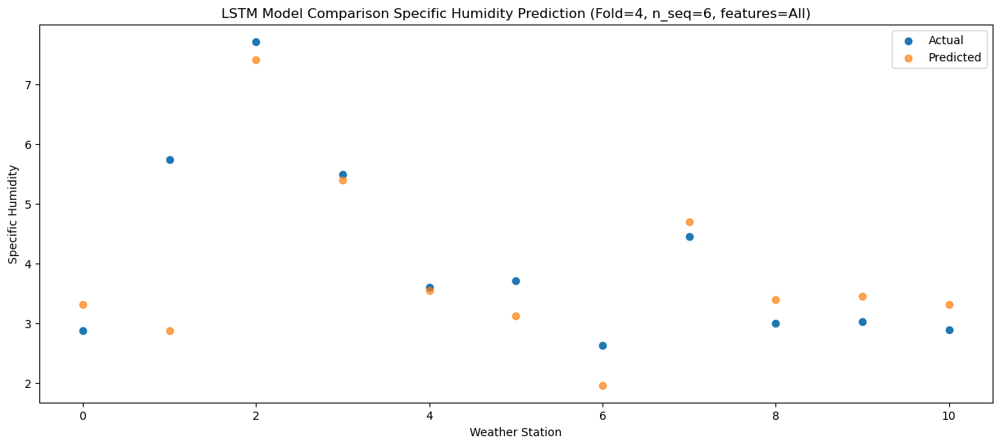

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    5.63   5.315296
1                 1    5.71   4.875296
2                 2   10.77   9.415296
3                 3    8.15   7.395296
4                 4    6.17   5.555296
5                 5    5.20   5.125296
6                 6    4.33   3.965296
7                 7    6.81   6.695296
8                 8    4.94   5.395296
9                 9    5.39   5.455296
10               10    4.18   5.315296


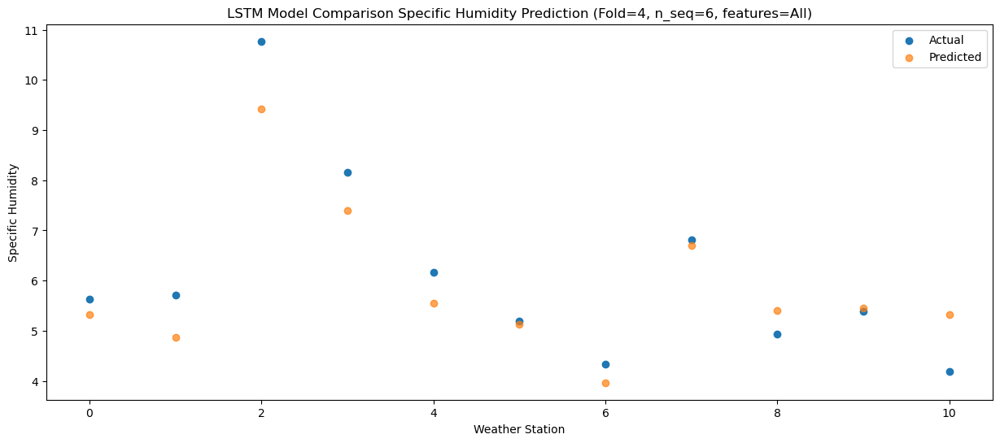

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    6.84   5.758247
1                 1    6.46   5.318247
2                 2   11.02   9.858247
3                 3    9.44   7.838247
4                 4    7.53   5.998247
5                 5    6.16   5.568247
6                 6    4.74   4.408247
7                 7    7.73   7.138247
8                 8    6.27   5.838247
9                 9    6.70   5.898247
10               10    5.85   5.758247


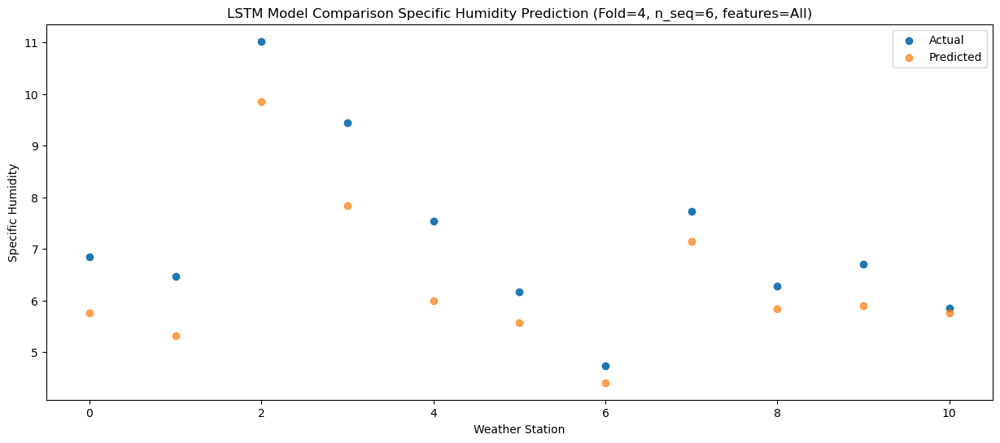

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.40   8.162563
1                 1    7.79   7.722563
2                 2   14.46  12.262563
3                 3   13.44  10.242563
4                 4   11.82   8.402563
5                 5   10.71   7.972563
6                 6    7.72   6.812563
7                 7   10.89   9.542563
8                 8    8.56   8.242563
9                 9    9.32   8.302563
10               10    7.45   8.162563


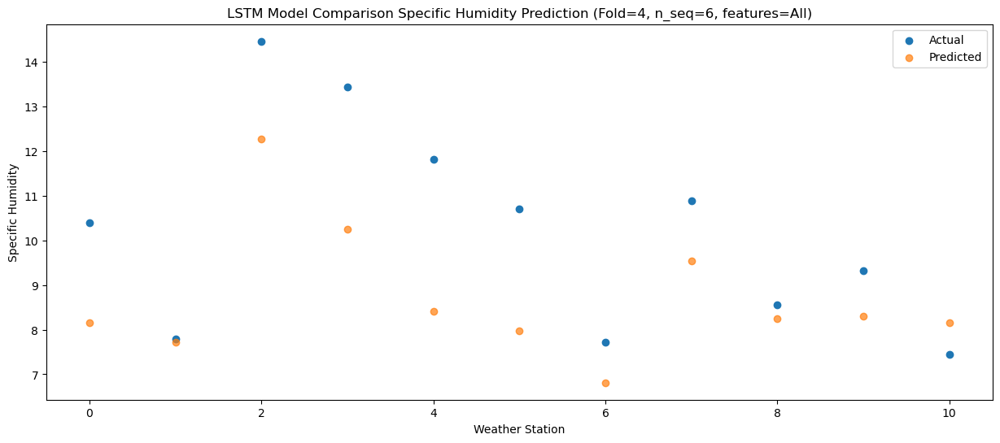

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.99  12.545172
1                 1   12.08  12.105172
2                 2   18.70  16.645172
3                 3   17.13  14.625172
4                 4   15.70  12.785172
5                 5   13.01  12.355172
6                 6   12.41  11.195172
7                 7   15.49  13.925172
8                 8   13.62  12.625172
9                 9   14.07  12.685172
10               10   12.46  12.545172


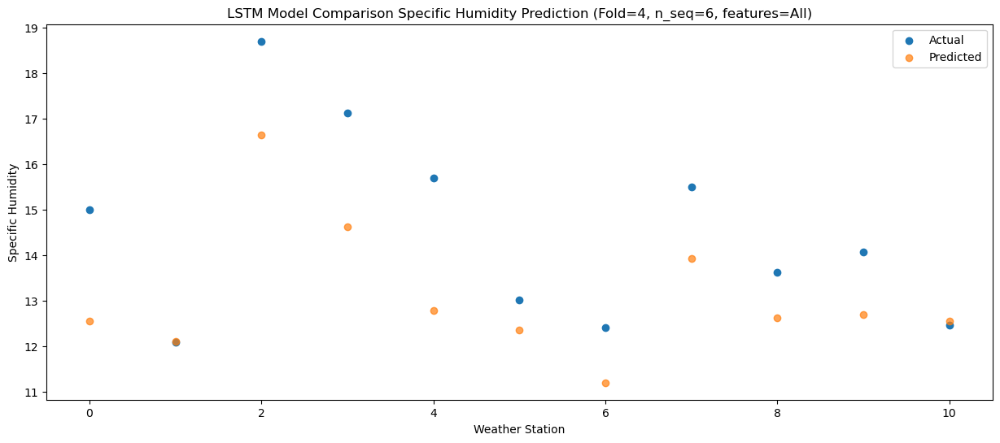

f, t:
[[ 3.96  3.75  7.83  5.81  4.04  4.35  2.37  5.07  3.57  3.66  3.46]
 [ 2.87  5.74  7.71  5.49  3.59  3.71  2.62  4.44  3.    3.02  2.89]
 [ 5.63  5.71 10.77  8.15  6.17  5.2   4.33  6.81  4.94  5.39  4.18]
 [ 6.84  6.46 11.02  9.44  7.53  6.16  4.74  7.73  6.27  6.7   5.85]
 [10.4   7.79 14.46 13.44 11.82 10.71  7.72 10.89  8.56  9.32  7.45]
 [14.99 12.08 18.7  17.13 15.7  13.01 12.41 15.49 13.62 14.07 12.46]]
[[ 3.80374054  3.36374054  7.90374054  5.88374054  4.04374054  3.61374054
   2.45374054  5.18374054  3.88374054  3.94374054  3.80374054]
 [ 3.30625731  2.86625731  7.40625731  5.38625731  3.54625731  3.11625731
   1.95625731  4.68625731  3.38625731  3.44625731  3.30625731]
 [ 5.315296    4.875296    9.415296    7.395296    5.555296    5.125296
   3.965296    6.695296    5.395296    5.455296    5.315296  ]
 [ 5.75824741  5.31824741  9.85824741  7.83824741  5.99824741  5.56824741
   4.40824741  7.13824741  5.83824741  5.89824741  5.75824741]
 [ 8.16256288  7.72256288 12.2625

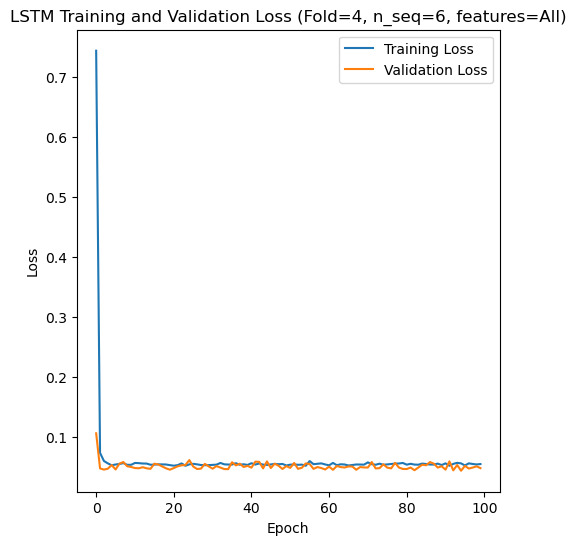

[[0.881842834546187], [1.0527742009443282], [1.589656040938095], [1.5684348923752562], [1.2451472312697558]]
[[array(0.88184283)], [array(1.0527742)], [array(1.58965604)], [array(1.56843489)], [array(1.24514723)]]
[[0.6532617103624521], [0.7469419232281775], [1.124656181443821], [1.1033231918920166], [0.8864541749340114]]
[[0.0772839744255508], [0.09890276807437148], [0.14383953688772066], [0.20225505586330697], [0.10925564660435899]]
[[0.9520791230845203], [0.9348925863564819], [0.833602631880238], [0.7858860752055605], [0.9062835496176889]]
[[array(0.07728397)], [array(0.09890277)], [array(0.14383954)], [array(0.20225506)], [array(0.10925565)]]
[[array(0.95730421)], [array(0.96213188)], [array(0.83529335)], [array(0.78797798)], [array(0.9549608)]]
[ 3.9   3.41  6.58  6.97 10.12 14.93  5.74  6.45  8.66  8.88 11.37 16.12
  8.41  8.56 10.41 10.65 13.41 18.03  5.55  5.46  8.91  9.48 12.99 16.89
  7.36  6.96  9.8  11.2  15.21 18.9   4.02  4.61  6.18  7.19  9.69 14.95
  6.35  6.4   7.99  8

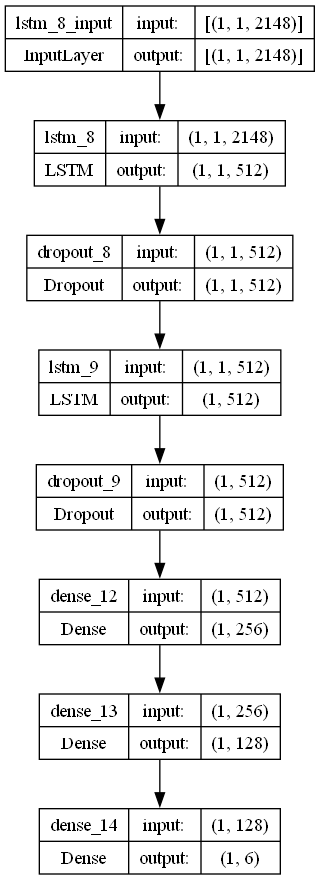

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit the best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    lr = 0.029865625955005016  
    optimizer = Adam(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 512
    dropout_rate = 0.3645710240362355

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (specific_humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=All)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))
print("")
print("Average Specific Humidity:"+str(np.mean(actual_avg_list)))
print("RMSE % of Specific Humidity:"+str(np.mean(rmse2_avg_list)/np.mean(actual_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_SH_S6.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)